# Projet n°5 : Segmentez des clients d'un site e-commerce - Phase Modélisation

**Rappel de la consigne :**

Faire une segmentation d'une base de données client, dans le but de cibler les campagnes de communication par les équipes Marketing.

Dans un précédent notebook, nous avons pu créer un dataset compilant un maximum de données sur chacun de nos clients, ce qui représente 92492 lignes. Celui-ci a été nettoyé et structuré, pour être désormais entrainé dans des modèles de machine learning non-supervisés, dans l'objectif de faire un partitionnement de celui-ci et regrouper les individus ayant des ressemblances et similitudes à travers les données récoltées et conservées.

Notre souhait est de se rappocher dans un premier temps de la RFM, avec les trois KPI clefs : récence, fréquence et montant.
Cependant, nous verrons si nous pouvons aller plus loin, et être plus précis en ajoutant d'autres critères tel que la satisfacton, la localisation ou encore les types de produits.
Selon l'exemple proposé dans le mail de recommandation, le nombre de 6 clusters semble le plus approprié à notre analyse. Nous essayerons d'approcher se nombre en tenant des comptes de la performance de notre partitionnement selon les métriques associés.

# I. Importation des librairies & des données

## 1. Importer les librairies

In [1]:
# Librairies de base python 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import missingno as msno
from scipy.stats import ks_2samp
import warnings
import joblib

# librairies pour le pre-processing des données
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import QuantileTransformer
from sklearn.ensemble import IsolationForest

# Ajustement des hyperparamètres
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import ParameterGrid

# librairies pour les algorithmes de machine learning
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.tree import DecisionTreeClassifier

# Métrique de performance
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn import metrics
from sklearn.metrics import adjusted_rand_score

# Librairies Yellowbrick
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from yellowbrick.cluster import InterclusterDistance
from yellowbrick.features import RadViz

# Librairies pour les projections
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import umap

## 2. Importer les données

In [2]:
# Importer les données du fichier csv
df = pd.read_csv('df_clean.csv')

# II. Visualisation du dataset

In [3]:
# Afficher le dataset df_cust
print('Structure du dataframe :',df.shape)
pd.set_option('display.max_columns', None)
df.head()

Structure du dataframe : (92492, 40)


,customer_unique_id,customer_zip_code_prefix_most_frequent,customer_city_most_frequent,customer_state_most_frequent,geolocation_lat_most_frequent,geolocation_lng_most_frequent,total_orders,total_items,total_price,total_freight_value,avg_product_description_length,avg_product_weight_g,avg_product_volume_cm3,latest_order_purchase_timestamp,total_characters_review_comment_message_sum,avg_review_score_mean,avg_délaiSatisfaction_mean,max_payment_sequential,payment_value_sum,payment_installments_mean,time_shipping_mean,time_order_mean,écart_Prév_mean,oldest_order_purchase,tot_ord_2016,tot_ord_2017,tot_ord_2018,cat_Baby_Kids,cat_Electronics_Computers,cat_Entertainment,cat_Miscellaneous,time_since_last_purch,time_since_first_purch,mean_items_per_order,mean_price_per_order,payment_is_credit_card,cat_Health_Beauty_clothing,cat_Home_Tools,single/mult_orders,ratio_freight
0,0000366f3b9a7992bf8c76cfdf3221e2,7787,cajamar,SP,-23.340235,-46.830140,1,1,129.90,12.00,236.0,1500.0,7616.0,2018-05-10 10:56:27,111.0,5.0,4.0,1,141.90,8.0,4.0,6.0,-5.0,2018-05-10 10:56:27,0,0,1,0.0,0.0,0.0,0.0,111,111,1.0,141.90,1,0.0,1.0,0,0.084567
1,0000b849f77a49e4a4ce2b2a4ca5be3f,6053,osasco,SP,-23.559115,-46.787626,1,1,18.90,8.29,635.0,375.0,5148.0,2018-05-07 11:11:27,0.0,4.0,0.0,1,27.19,1.0,1.0,3.0,-5.0,2018-05-07 11:11:27,0,0,1,0.0,0.0,0.0,0.0,114,114,1.0,27.19,1,1.0,0.0,0,0.304892
2,0000f46a3911fa3c0805444483337064,88115,sao jose,SC,-27.542880,-48.633426,1,1,69.00,17.22,177.0,1500.0,43750.0,2017-03-10 21:05:03,0.0,3.0,1.0,1,86.22,8.0,23.0,25.0,-2.0,2017-03-10 21:05:03,0,1,0,0.0,0.0,1.0,0.0,536,536,1.0,86.22,1,0.0,0.0,0,0.199722
3,0000f6ccb0745a6a4b88665a16c9f078,66812,belem,PA,-1.312214,-48.483159,1,1,25.99,17.63,1741.0,150.0,1045.0,2017-10-12 20:29:41,12.0,4.0,1.0,1,43.62,4.0,19.0,20.0,-12.0,2017-10-12 20:29:41,0,1,0,0.0,1.0,0.0,0.0,320,320,1.0,43.62,1,0.0,0.0,0,0.404172
4,0004aac84e0df4da2b147fca70cf8255,18040,sorocaba,SP,-23.505548,-47.469705,1,1,180.00,16.89,794.0,6050.0,528.0,2017-11-14 19:45:42,0.0,5.0,4.0,1,196.89,6.0,11.0,13.0,-8.0,2017-11-14 19:45:42,0,1,0,0.0,1.0,0.0,0.0,287,287,1.0,196.89,1,0.0,0.0,0,0.085784


In [4]:
# Afficher les caractéristiques stats du df
df.describe(include ='all')

,customer_unique_id,customer_zip_code_prefix_most_frequent,customer_city_most_frequent,customer_state_most_frequent,geolocation_lat_most_frequent,geolocation_lng_most_frequent,total_orders,total_items,total_price,total_freight_value,avg_product_description_length,avg_product_weight_g,avg_product_volume_cm3,latest_order_purchase_timestamp,total_characters_review_comment_message_sum,avg_review_score_mean,avg_délaiSatisfaction_mean,max_payment_sequential,payment_value_sum,payment_installments_mean,time_shipping_mean,time_order_mean,écart_Prév_mean,oldest_order_purchase,tot_ord_2016,tot_ord_2017,tot_ord_2018,cat_Baby_Kids,cat_Electronics_Computers,cat_Entertainment,cat_Miscellaneous,time_since_last_purch,time_since_first_purch,mean_items_per_order,mean_price_per_order,payment_is_credit_card,cat_Health_Beauty_clothing,cat_Home_Tools,single/mult_orders,ratio_freight
count,92492,92492.000000,92492,92492,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.00000,92492,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000,92492.000000
unique,92492,NaN,4040,27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92252,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92255,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,0000366f3b9a7992bf8c76cfdf3221e2,NaN,sao paulo,SP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018-04-11 10:48:14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018-04-11 10:48:14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,14415,38900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,35172.027462,NaN,NaN,-21.194314,-46.193160,1.033549,1.179778,141.404174,23.522520,792.656159,2100.112936,15162.332936,NaN,28.412133,4.153425,2.585574,1.138207,164.957196,2.913451,8.849178,12.053431,-11.88989,NaN,0.002843,0.464873,0.565833,0.085970,0.158966,0.122858,0.181955,236.818092,239.475933,1.138826,160.061079,0.765882,0.144983,0.305267,0.030100,0.208068
std,NaN,29845.498732,NaN,NaN,5.611792,4.057211,0.209640,0.617388,214.533505,22.756934,645.498194,3727.510205,23114.224985,NaN,49.598904,1.280233,9.788677,2.451551,225.121976,2.689392,8.666574,9.460372,10.06566,NaN,0.053854,0.529267,0.522847,0.278856,0.364555,0.326774,0.383903,152.614886,153.126298,0.522734,218.306055,0.423448,0.350627,0.458558,0.170863,0.124814
min,NaN,1003.000000,NaN,NaN,-33.689948,-72.668881,1.000000,1.000000,0.850000,0.000000,4.000000,0.000000,168.000000,NaN,0.000000,1.000000,0.000000,1.000000,9.590000,0.000000,-17.000000,0.000000,-147.00000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,9.590000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,11347.000000,NaN,NaN,-23.590310,-48.131834,1.000000,1.000000,47.650000,14.050000,360.000000,300.000000,2850.000000,NaN,0.000000,4.000000,1.000000,1.000000,63.000000,1.000000,4.000000,6.000000,-17.00000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,113.000000,115.000000,1.000000,62.310000,1.000000,0.000000,0.000000,0.000000,0.116608
50%,NaN,24422.000000,NaN,NaN,-22.924511,-46.633115,1.000000,1.000000,89.700000,17.600000,603.000000,700.000000,6500.000000,NaN,0.000000,5.000000,1.000000,1.000000,107.780000,2.000000,7.000000,10.000000,-12.00000,NaN,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,218.000000,221.000000,1.000000,105.560000,1.000000,0.000000,0.000000,0.000000,0.183116
75%,NaN,58998.750000,NaN,NaN,-20.135904,-43.635297,1.000000,1.000000,153.992500,25.480000,991.000000,1825.000000,18252.000000,NaN,41.000000,5.000000,3.000000,1.000000,182.290000,4.000000,12.000000,15.000000,-7.00000,NaN,0.000000,1.000000,1.000000,0.000000

<Axes: >

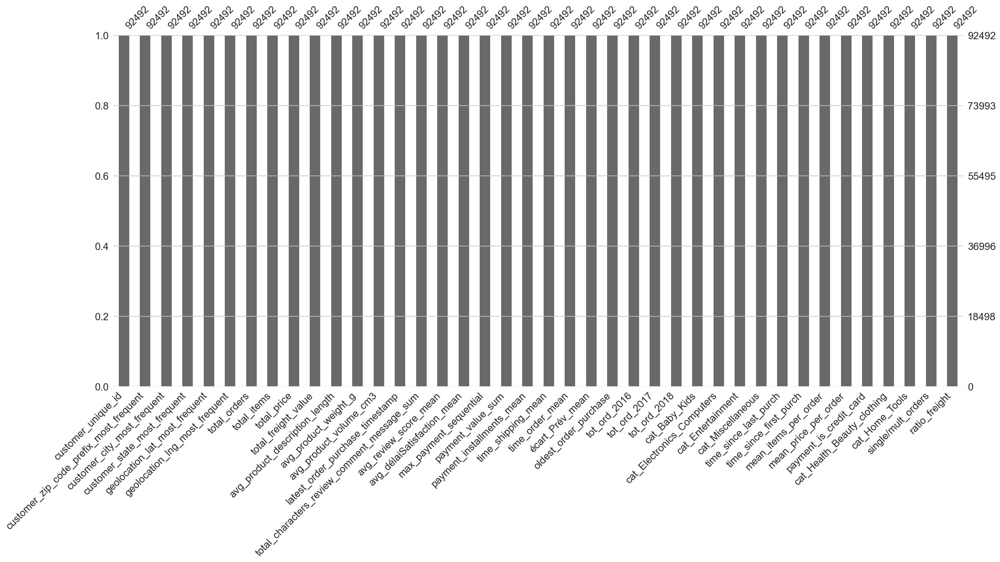

In [5]:
# Vérification de l'exhaustivité des données dans chaque variable
msno.bar(df)

# III. PCA
*Analyse des composantes et charges factorielles selon la sélection des variables*

Cette PCA a pour vocation de guider le choix des features à sélectionner avant la modélisation, en analysant leurs charges factorielles sur les composantes créées.

In [42]:
# Liste des variables disponibles dans le dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92492 entries, 0 to 92491
Data columns (total 40 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   customer_unique_id                           92492 non-null  object 
 1   customer_zip_code_prefix_most_frequent       92492 non-null  int64  
 2   customer_city_most_frequent                  92492 non-null  object 
 3   customer_state_most_frequent                 92492 non-null  object 
 4   geolocation_lat_most_frequent                92492 non-null  float64
 5   geolocation_lng_most_frequent                92492 non-null  float64
 6   total_orders                                 92492 non-null  int64  
 7   total_items                                  92492 non-null  int64  
 8   total_price                                  92492 non-null  float64
 9   total_freight_value                          92492 non-null  float64
 10

## 1. Sélection des features

In [9]:
acp_col = [
    
    # Démographiques et Géographiques
    #'customer_unique_id', 
    #'customer_zip_code_prefix_most_frequent',
    #'customer_city_most_frequent', 
    #'customer_state_most_frequent',
    #'geolocation_lat_most_frequent', 
    #'geolocation_lng_most_frequent',
    
    # Comportement d'Achat
    'total_orders', 
    'total_items', 
    #'total_price', 
    #'total_freight_value',
    'time_since_last_purch', 
    #'time_since_first_purch',
    
    # Préférence Produit
    'avg_product_weight_g',
    'avg_product_volume_cm3',
    #'cat_Baby_Kids', 
    #'cat_Electronics_Computers', 
    #'cat_Entertainment', 
    #'cat_Miscellaneous',
    #'cat_Health_Beauty_clothing',
    #'cat_Home_Tools',
    
    # Satisfaction client
    'avg_review_score_mean',
    #'avg_délaiSatisfaction_mean',
    'total_characters_review_comment_message_sum',
    
    # Paiement et Transport
    'payment_value_sum', 
    'payment_installments_mean', 
    #'max_payment_sequential',
    #'payment_is_credit_card',
    'time_shipping_mean',
    #'time_order_mean', 
    'écart_Prév_mean', 
    'ratio_freight',
    
    # Fréquence d'Achat
    'tot_ord_2016', 
    'tot_ord_2017', 
    'tot_ord_2018',
    #'mean_items_per_order', 
    #'mean_price_per_order',
    'single/mult_orders'
]

data_acp = df[acp_col]

## 2. Application de la PCA

In [10]:
# Standardiser les données
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_acp)

# Appliquer l'ACP
pca = PCA()
components = pca.fit_transform(data_scaled)

# Variance expliquée par chaque composante principale
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

# Charges factorielles (components)
loadings = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(len(acp_col))], index=acp_col)

## 3. Visualisation des composantes & des charges factorielles

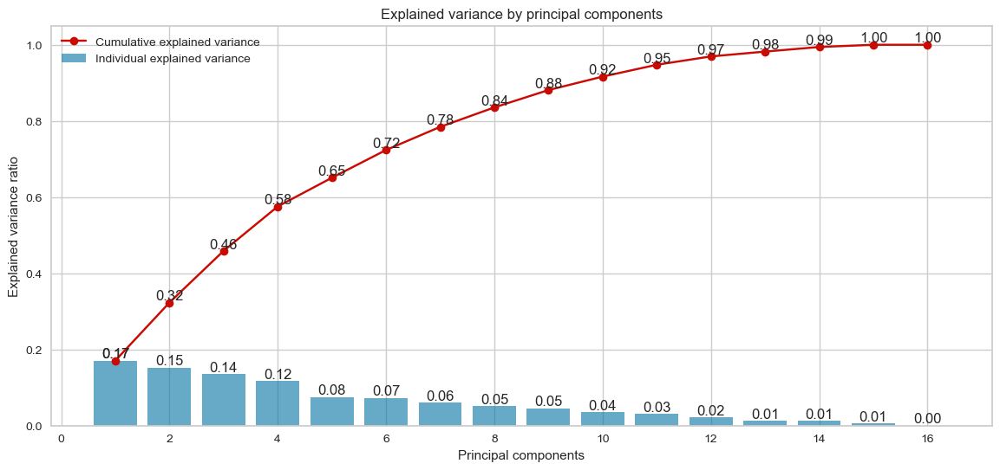

In [11]:
# Visualiser la variance expliquée
plt.figure(figsize=(14, 6))

# Barres pour la variance expliquée individuelle
bars = plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.6, label='Individual explained variance')

# Ajouter des étiquettes de valeur pour chaque barre
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.2f}', ha='center', va='bottom')

# Courbe pour la variance expliquée cumulée
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', color='r', label='Cumulative explained variance')

# Ajouter des étiquettes de valeur pour chaque point de la courbe cumulée
for i, value in enumerate(cumulative_variance):
    plt.text(i + 1, value, f'{value:.2f}', ha='center', va='bottom')

plt.xlabel('Principal components')
plt.ylabel('Explained variance ratio')
plt.legend(loc='best')
plt.title('Explained variance by principal components')
plt.show()

In [12]:
# Appliquer un style de couleur directement sur le DataFrame
styled_loadings = loadings.style.background_gradient(cmap='coolwarm').format(precision=2)

# Afficher le DataFrame stylisé
styled_loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16
total_orders,0.09,0.45,0.40,-0.03,-0.12,-0.09,0.08,-0.18,-0.14,-0.07,0.08,0.02,-0.01,-0.00,0.68,-0.27
total_items,0.07,0.35,0.25,0.00,0.04,0.11,-0.08,0.55,0.46,0.06,-0.46,-0.22,0.03,-0.02,-0.04,0.00
time_since_last_purch,0.53,-0.18,0.05,0.04,0.02,0.05,0.08,-0.00,0.03,0.01,0.04,-0.20,-0.79,-0.05,0.02,0.00
avg_product_weight_g,0.15,0.27,-0.45,-0.08,-0.39,0.12,-0.02,-0.07,-0.03,-0.04,-0.07,-0.04,0.05,-0.71,-0.00,-0.00
avg_product_volume_cm3,0.16,0.25,-0.44,-0.08,-0.42,0.14,-0.02,-0.08,-0.03,-0.06,-0.14,-0.07,-0.02,0.70,0.00,-0.00
avg_review_score_mean,-0.01,-0.10,0.05,-0.48,-0.18,-0.35,0.18,-0.04,-0.09,0.71,-0.21,-0.05,-0.00,-0.00,-0.01,0.00
total_characters_review_comment_message_sum,0.04,0.17,0.01,0.27,0.26,0.53,-0.34,-0.27,-0.20,0.55,-0.11,0.01,0.00,0.00,0.00,0.00
payment_value_sum,0.12,0.36,-0.27,-0.09,0.26,-0.12,0.01,0.15,0.39,0.26,0.57,0.35,-0.06,0.04,0.00,0.00
payment_installments_mean,0.12,0.20,-0.23,-0.05,0.39,-0.15,0.09,0.46,-0.68,-0.08,-0.16,0.09,-0.04,0.01,0.01,0.00
time_shipping_mean,0.02,0.04,-0.08,0.58,-0.10,-0.21,0.30,0.12,-0.06,0.24,0.28,-0.57,0.20,0.02,-0.01,0.00


## 4. Table des corrélations

In [7]:
pd.set_option('display.width', None) 
# Calcul des corrélations
correlation_matrix = data_acp.corr()

# Jeu de couleurs
correlation_matrix =  correlation_matrix.style.background_gradient(cmap='coolwarm').format(precision=2)

correlation_matrix

,total_orders,total_items,time_since_last_purch,avg_product_weight_g,avg_product_volume_cm3,avg_review_score_mean,total_characters_review_comment_message_sum,payment_value_sum,payment_installments_mean,time_shipping_mean,écart_Prév_mean,tot_ord_2016,tot_ord_2017,tot_ord_2018,single/mult_orders
total_orders,1.00,0.44,-0.02,-0.01,-0.01,0.01,0.10,0.12,0.02,-0.01,-0.01,0.01,0.23,0.17,0.91
total_items,0.44,1.00,-0.01,-0.00,0.00,-0.11,0.12,0.23,0.07,-0.03,-0.03,0.01,0.09,0.08,0.40
time_since_last_purch,-0.02,-0.01,1.00,0.04,0.06,-0.01,0.01,-0.00,0.05,0.07,-0.10,0.15,0.78,-0.82,-0.02
avg_product_weight_g,-0.01,-0.00,0.04,1.00,0.81,-0.03,0.04,0.36,0.20,0.03,0.01,0.00,0.02,-0.03,-0.01
avg_product_volume_cm3,-0.01,0.00,0.06,0.81,1.00,-0.03,0.04,0.33,0.18,0.02,0.01,0.01,0.05,-0.05,-0.01
avg_review_score_mean,0.01,-0.11,-0.01,-0.03,-0.03,1.00,-0.37,-0.04,-0.03,-0.30,-0.27,-0.01,0.01,-0.01,0.01
total_characters_review_comment_message_sum,0.10,0.12,0.01,0.04,0.04,-0.37,1.00,0.07,0.05,0.09,0.06,0.03,0.02,0.02,0.10
payment_value_sum,0.12,0.23,-0.00,0.36,0.33,-0.04,0.07,1.00,0.32,0.04,-0.02,0.00,0.03,0.02,0.11
payment_installments_mean,0.02,0.07,0.05,0.20,0.18,-0.03,0.05,0.32,1.00,0.06,-0.03,0.02,0.06,-0.05,0.03
time_shipping_mean,-0.01,-0.03,0.07,0.03,0.02,-0.30,0.09,0.04,0.06,1.00,0.58,-0.02,0.02,-0.02,-0.01


# IV. Clustering avec le k-means

## 1. Première modélisation

Lors de la phase exploratoire, nous avons vu que les variables concernant les catégories pour les produits, les variables encodées pour les types de paiements et les variables liées à la géolocalisation, semblaient peu informatives lorsque nous avons fait une ACP, car quasiment aucune charge factorielle sur les 10 premières composantes. De plus, elles ne rentrent pas directement dans les segments de la RFM.
Mon choix se porte donc sur une sélection de variables lié à la RFM, à la satisfaction client et au transport, ainsi que la typologie produit.
Voici le contenu de cette sélection :

**RFM (Récence, Fréquence, Montant), Satisfaction client, Transport & Typologie produits**

**Récence**
- Time since last purch : Nombre de jour depuis la dernière commande

**Fréquence :**
- Total_orders : Nombre total d'achats effectués.
- Single/mult_orders : Commandes uniques / commandes multiples --> variable booléenne
  
**Montant**
- Payment value sum : Somme totale des paiements.
- Payment installments mean : Nombre moyen de versements.
- Mean price per order : Prix moyen par commande.
  
**Satisfaction client :**

- Avg_review_score_mean : Moyenne de la note donnée par le client
- Total_characters_review_comment_message_sum : Somme totale des caractères des commentaires de révision.

**Transport :**

- Ratio_freight : Ratio du fret.
- Time_shipping_mean : Temps d'expédition moyen.
- Écart_Prév_mean : Écart moyen par rapport à la date prévue.

**Typologie produit :**

- Avg_product_weight_g : Poids moyen du produit en grammes.
- Avg_product_volume_cm3 : Volume moyen du produit en centimètres cubes.

### a. La selection des variables + application du standard scaler

In [105]:
# Sélection des colonnes à inclure
selected_features_km = ['total_orders',
                        'total_items',
                        'avg_product_weight_g',
                        'avg_product_volume_cm3',
                        'avg_review_score_mean',
                        'total_characters_review_comment_message_sum',
                        'time_since_last_purch',
                        'payment_value_sum',
                        'ratio_freight',
                        'payment_installments_mean',
                        'time_shipping_mean',
                        'écart_Prév_mean',
                        'single/mult_orders',
                        'mean_price_per_order'
                    ]

# Création d'un dataframe avec seulement les colonnes sélectionnées
df_km = df[selected_features_km].copy()

# Extraction des valeurs à partir du dataframe
X = df_km.values

# Création du scaler de sklearn
scaler = StandardScaler()

# Application du StandardScaler aux colonnes numériques
X_scaled = scaler.fit_transform(X)

# Création d'un nouveau dataframe pour stocker les données mises à l'échelle
df_km_scaled = pd.DataFrame(X_scaled, columns=selected_features_km)

### b. Recherche du k optimal

#### i. Méthode du coude

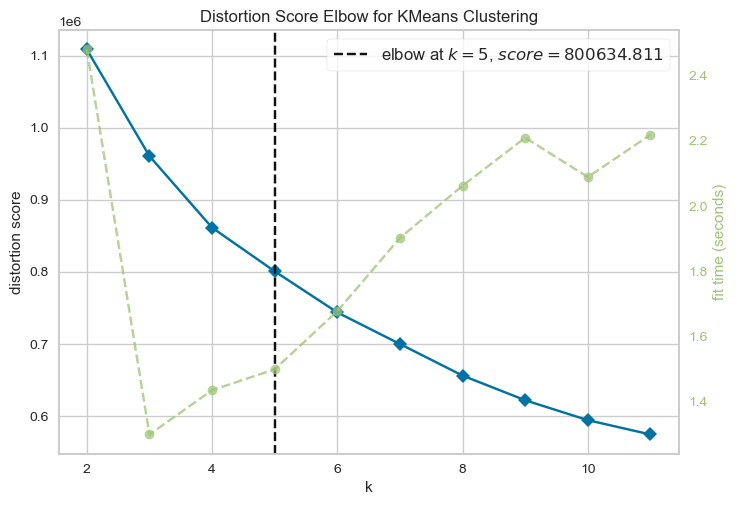

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [106]:
# Initialisation de KMeans
model = KMeans()

# Utilisation de la visualisation Elbow
visualizer = KElbowVisualizer(model, k=(2, 12))

visualizer.fit(X_scaled)
visualizer.show()

Le nombre optimal de K semble se positionner à **5**.

#### ii. Variations du coefficient de silhouette selon les valeurs de k

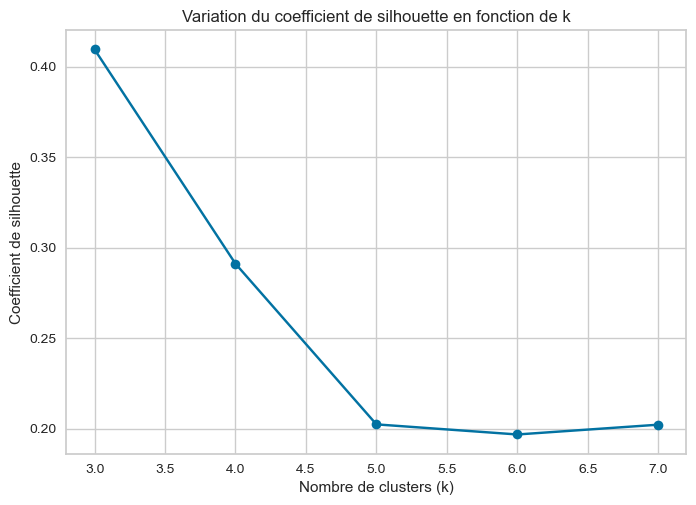

In [107]:
# Liste des valeurs de k à tester
k_values = range(3, 8) 

# Initialiser une liste pour stocker les coefficients de silhouette pour chaque k
silhouette_scores = []

# Parcourir chaque valeur de k
for k in k_values:
    # Créer un modèle K-means avec k clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    
    # Effectuer le clustering
    cluster_labels = kmeans.fit_predict(X_scaled)
    
    # Calculer le coefficient de silhouette
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    
    # Ajouter le coefficient de silhouette à la liste
    silhouette_scores.append(silhouette_avg)

# Tracer le graphique
plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Nombre de clusters (k)')
plt.ylabel('Coefficient de silhouette')
plt.title('Variation du coefficient de silhouette en fonction de k')
plt.grid(True)
plt.show()

Notre silhouette score se dégrade très nettement après k =4, nous allons partir sur une segmentation avec 4 clusters, qui paraît peu pour notre approche métier mais pour notre première modélisation nous allons tester un k = 4.

In [108]:
# Stockage de la valeur k = 4 dans un objet k
k = 4

### c. Lancement du k-means sur les données

In [109]:
# Initialisation du modèle K-means
kmeans = KMeans(n_clusters=k, random_state=42)

# Apprentissage du modèle
kmeans.fit(df_km_scaled)

# Ajout des labels de clusters au DataFrame
df_km['cluster'] = kmeans.labels_

# Affichage des centres de clusters
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
cluster_centers_df = pd.DataFrame(cluster_centers, columns=selected_features_km)

cluster_centers_df

,total_orders,total_items,avg_product_weight_g,avg_product_volume_cm3,avg_review_score_mean,total_characters_review_comment_message_sum,time_since_last_purch,payment_value_sum,ratio_freight,payment_installments_mean,time_shipping_mean,écart_Prév_mean,single/mult_orders,mean_price_per_order
0,1.000000,1.265247,1567.394977,12035.128362,1.811716,83.241392,235.322950,143.745190,0.219390,2.979282,16.889845,-3.535308,3.330669e-16,143.745190
1,1.000417,1.251913,10540.875354,63056.238709,4.150021,31.415913,250.652525,596.178628,0.134057,5.659897,8.631868,-12.730491,4.173042e-04,595.241662
2,1.000000,1.096957,1329.684266,10814.390985,4.618460,15.987312,236.391184,118.438851,0.213905,2.597930,7.284024,-13.437300,-2.348816e-15,118.438851
3,2.110713,2.615908,1967.698364,14343.353961,4.199433,57.678968,219.051236,305.183465,0.199199,3.294142,8.501493,-12.611340,9.964171e-01,145.342624


In [110]:
# Afficher la transposition du df
cluster_centers_df.T

,0,1,2,3
total_orders,1.000000e+00,1.000417,1.000000e+00,2.110713
total_items,1.265247e+00,1.251913,1.096957e+00,2.615908
avg_product_weight_g,1.567395e+03,10540.875354,1.329684e+03,1967.698364
avg_product_volume_cm3,1.203513e+04,63056.238709,1.081439e+04,14343.353961
avg_review_score_mean,1.811716e+00,4.150021,4.618460e+00,4.199433
total_characters_review_comment_message_sum,8.324139e+01,31.415913,1.598731e+01,57.678968
time_since_last_purch,2.353230e+02,250.652525,2.363912e+02,219.051236
payment_value_sum,1.437452e+02,596.178628,1.184389e+02,305.183465
ratio_freight,2.193899e-01,0.134057,2.139054e-01,0.199199
payment_installments_mean,2.979282e+00,5.659897,2.597930e+00,3.294142


In [111]:
# Transposer le DataFrame
cluster_centers_df_transposed = cluster_centers_df.T

# Fonction pour appliquer la couleur en fonction de l'échelle de chaque ligne
def colorize_by_row(series):
    # Normaliser les valeurs entre 0 et 1 pour créer une échelle de couleurs
    normalized_values = (series - series.min()) / (series.max() - series.min())
    # Utiliser une colormap
    colors = plt.cm.RdYlBu(normalized_values)
    # Convertir les valeurs RGBA en valeurs hexadécimales
    hex_colors = [rgb2hex(color) for color in colors]
    return ['background-color: %s' % color for color in hex_colors]

# Convertir les valeurs RGBA en hexadécimal
def rgb2hex(rgb):
    return '#{:02x}{:02x}{:02x}'.format(int(rgb[0] * 255), int(rgb[1] * 255), int(rgb[2] * 255))

# Appliquer la couleur ligne par ligne
styled_df = cluster_centers_df_transposed.style.apply(colorize_by_row, axis=1)
styled_df

,0,1,2,3
total_orders,1.000000,1.000417,1.000000,2.110713
total_items,1.265247,1.251913,1.096957,2.615908
avg_product_weight_g,1567.394977,10540.875354,1329.684266,1967.698364
avg_product_volume_cm3,12035.128362,63056.238709,10814.390985,14343.353961
avg_review_score_mean,1.811716,4.150021,4.618460,4.199433
total_characters_review_comment_message_sum,83.241392,31.415913,15.987312,57.678968
time_since_last_purch,235.322950,250.652525,236.391184,219.051236
payment_value_sum,143.745190,596.178628,118.438851,305.183465
ratio_freight,0.219390,0.134057,0.213905,0.199199
payment_installments_mean,2.979282,5.659897,2.597930,3.294142


In [112]:
# Nombre de clients par cluster
cluster_counts = df_km['cluster'].value_counts()

print("Nombre de clients par cluster:")
print(cluster_counts)

Nombre de clients par cluster:
cluster
2    68826
0    13711
1     7164
3     2791
Name: count, dtype: int64


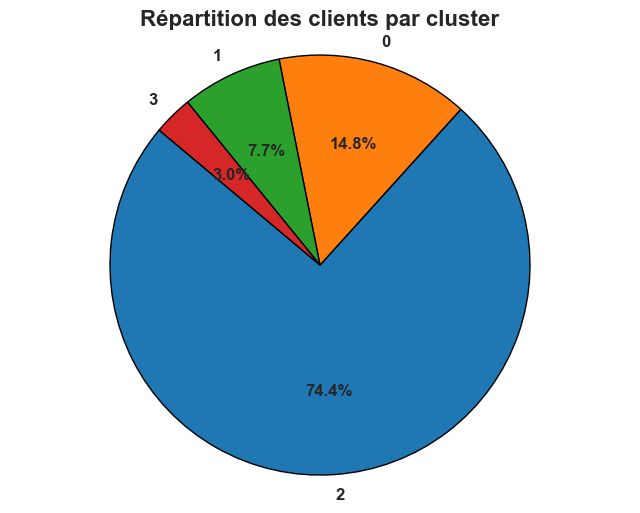

In [113]:
# Nombre de clients par cluster
cluster_counts = df_km['cluster'].value_counts()

# Couleurs pour chaque cluster
colors = plt.cm.tab10.colors[:len(cluster_counts)]

# Création du diagramme circulaire
plt.figure(figsize=(8, 6))
plt.pie(cluster_counts, 
        labels=cluster_counts.index, 
        autopct='%1.1f%%', 
        startangle=140, 
        colors=colors, 
        wedgeprops={'edgecolor': 'black', 'linewidth': 1},
        textprops={'fontsize': 12, 'fontweight': 'bold'})
plt.axis('equal')  # Aspect ratio égal pour dessiner un cercle
plt.title('Répartition des clients par cluster', fontsize=16, fontweight='bold')
plt.show()


### d. Métriques de performance de la modélisation

In [114]:
# Calcul des métriques
silhouette = silhouette_score(df_km_scaled, kmeans.labels_)
davies_bouldin = davies_bouldin_score(df_km_scaled, kmeans.labels_)
calinski_harabasz = calinski_harabasz_score(df_km_scaled, kmeans.labels_)

# Affichage des métriques
print("Silhouette Score:", silhouette)
print("Davies-Bouldin Index:", davies_bouldin)
print("Calinski-Harabasz Index:", calinski_harabasz)

Silhouette Score: 0.29107332210608255
Davies-Bouldin Index: 1.5619901394412394
Calinski-Harabasz Index: 15523.706235652216


Les résultats suggèrent que les clusters sont bien séparés les uns des autres avec une bonne compacité intra-cluster.
Cependant, il semble qu'il existe encore un certain chevauchement entre les clusters, comme le montre le coefficient de silhouette et l'indice Davies-Bouldin.

### e. Analyse de la segmentation obtenue

#### i. Boxplot

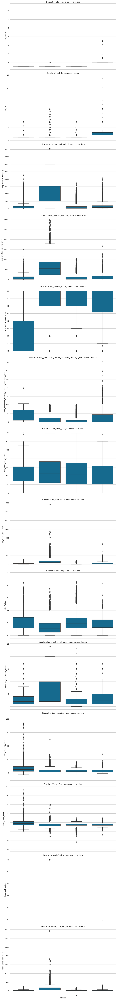

In [117]:
# création du fonction pour créer un boxplot pour chacune des variables sur les clusters créés
def boxplot_clusters(data, cluster_column, attributes):
    # Fonction pour tracer des boxplots pour chaque variable avec les 4 clusters
    num_attributes = len(attributes)
    fig, axes = plt.subplots(num_attributes, 1, figsize=(10, 6*num_attributes), sharex=True)
    for i, attribute in enumerate(attributes):
        sns.boxplot(x=cluster_column, y=attribute, data=data, ax=axes[i])
        axes[i].set_title(f'Boxplot of {attribute} across clusters')
        axes[i].set_xlabel('Cluster')
        axes[i].set_ylabel(attribute)
    plt.tight_layout()
    plt.show()

# Utilisation de la fonction pour tracer les boxplots
boxplot_clusters(df_km, 'cluster', selected_features_km)


#### ii. Radarplot

Cluster 1


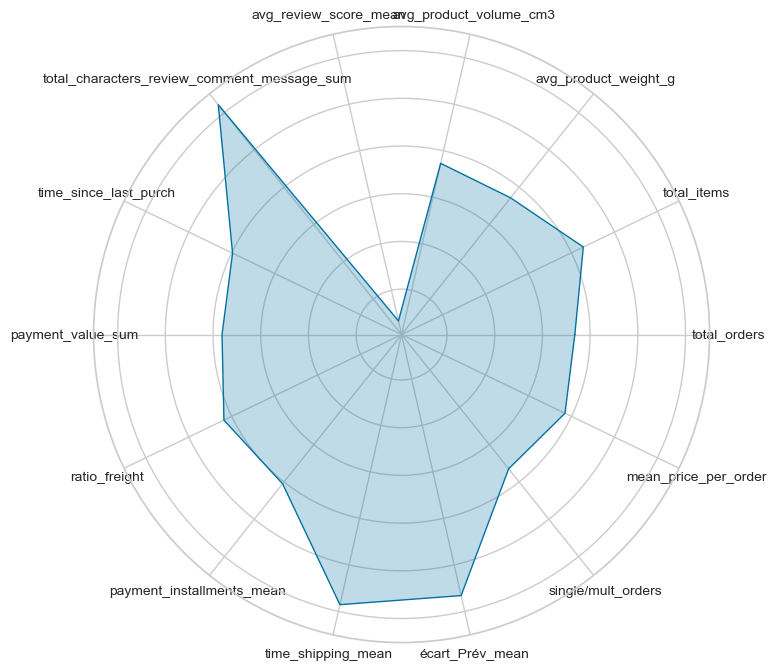

Cluster 2


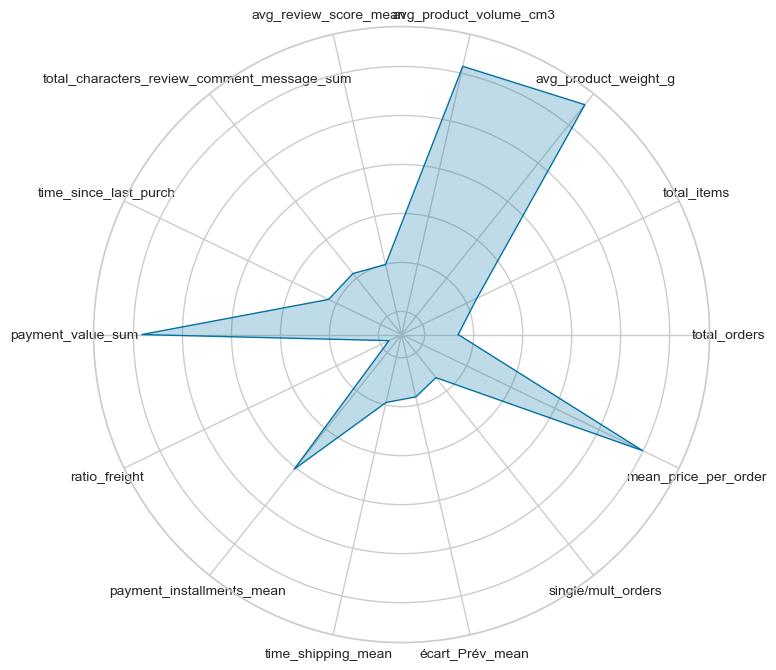

Cluster 3


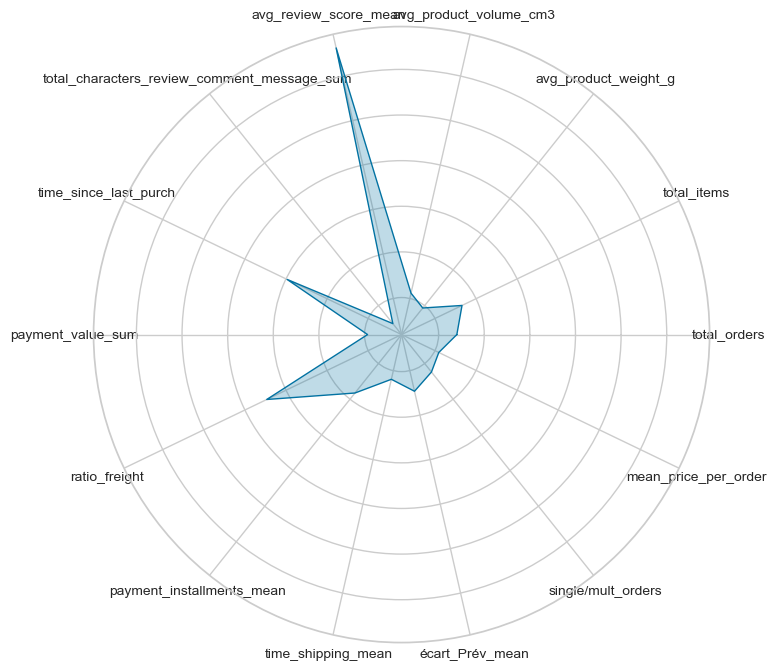

Cluster 4


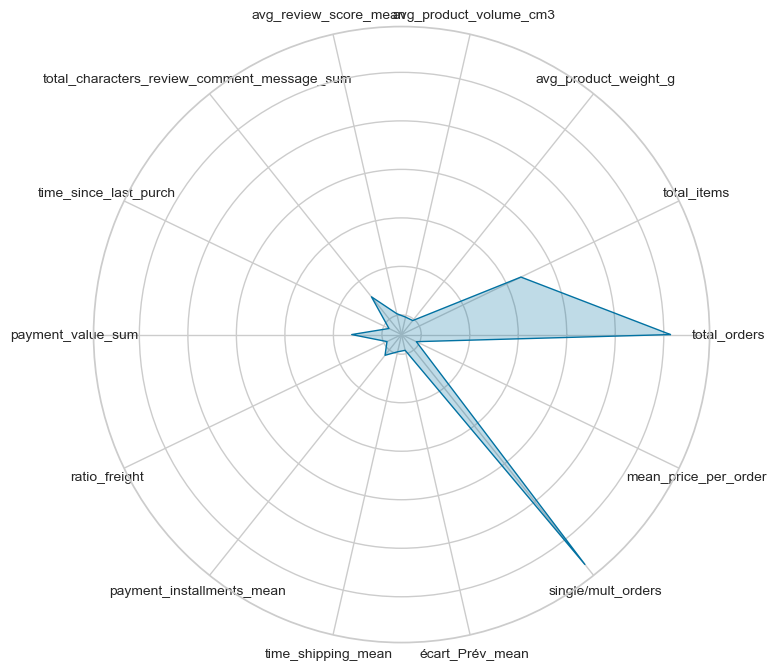

In [121]:
# Interpréter les clusters via des radarplot
def radar_plot(cluster_center, attributes):
    # Fonction pour tracer un radar plot pour un cluster
    num_attributes = len(attributes)
    angles = np.linspace(0, 2 * np.pi, num_attributes, endpoint=False).tolist()
    angles += angles[:1]  
    
    fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
    
    values = cluster_center.tolist()
    values += values[:1]
    ax.plot(angles, values, linewidth=1, linestyle='solid')
    ax.fill(angles, values, alpha=0.25)
    
    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(attributes)
    plt.show()

# Assurez-vous que k correspond au nombre de clusters que vous voulez
k = 4

# Affichage des centres de clusters
cluster_centers = kmeans.cluster_centers_[:k] 

# Tracer les radar plots pour chaque cluster
for i in range(len(cluster_centers)):
    print(f"Cluster {i+1}")
    radar_plot(cluster_centers[i], selected_features_km)


#### iii. Interprétation métier des profils obtenus

**Cluster n°1 : 7 081 clients soit 7,7%**

Profil du client :
- légèrement plus d'une commande par client
- 1 client sur 4 achète plus d'un article
- produits volumineux & lourd
- montants élevés, avec le plus de versements moyens
- fréquence d'achat faible
- bon retour client avec 4,14
- % des coûts de transports faibles

**Cluster n°0 : 13 765 clients soit 14,9%**

Profil du client :
- commande unique par client
- 1 client sur 4 achète plus d'un article
- produits assez légers et peu volumineux
- montants faibles
- fréquence nulle car commande unique par client
- mauvais retour client avec 1,82 avec des avis longs
- % des frais de transport élevés, temps de transport longs et écart réel / prévu le moins bon

**Cluster n°3 : 68 658 clients soit 74,4%**

Profil du client :
- commande unique par client
- quasiment 1 seul produit à chaque commande unique
- produits assez légers et peu volumineux
- montants faibles
- fréquence nulle car commande unique par client
- meilleur retour client avec 4,6, avec peu de commentaires
- délais de transport faible

**Cluster n°3 : 2 788 clients soit 3%**

Profil du client :
- plus de deux commandes par clients
- plus de 2 articles par commande avec 2,6 items par client
- produits assez légers et peu volumineux
- montants moyens
- bonne satisfaction client avec 4,2

Après avoir regarder les résultats obtenus lors de cette première segmentation, nous pouvons déjà voir trois clusters qui se démarquent :

- le premier avec des clients étant moins réguliers dans leur commande mais avec de gros montant, liés à des articles lourds et volumineux donc quu'on imagine plus onéreux

- le second est très clair dans les clients représentés. Ce sont les clients mécontents et déçus par leur commande, où on remarque tout d'abord une commande unique par client et avec des notes et retour mauvais et des commentaires assez long sûrement pour remonter leur mécontentement. On peut y voir un lie avec les délais de transport plus longs et un écart prévue / réelle nettement moins bon que les autres segments.

- le troisième est le plus disparate et sans caractères particulier, très fortement représenté avec quasiment 75% des clients. Il semble le nombre k = 4 ne soit pas assez elevé pour notre approche métier. Il y a également le choix des variables qui est sûrement à revoir.

- le quatrième représente les clients fidèles et convaincus avec néanmoins des commandes avec des montants qui ne sont pas les plus élevés par rapport à la première catégorie.

#### iv. Visualisation des segments

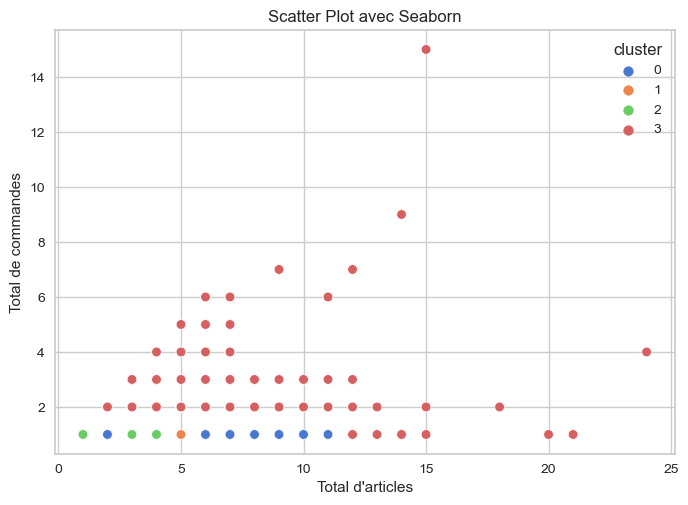

In [25]:
# Utilisation d'une palette de couleurs différente
palette = "muted"

# Création du scatter plot avec Seaborn
sns.scatterplot(x='total_items', y='total_orders', hue='cluster', palette=palette, data=df_km)

# Ajout des titres et des labels
plt.title('Scatter Plot avec Seaborn')
plt.xlabel('Total d\'articles')
plt.ylabel('Total de commandes')

# Affichage du plot
plt.show()



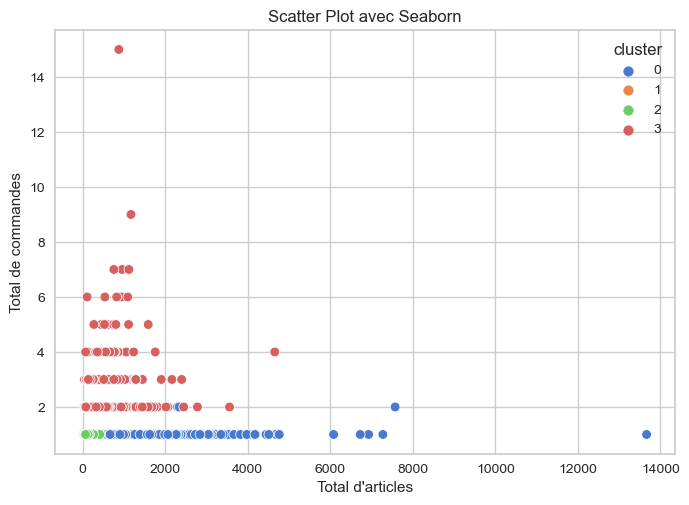

In [26]:
# Utilisation d'une palette de couleurs différente
palette = "muted"

# Création du scatter plot avec Seaborn
sns.scatterplot(x='payment_value_sum', y='total_orders', hue='cluster', palette=palette, data=df_km)

# Ajout des titres et des labels
plt.title('Scatter Plot avec Seaborn')
plt.xlabel('Total d\'articles')
plt.ylabel('Total de commandes')

# Affichage du plot
plt.show()



#### v. Visualisation des clusters obtenus

#### PCA

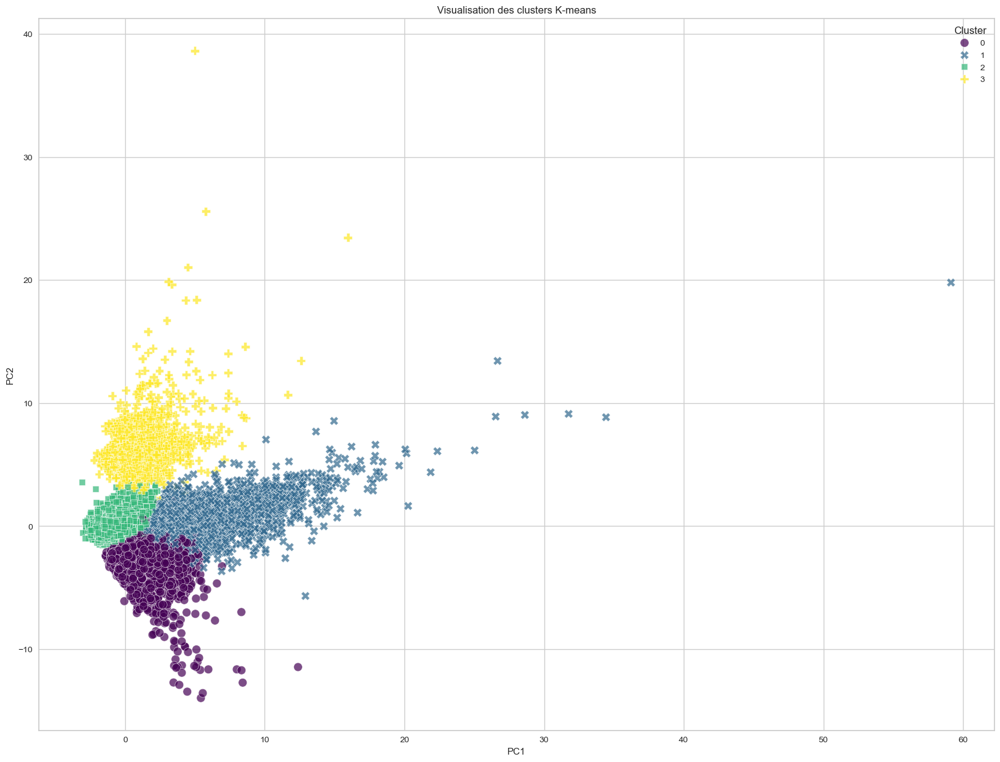

In [125]:
# Normalisation des données
scaler = StandardScaler()
df_km_scaled_pca = scaler.fit_transform(df_km)

# Réduction avec une PCA pour visualisation en deux composantes
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(df_km_scaled_pca)

# Ajouter les labels des clusters aux données réduites
reduced_data_with_clusters = pd.DataFrame(reduced_data, columns=['PC1', 'PC2'])
reduced_data_with_clusters['cluster'] = kmeans.labels_

# Visualisation avec ajustements
plt.figure(figsize=(20, 15))
sns.scatterplot(
    data=reduced_data_with_clusters, 
    x='PC1', 
    y='PC2', 
    hue='cluster', 
    palette='viridis', 
    style='cluster',  
    s=100,             
    alpha=0.7,         
    edgecolor='w',    
    linewidth=0.5
)
plt.title('Visualisation des clusters K-means')
plt.legend(loc='upper right', title='Cluster')
plt.show()

#### T-SNE

C:\Users\justi\AppData\Local\Temp\ipykernel_14380\4271430723.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(cluster_centers))


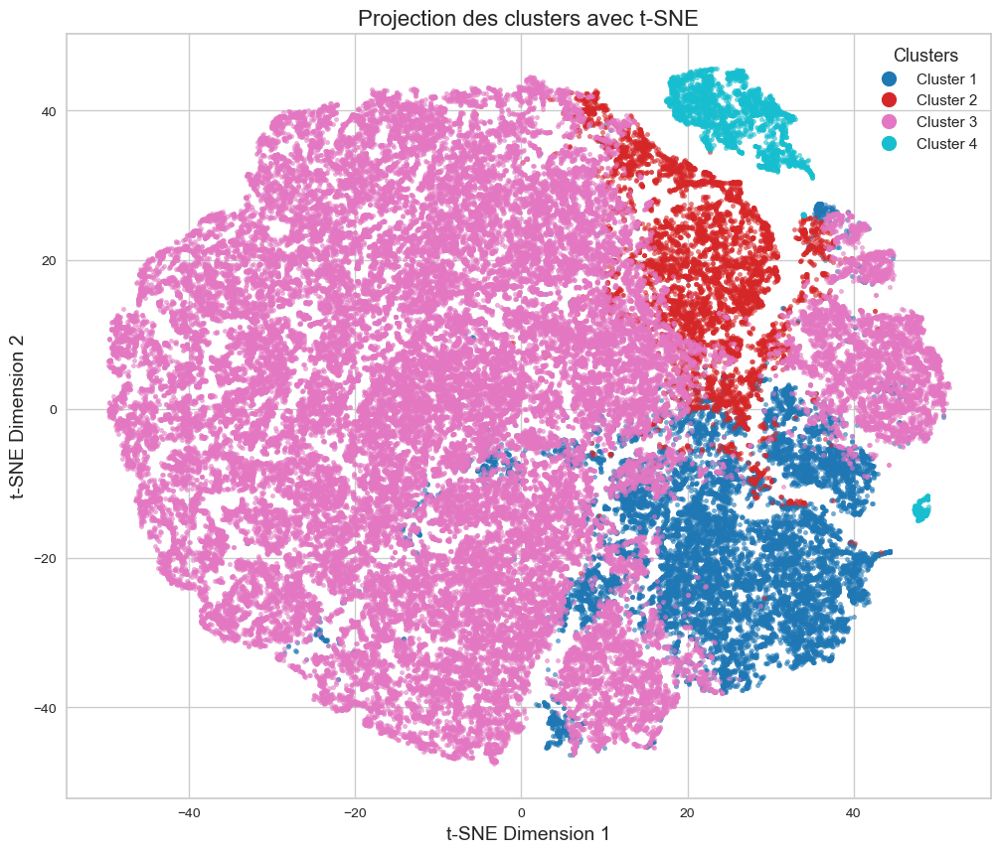

In [122]:
# Réduction de dimension avec t-SNE en spécifiant les paramètres init et learning_rate
tsne = TSNE(n_components=2, random_state=42, init='random', learning_rate=200.0)
cluster_tsne = tsne.fit_transform(df_km_scaled)

# Définir une palette de couleurs distinctes
colors = plt.cm.get_cmap('tab10', len(cluster_centers))

# Tracer la projection des clusters
plt.figure(figsize=(12, 10))
for i in range(len(cluster_centers)):
    plt.scatter(cluster_tsne[df_km['cluster'] == i][:, 0], 
                cluster_tsne[df_km['cluster'] == i][:, 1], 
                s=10, alpha=0.6, label=f'Cluster {i+1}', c=np.array(colors(i)).reshape(1, -1))

# Créer des handles personnalisés pour la légende avec une taille de point plus grande
from matplotlib.lines import Line2D
handles = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {i+1}',
                  markerfacecolor=np.array(colors(i)).reshape(1, -1), markersize=11) for i in range(len(cluster_centers))]

# Ajouter des éléments de style pour améliorer la lisibilité
plt.title('Projection des clusters avec t-SNE', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)
plt.legend(title='Clusters', title_fontsize='13', fontsize='11', handles=handles)
plt.grid(True)
plt.show()

#### Via MDS

C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


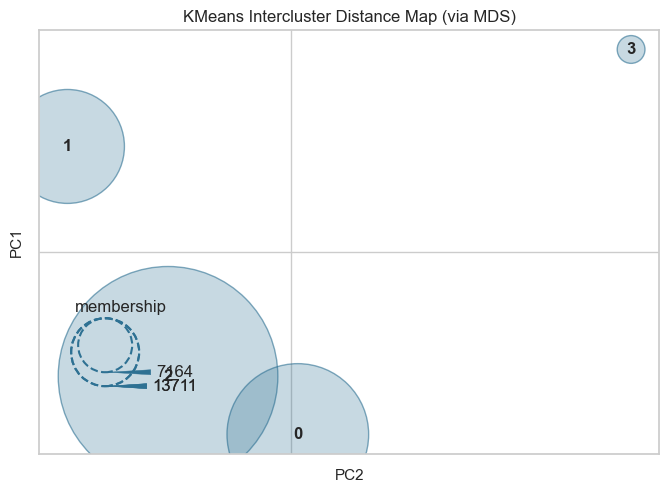

C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


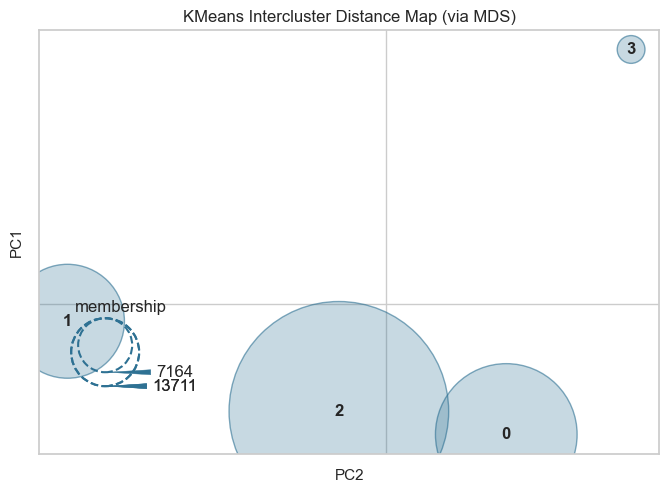

<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [123]:
# Visualisation des clusters dans l'espace PCA

# Instancier l'outil de visualisation de la distance entre clusters
visualizer = InterclusterDistance(kmeans)
visualizer.fit(X)
visualizer.show()

# Visualisation des clusters dans l'espace UMAP

# Instancier l'outil de visualisation de la distance entre clusters
visualizer = InterclusterDistance(kmeans, projection='umap')
visualizer.fit(X)
visualizer.show()


#### Avec Yellowbrick

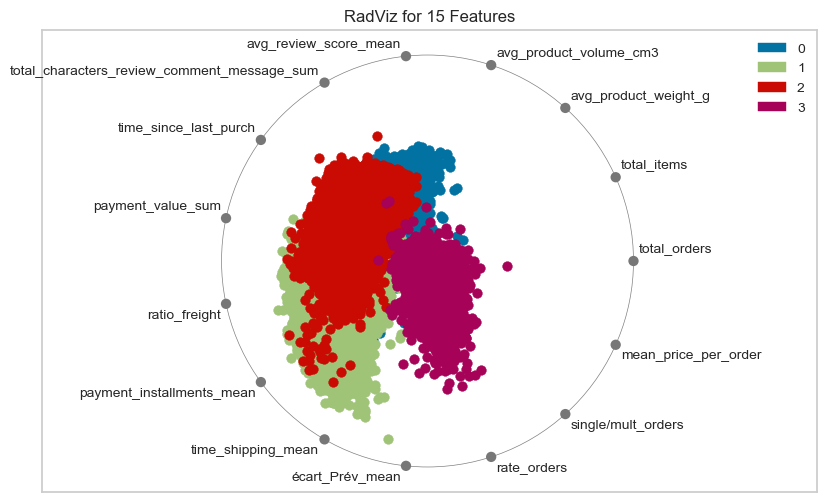

<Axes: title={'center': 'RadViz for 15 Features'}>

In [16]:
# Instancier l'objet Visualizer
visualizer = RadViz(features=selected_features_km, size=(1000, 600))

# Visualiser les données
visualizer.fit_transform(df_km_scaled, kmeans.labels_)

# Afficher le plot
visualizer.show()


C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


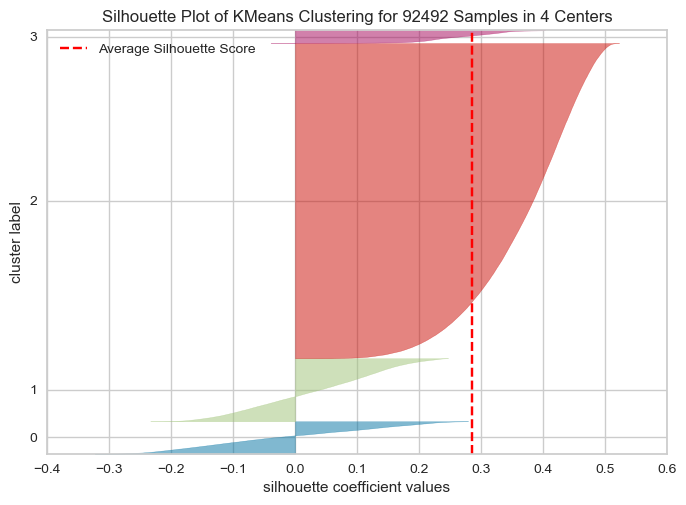

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 92492 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [17]:
# Création de la visualisation silhouette
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(df_km_scaled)
visualizer.poof() 

### g. Conclusion sur cette première modélisation

Pour cette première modélisation, le nombre de k = 4 ne semble pas adapté que ce soit au niveau de la modélisation, avec un coefficient de silhouette qui reste améliorable car il est de 0.28. On peut voir que certains segments se chevauchent comme le 1 et le 2 avec la projection UMAP.
Du point de vue métier, le nombre de cluster est trop faible, et nous donne un cluster trop généraliste et trop peu exploitable en terme 'marketing'.

### h. Importance des features

In [130]:
# Assurez-vous que df_km est correctement initialisé avec les mêmes features que X
df_km = pd.DataFrame(X, columns= selected_features_km)

# Puis, répétez les étapes de normalisation et d'ajustement du modèle
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

kmeans = KMeans(n_clusters=4, random_state=42)
kmeans.fit(X_scaled)

decision_tree = DecisionTreeClassifier(random_state=42)
decision_tree.fit(X_scaled, kmeans.labels_)

# Affichage de l'importance des features
feature_importance = pd.DataFrame(decision_tree.feature_importances_, index=df_km.columns, columns=['Importance'])
feature_importance.sort_values(by='Importance', ascending=False, inplace=True)
print(feature_importance)


                                             Importance
avg_review_score_mean                          0.384104
avg_product_weight_g                           0.156671
total_orders                                   0.111778
mean_price_per_order                           0.090404
total_characters_review_comment_message_sum    0.065135
time_shipping_mean                             0.061776
avg_product_volume_cm3                         0.035390
écart_Prév_mean                                0.028162
payment_value_sum                              0.020795
payment_installments_mean                      0.017705
single/mult_orders                             0.015960
time_since_last_purch                          0.004601
ratio_freight                                  0.004526
total_items                                    0.002992


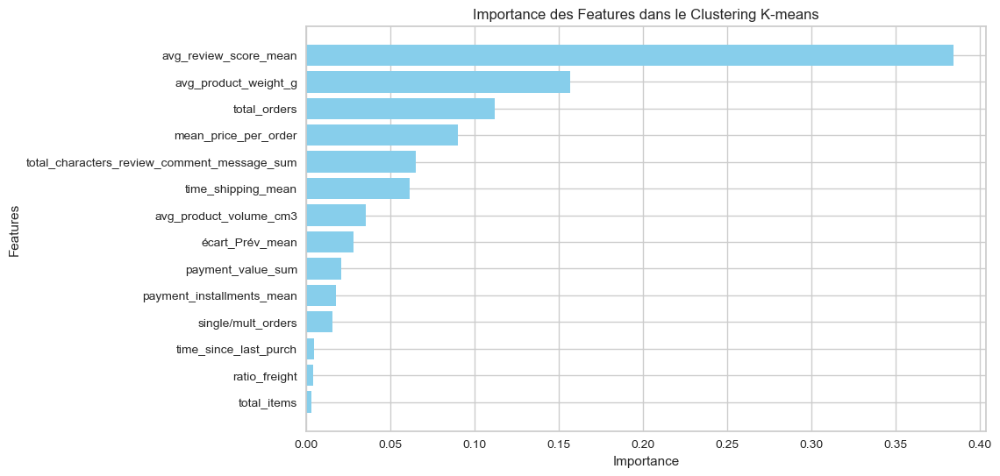

In [131]:
# Affichage de l'importance des features sous forme d'histogramme
plt.figure(figsize=(10, 6))
plt.barh(feature_importance.index, feature_importance['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Importance des Features dans le Clustering K-means')
plt.gca().invert_yaxis()
plt.show()


## 2. Analyse de plusieurs techniques de pre-processing

Lors de la première modélisation, des opérations de pre-processing n'ont pas été employées en amont, hors celle-ci peuvent contribuer à améliorer nos partitions. 
Voici des transformations possibles:
- la gestion des outliers
- la distribution des variables
- création de composantes avec UMAP


Nous allons donc regarder les variations de nos résultats, sur le k-means, en mettant en place un pre-processing différent :
- Outliers --> Isolation Forest
- Distribution --> Quantile Tranformers de Scikit/Learn

Il y a également une modification qui va être prise en compte qui vise à améliorer la notion de fréquence et récence de notre modèle. Nous aurons trois nouvelles variables à tester qui seront le nombre de total de commande par année, soit sur 2016, 2017 et 2018.

Notre volonté est d'atteindre un nombre de cluster plus élevé pour avoir une segmentation de nos clients plus précise, avec des profils plus complets.

A la suite de cette partie nous conclurons des apports (ou non) de ces manipulations

### Sélection des features identiques pour les tests.

In [3]:
# Sélection des variables
km2_col = [
    
    # Démographiques et Géographiques
    #'customer_unique_id', 
    #'customer_zip_code_prefix_most_frequent',
    #'customer_city_most_frequent', 
    #'customer_state_most_frequent',
    #'geolocation_lat_most_frequent', 
    #'geolocation_lng_most_frequent',
    
    # Comportement d'Achat
    'total_orders', 
    'total_items', 
    #'total_price', 
    #'total_freight_value',
    'time_since_last_purch', 
    #'time_since_first_purch',
    
    # Préférence Produit
    'avg_product_weight_g',
    'avg_product_volume_cm3',
    #'cat_Baby_Kids', 
    #'cat_Electronics_Computers', 
    #'cat_Entertainment', 
    #'cat_Miscellaneous',
    #'cat_Health_Beauty_clothing',
    #'cat_Home_Tools',
    
    # Satisfaction client
    'avg_review_score_mean',
    #'avg_délaiSatisfaction_mean',
    'total_characters_review_comment_message_sum',
    
    # Paiement et Transport
    'payment_value_sum', 
    'payment_installments_mean', 
    #'max_payment_sequential',
    #'payment_is_credit_card',
    'time_shipping_mean',
    #'time_order_mean', 
    'écart_Prév_mean', 
    #'ratio_freight',
    
    # Fréquence d'Achat
    'tot_ord_2016', 
    'tot_ord_2017', 
    'tot_ord_2018',
    #'mean_items_per_order', 
    #'mean_price_per_order',
    'single/mult_orders'
]

df_km2 = df[km2_col]

In [4]:
df_km2

,total_orders,total_items,time_since_last_purch,avg_product_weight_g,avg_product_volume_cm3,avg_review_score_mean,total_characters_review_comment_message_sum,payment_value_sum,payment_installments_mean,time_shipping_mean,écart_Prév_mean,tot_ord_2016,tot_ord_2017,tot_ord_2018,single/mult_orders
0,1,1,111,1500.0,7616.0,5.0,111.0,141.90,8.0,4.0,-5.0,0,0,1,0
1,1,1,114,375.0,5148.0,4.0,0.0,27.19,1.0,1.0,-5.0,0,0,1,0
2,1,1,536,1500.0,43750.0,3.0,0.0,86.22,8.0,23.0,-2.0,0,1,0,0
3,1,1,320,150.0,1045.0,4.0,12.0,43.62,4.0,19.0,-12.0,0,1,0,0
4,1,1,287,6050.0,528.0,5.0,0.0,196.89,6.0,11.0,-8.0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92487,1,2,446,30000.0,251625.0,5.0,0.0,2067.42,10.0,12.0,-27.0,0,1,0,0
92488,1,1,261,1720.0,32076.0,4.0,0.0,84.58,1.0,19.0,-3.0,0,1,0,0
92489,1,1,567,600.0,3315.0,5.0,0.0,112.46,1.0,14.0,-30.0,0,1,0,0
92490,1,1,118,444.0,4480.0,5.0,133.0,133.69,5.0,10.0,-14.0,0,0,1,0


### Analyse rapide avec une fonction avec 4 pre-processor différents

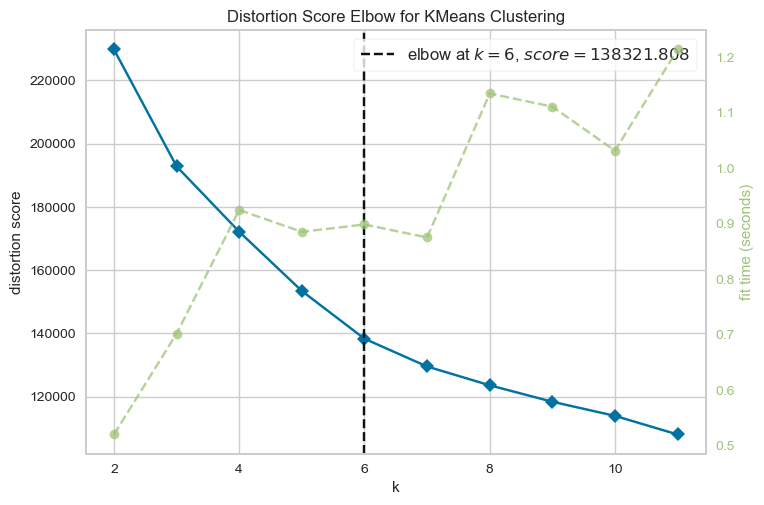

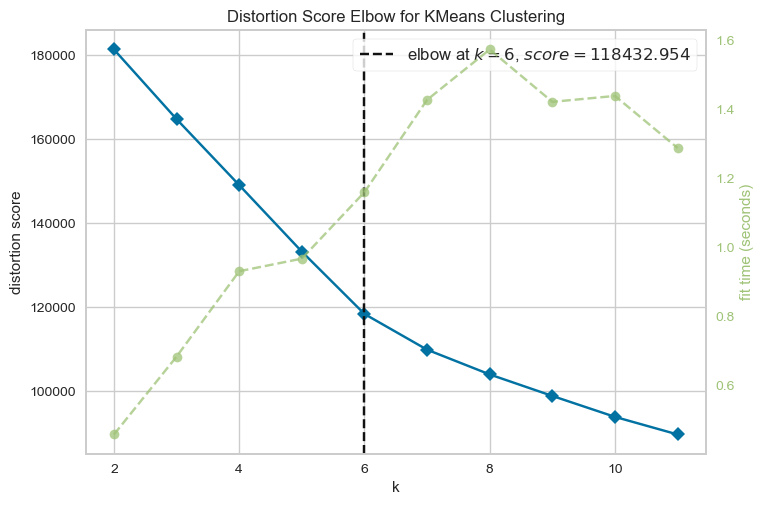

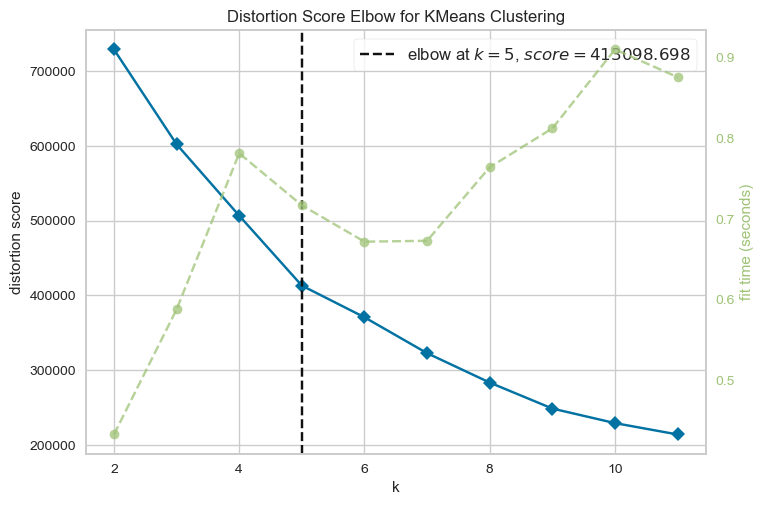

C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


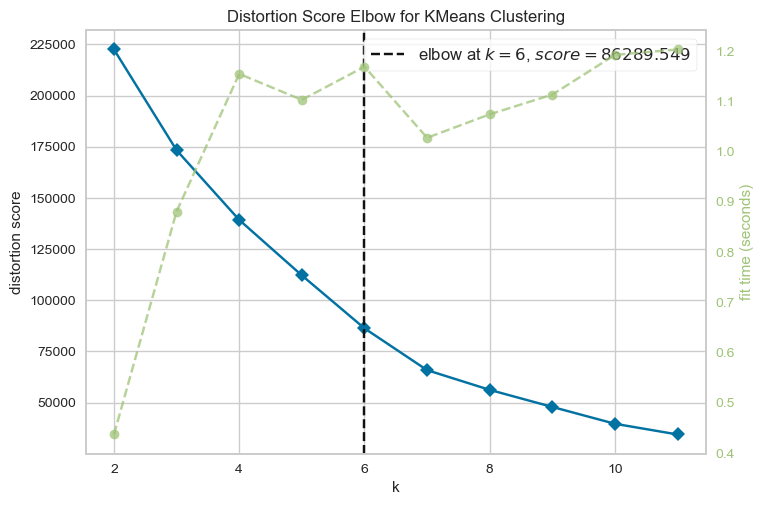

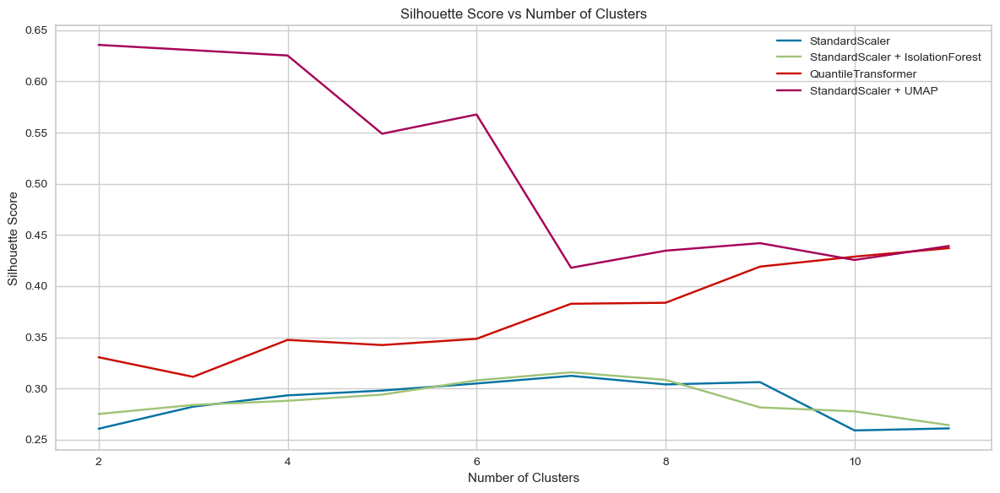

In [73]:
# Échantillonner 20% des données
df_km2s = df_km2.sample(frac=0.20, random_state=42)

# Extraire les valeurs sous forme de tableau NumPy
X_df_km2s = df_km2s.values

# Préprocessors
preprocessors = {
    'StandardScaler': StandardScaler(),
    'StandardScaler + IsolationForest': (StandardScaler(), IsolationForest(contamination=0.02, random_state=42)),
    'QuantileTransformer': QuantileTransformer(output_distribution='normal'),
    'StandardScaler + UMAP': (StandardScaler(), umap.UMAP(n_components=6, random_state=42))
}

def preprocess(X, preprocessor):
    """
    Applique le préprocesseur spécifié aux données.

    Parameters:
    X (np.ndarray): Données à prétraiter.
    preprocessor (object ou tuple): Le préprocesseur à utiliser. Peut être un seul objet (e.g., StandardScaler) ou un tuple contenant un scaler et un modèle d'IsolationForest ou UMAP.

    Returns:
    np.ndarray: Données prétraitées, filtrées si un IsolationForest est utilisé.
    """
    if isinstance(preprocessor, tuple):
        scaler, reducer = preprocessor
        X_scaled = scaler.fit_transform(X)
        if isinstance(reducer, IsolationForest):
            y_pred = reducer.fit_predict(X_scaled)
            return X_scaled[y_pred == 1]  # Sélectionner les points non considérés comme anomalies
        else:
            return reducer.fit_transform(X_scaled)
    else:
        return preprocessor.fit_transform(X)

# Évaluation des preprocessors
results = {}

for name, preprocessor in preprocessors.items():
    X_preprocessed = preprocess(X_df_km2s, preprocessor)
    silhouette_scores = []

    for k in range(2, 12):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(X_preprocessed)
        labels = kmeans.labels_
        
        silhouette_scores.append(silhouette_score(X_preprocessed, labels))

    results[name] = {
        'silhouette_scores': silhouette_scores
    }

    # Visualisation avec KElbowVisualizer
    model = KMeans()
    visualizer = KElbowVisualizer(model, k=(2, 12))
    
    visualizer.fit(X_preprocessed)
    visualizer.show()

# Tracé des résultats des scores de silhouette
fig, ax = plt.subplots(figsize=(12, 6))

for name, result in results.items():
    ax.plot(range(2, 12), result['silhouette_scores'], label=name)

ax.set_title('Silhouette Score vs Number of Clusters')
ax.set_xlabel('Number of Clusters')
ax.set_ylabel('Silhouette Score')
ax.legend()

plt.tight_layout()
plt.show()


### Draft & essais 

#### a. Gestion des outliers avec l'Isolation Forest

In [5]:
# Vérifier les colonnes et les données du DataFrame
print("Colonnes du DataFrame :", df_km2.columns)

# Initialiser le modèle Isolation Forest
iso_forest = IsolationForest(contamination=0.02, random_state=42)

# Ajuster le modèle aux données
iso_forest.fit(df_km2)

# Prédire les outliers et ajouter la colonne 'anomaly'
df_km2.loc[:, 'anomaly'] = iso_forest.predict(df_km2)

# Séparer les données en non-outliers et outliers
df_non_outliers = df_km2[df_km2['anomaly'] == 1].drop('anomaly', axis=1)
df_outliers = df_km2[df_km2['anomaly'] == -1].drop('anomaly', axis=1)

# Afficher les résultats
print("Nombre de non-outliers:", df_non_outliers.shape[0])
print("Nombre d'outliers:", df_outliers.shape[0])

Colonnes du DataFrame : Index(['total_orders', 'total_items', 'time_since_last_purch',
       'avg_product_weight_g', 'avg_product_volume_cm3',
       'avg_review_score_mean', 'total_characters_review_comment_message_sum',
       'payment_value_sum', 'payment_installments_mean', 'time_shipping_mean',
       'écart_Prév_mean', 'tot_ord_2016', 'tot_ord_2017', 'tot_ord_2018',
       'single/mult_orders'],
      dtype='object')


C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Nombre de non-outliers: 90642
Nombre d'outliers: 1850


C:\Users\justi\AppData\Local\Temp\ipykernel_2176\4243547292.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_km2.loc[:, 'anomaly'] = iso_forest.predict(df_km2)


C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


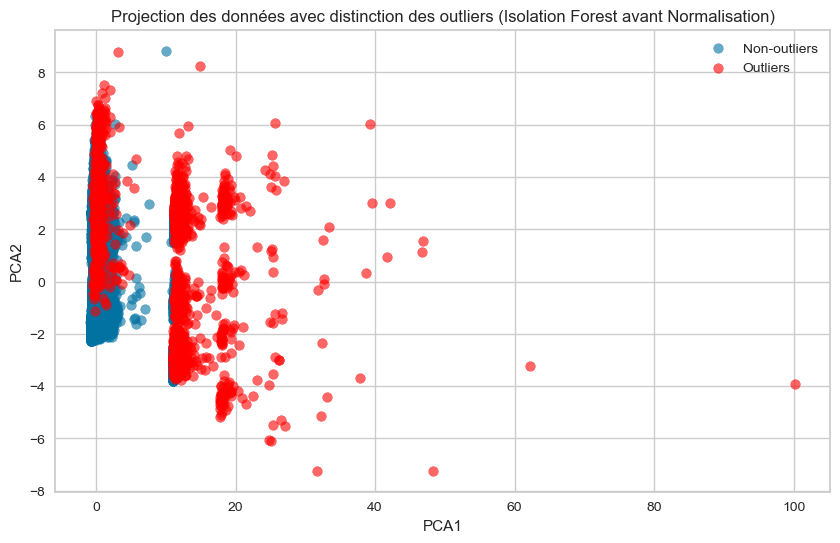

In [7]:
# Initialiser le modèle Isolation Forest
iso_forest = IsolationForest(contamination=0.02, random_state=42)

# Ajuster le modèle aux données brutes
iso_forest.fit(df_km2)

# Prédire les outliers et ajouter la colonne 'anomaly'
df_km2.loc[:, 'anomaly'] = iso_forest.predict(df_km2)

# Séparer les données en non-outliers et outliers
df_non_outliers = df_km2[df_km2['anomaly'] == 1].drop('anomaly', axis=1)
df_outliers = df_km2[df_km2['anomaly'] == -1].drop('anomaly', axis=1)

# Normaliser les données
scaler = StandardScaler()
df_non_outliers_normalized = pd.DataFrame(scaler.fit_transform(df_non_outliers), columns=df_non_outliers.columns)
df_outliers_normalized = pd.DataFrame(scaler.transform(df_outliers), columns=df_outliers.columns)

# Ajouter la colonne 'anomaly' après normalisation
df_non_outliers_normalized['anomaly'] = 1
df_outliers_normalized['anomaly'] = -1

# Combiner les non-outliers et outliers normalisés
df_km2_normalized = pd.concat([df_non_outliers_normalized, df_outliers_normalized])

# Réduire les dimensions à 2D avec PCA
pca = PCA(n_components=2)
components = pca.fit_transform(df_km2_normalized.drop('anomaly', axis=1))

# Créer un DataFrame avec les composantes principales
df_pca = pd.DataFrame(data=components, columns=['PCA1', 'PCA2'])
df_pca['anomaly'] = df_km2_normalized['anomaly'].values

# Séparer les données PCA en non-outliers et outliers
df_pca_non_outliers = df_pca[df_pca['anomaly'] == 1]
df_pca_outliers = df_pca[df_pca['anomaly'] == -1]

# Créer le scatterplot
plt.figure(figsize=(10, 6))
plt.scatter(df_pca_non_outliers['PCA1'], df_pca_non_outliers['PCA2'], label='Non-outliers', alpha=0.6)
plt.scatter(df_pca_outliers['PCA1'], df_pca_outliers['PCA2'], label='Outliers', alpha=0.6, color='red')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.title('Projection des données avec distinction des outliers (Isolation Forest avant Normalisation)')
plt.legend()
plt.show()

C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


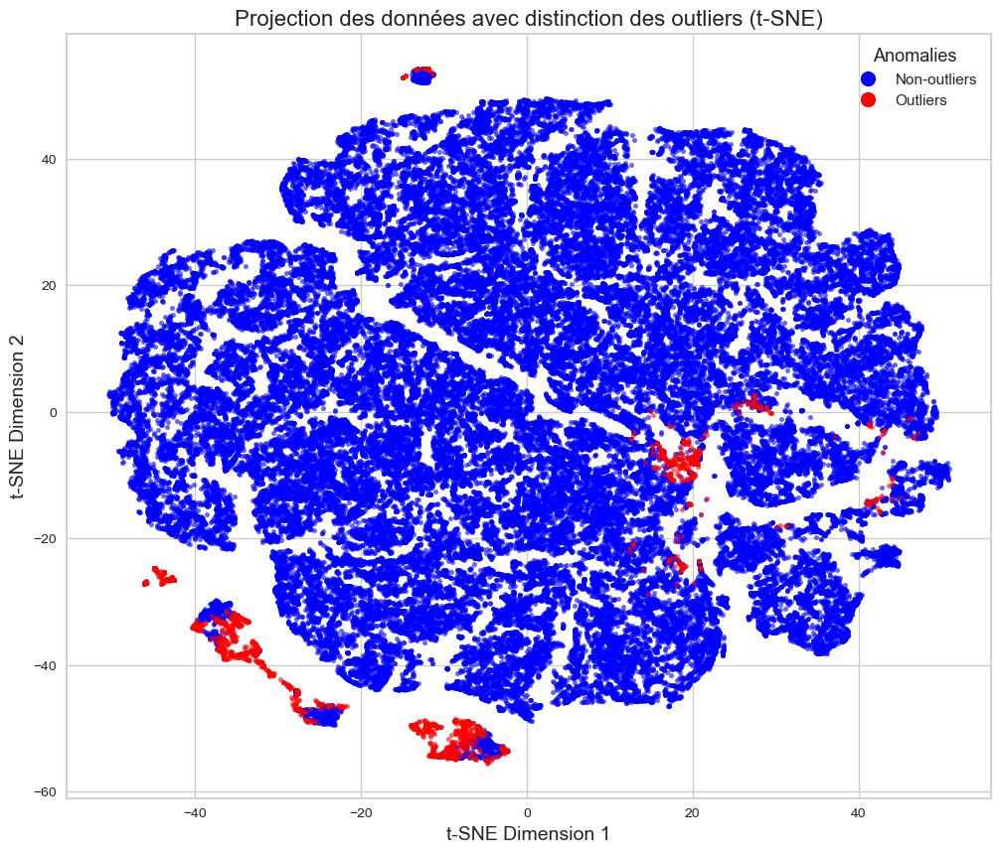

In [10]:
from matplotlib.lines import Line2D
# Initialiser le modèle Isolation Forest
iso_forest = IsolationForest(contamination=0.02, random_state=42)

# Ajuster le modèle aux données brutes
iso_forest.fit(df_km2)

# Prédire les outliers et ajouter la colonne 'anomaly'
df_km2.loc[:, 'anomaly'] = iso_forest.predict(df_km2)

# Séparer les données en non-outliers et outliers
df_non_outliers = df_km2[df_km2['anomaly'] == 1].drop('anomaly', axis=1)
df_outliers = df_km2[df_km2['anomaly'] == -1].drop('anomaly', axis=1)

# Normaliser les données
scaler = StandardScaler()
df_non_outliers_normalized = pd.DataFrame(scaler.fit_transform(df_non_outliers), columns=df_non_outliers.columns)
df_outliers_normalized = pd.DataFrame(scaler.transform(df_outliers), columns=df_outliers.columns)

# Ajouter la colonne 'anomaly' après normalisation
df_non_outliers_normalized['anomaly'] = 1
df_outliers_normalized['anomaly'] = -1

# Combiner les non-outliers et outliers normalisés
df_km2_normalized = pd.concat([df_non_outliers_normalized, df_outliers_normalized])

# Réduire les dimensions à 2D avec t-SNE en spécifiant les paramètres init et learning_rate
tsne = TSNE(n_components=2, random_state=42, init='random', learning_rate=200.0)
components = tsne.fit_transform(df_km2_normalized.drop('anomaly', axis=1))

# Créer un DataFrame avec les composantes t-SNE
df_tsne = pd.DataFrame(data=components, columns=['TSNE1', 'TSNE2'])
df_tsne['anomaly'] = df_km2_normalized['anomaly'].values

# Séparer les données t-SNE en non-outliers et outliers
df_tsne_non_outliers = df_tsne[df_tsne['anomaly'] == 1]
df_tsne_outliers = df_tsne[df_tsne['anomaly'] == -1]

# Créer le scatterplot avec le style spécifié
plt.figure(figsize=(12, 10))
plt.scatter(df_tsne_non_outliers['TSNE1'], df_tsne_non_outliers['TSNE2'], 
            s=10, alpha=0.6, label='Non-outliers', color='blue')
plt.scatter(df_tsne_outliers['TSNE1'], df_tsne_outliers['TSNE2'], 
            s=10, alpha=0.6, label='Outliers', color='red')

# Créer des handles personnalisés pour la légende avec une taille de point plus grande
handles = [Line2D([0], [0], marker='o', color='w', label='Non-outliers',
                  markerfacecolor='blue', markersize=11),
           Line2D([0], [0], marker='o', color='w', label='Outliers',
                  markerfacecolor='red', markersize=11)]

# Ajouter des éléments de style pour améliorer la lisibilité
plt.title('Projection des données avec distinction des outliers (t-SNE)', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)
plt.legend(title='Anomalies', title_fontsize='13', fontsize='11', handles=handles)
plt.grid(True)
plt.show()

In [12]:
# Extraction des valeurs à partir du dataframe
X = df_non_outliers.values

# Création du scaler de sklearn
scaler = StandardScaler()

# Application du StandardScaler aux colonnes numériques
X_scaled = scaler.fit_transform(X)

# Création d'un nouveau dataframe pour stocker les données mises à l'échelle
df_km2 = pd.DataFrame(X_scaled, columns=km2_col)

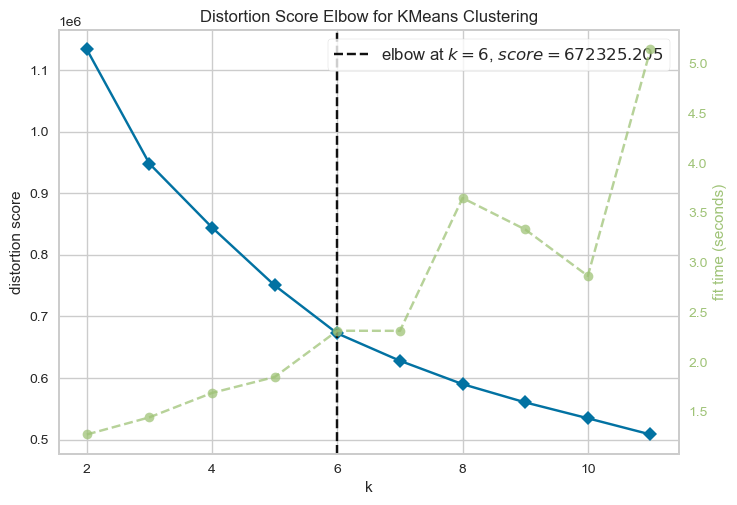

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [13]:
# Initialisation de KMeans
model = KMeans()

# Utilisation de la visualisation Elbow
visualizer = KElbowVisualizer(model, k=(2, 12))

visualizer.fit(X_scaled)
visualizer.show()

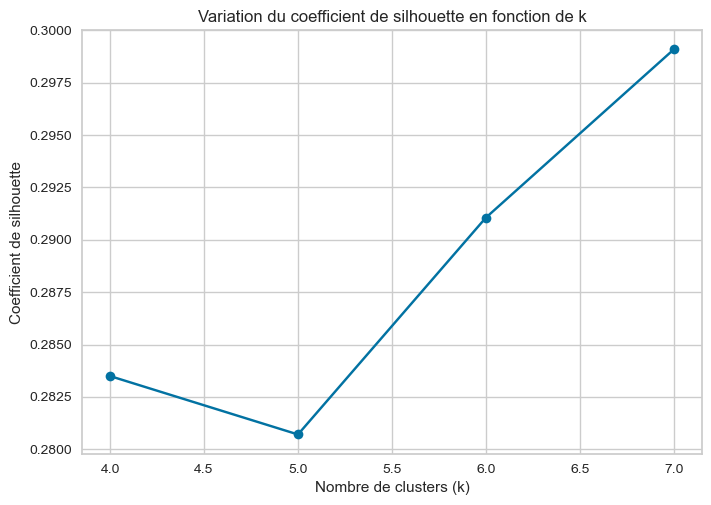

In [47]:
# Liste des valeurs de k à tester
k_values = range(4, 8) 

# Initialiser une liste pour stocker les coefficients de silhouette pour chaque k
silhouette_scores = []

# Parcourir chaque valeur de k
for k in k_values:
    # Créer un modèle K-means avec k clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    
    # Effectuer le clustering
    cluster_labels = kmeans.fit_predict(X_scaled)
    
    # Calculer le coefficient de silhouette
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    
    # Ajouter le coefficient de silhouette à la liste
    silhouette_scores.append(silhouette_avg)

# Tracer le graphique
plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Nombre de clusters (k)')
plt.ylabel('Coefficient de silhouette')
plt.title('Variation du coefficient de silhouette en fonction de k')
plt.grid(True)
plt.show()

#### b. La distribution des features

In [6]:
df_km4 =df[km2_col]

##### i. Application du StandardScaler + Quantile Transformers

In [7]:
# Extraction des valeurs à partir du dataframe
X = df_km4.values

# Appliquer StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Appliquer QuantileTransformer
quantile_transformer = QuantileTransformer(output_distribution='normal')
X_quantiled = quantile_transformer.fit_transform(X)

##### ii. Visualisation 'Original' / 'StandardScaler' / 'Quantile Transformers'

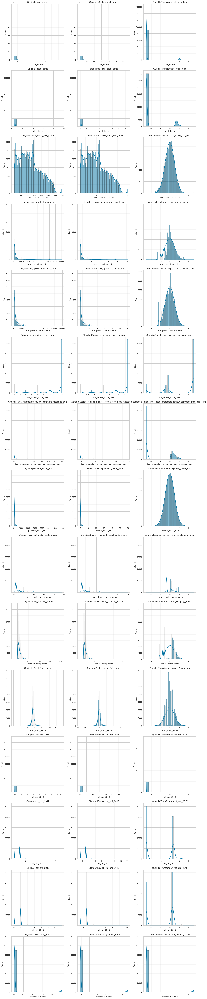

In [96]:
# Convertir en DataFrame pour faciliter la visualisation
df_scaled = pd.DataFrame(X_scaled, columns=df_km4.columns)
df_quantiled = pd.DataFrame(X_quantiled, columns=df_km4.columns)

# Filtrer les warnings
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")

# Visualiser les distributions avant et après transformations
fig, axes = plt.subplots(nrows=len(df_km4.columns), ncols=3, figsize=(15, 5 * len(df_km4.columns)))

for i, column in enumerate(df_km4.columns):
    sns.histplot(df_km4[column], kde=True, ax=axes[i, 0])
    axes[i, 0].set_title(f'Original - {column}')
    
    sns.histplot(df_scaled[column], kde=True, ax=axes[i, 1])
    axes[i, 1].set_title(f'StandardScaler - {column}')
    
    sns.histplot(df_quantiled[column], kde=True, ax=axes[i, 2])
    axes[i, 2].set_title(f'QuantileTransformer - {column}')
    
plt.tight_layout()
plt.show()

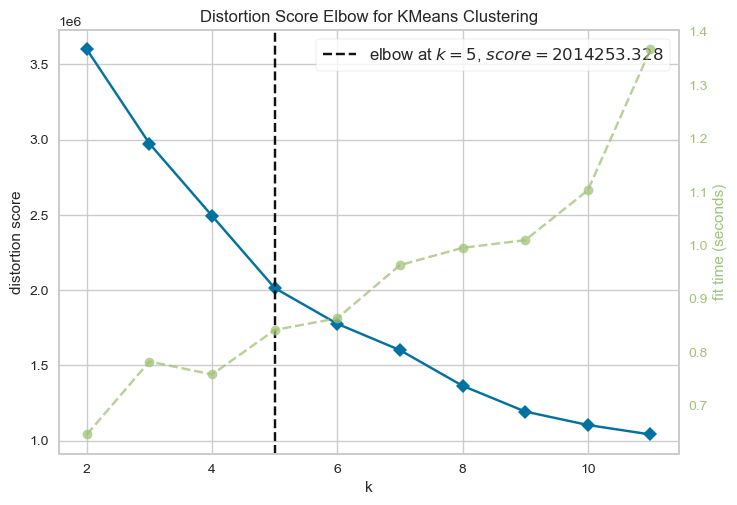

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [9]:
# Initialisation de KMeans
model = KMeans()

# Utilisation de la visualisation Elbow
visualizer = KElbowVisualizer(model, k=(2, 12))

visualizer.fit(X_quantiled)
visualizer.show()

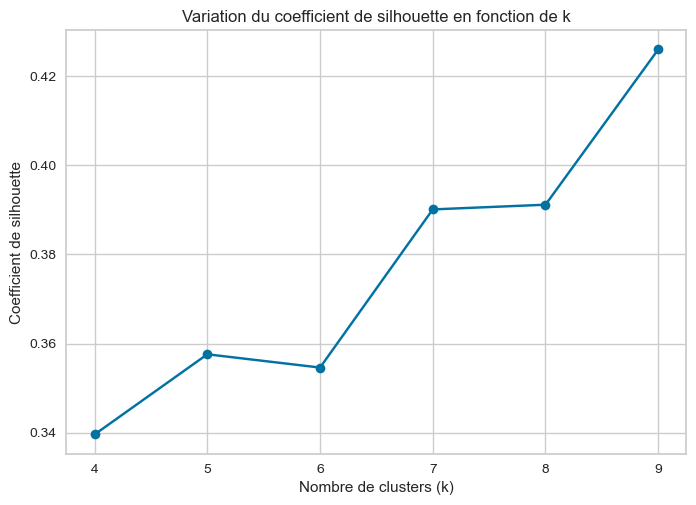

In [24]:
# Liste des valeurs de k à tester
k_values = range(4, 10) 

# Initialiser une liste pour stocker les coefficients de silhouette pour chaque k
silhouette_scores = []

# Parcourir chaque valeur de k
for k in k_values:
    # Créer un modèle K-means avec k clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    
    # Effectuer le clustering
    cluster_labels = kmeans.fit_predict(X_quantiled)
    
    # Calculer le coefficient de silhouette
    silhouette_avg = silhouette_score(X_quantiled, cluster_labels)
    
    # Ajouter le coefficient de silhouette à la liste
    silhouette_scores.append(silhouette_avg)

# Tracer le graphique
plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Nombre de clusters (k)')
plt.ylabel('Coefficient de silhouette')
plt.title('Variation du coefficient de silhouette en fonction de k')
plt.grid(True)
plt.show()

Nous allons faire faire une modélisation dans une partie dédiée pour aller plus loin dans la démarche.

#### c. UMAP

In [8]:
# Normalisation des données
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_km2)

# Application de UMAP pour réduire les données à 6 composantes
umap_model = umap.UMAP(n_components=6, random_state=42)
df_umap = umap_model.fit_transform(df_scaled)

C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [9]:
# Application de KMeans pour le clustering
kmeans = KMeans(n_clusters=6, random_state=42)
kmeans.fit(df_umap)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

In [12]:
# Calcul des métriques
silhouette = silhouette_score(df_umap, labels)
davies_bouldin = davies_bouldin_score(df_umap, labels)
calinski_harabasz = calinski_harabasz_score(df_umap, labels)

# Affichage des métriques
print("Silhouette Score:", silhouette)
print("Davies-Bouldin Index:", davies_bouldin)
print("Calinski-Harabasz Index:", calinski_harabasz)

Silhouette Score: 0.47720385
Davies-Bouldin Index: 0.9254984616578845
Calinski-Harabasz Index: 82828.54084731996


In [15]:
# Ajouter les étiquettes de clusters aux données originales pour l'interprétation
df_km2_clusters = df_km2.copy()
df_km2['cluster'] = labels

# Calcul des moyennes des variables originales pour chaque cluster
cluster_means = df_km2.groupby('cluster').mean()

# Affichage des résultats
cluster_means

C:\Users\justi\AppData\Local\Temp\ipykernel_21244\3274141709.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_km2['cluster'] = labels


,total_orders,total_items,time_since_last_purch,avg_product_weight_g,avg_product_volume_cm3,avg_review_score_mean,total_characters_review_comment_message_sum,payment_value_sum,payment_installments_mean,time_shipping_mean,écart_Prév_mean,tot_ord_2016,tot_ord_2017,tot_ord_2018,single/mult_orders
cluster,,,,,,,,,,,,,,,
0,1.000000,1.000086,116.360331,1111.379696,9181.726213,4.997418,16.958514,107.089728,2.134699,6.779748,-12.943495,0.000000,0.000000,1.000000,0.000000
1,1.284877,2.370011,319.685463,1780.160556,13759.557563,3.874313,44.351703,238.062263,3.433358,7.806435,-14.190773,0.048151,0.775723,0.461003,0.283413
2,1.000000,2.440113,123.506823,1609.208373,12597.326641,3.567468,42.943903,226.984239,3.248213,7.258609,-12.984189,0.000000,0.002382,0.997618,0.000000
3,1.000000,1.011931,376.689061,3429.692499,22878.856921,3.499549,35.667321,188.329921,3.707885,10.461795,-10.946975,0.000000,0.999841,0.000159,0.000000
4,1.044602,1.068506,139.639276,3044.408654,19662.675105,3.376203,36.325394,214.636665,3.361010,11.158545,-9.268621,0.000000,0.093598,0.951004,0.044602
5,1.030296,1.040433,375.957346,985.386393,10067.557252,4.986951,16.742711,113.000804,2.261017,7.605434,-13.901979,0.000000,1.011560,0.018736,0.012585


### Conclusion

Chacune des transformations semblent apporter un effet positif sur la métrique du coefficient de silhouette de manière plus ou moins significative selon la transformation. 
Les plus significatives sont UMAP & la transformation avec le quantiletransforms.

## 3. Seconde modélisation

### a. La selection des variables + application du quantile transfomers

In [21]:
# Sélection des variables
km5_col = [
    
    # Démographiques et Géographiques
    #'customer_unique_id', 
    #'customer_zip_code_prefix_most_frequent',
    #'customer_city_most_frequent', 
    #'customer_state_most_frequent',
    #'geolocation_lat_most_frequent', 
    #'geolocation_lng_most_frequent',
    
    # Comportement d'Achat
    'total_orders', 
    'total_items', 
    #'total_price', 
    #'total_freight_value',
    'time_since_last_purch', 
    #'time_since_first_purch',
    
    # Préférence Produit
    'avg_product_weight_g',
    'avg_product_volume_cm3',
    #'cat_Baby_Kids', 
    #'cat_Electronics_Computers', 
    #'cat_Entertainment', 
    #'cat_Miscellaneous',
    #'cat_Health_Beauty_clothing',
    #'cat_Home_Tools',
    
    # Satisfaction client
    'avg_review_score_mean',
    #'avg_délaiSatisfaction_mean',
    'total_characters_review_comment_message_sum',
    
    # Paiement et Transport
    'payment_value_sum', 
    'payment_installments_mean', 
    #'max_payment_sequential',
    #'payment_is_credit_card',
    'time_shipping_mean',
    #'time_order_mean', 
    'écart_Prév_mean', 
    #'ratio_freight',
    
    # Fréquence d'Achat
    'tot_ord_2016', 
    'tot_ord_2017', 
    'tot_ord_2018',
    #'mean_items_per_order', 
    #'mean_price_per_order',
    'single/mult_orders'
]

df_km5 = df[km5_col]

In [22]:
# Extraction des valeurs à partir du dataframe
X = df_km5.values

# Appliquer QuantileTransformer
quantile_transformer = QuantileTransformer(output_distribution='normal')
X_quantiled = quantile_transformer.fit_transform(X)

# Création d'un nouveau dataframe pour stocker les données mises à l'échelle
df_km5_quantiled = pd.DataFrame(X_quantiled, columns=km5_col)

df_km5_quantiled.head(3)

,total_orders,total_items,time_since_last_purch,avg_product_weight_g,avg_product_volume_cm3,avg_review_score_mean,total_characters_review_comment_message_sum,payment_value_sum,payment_installments_mean,time_shipping_mean,écart_Prév_mean,tot_ord_2016,tot_ord_2017,tot_ord_2018,single/mult_orders
0,-5.199338,-5.199338,-0.699108,0.507774,0.076604,5.199338,1.397837,0.345295,1.391202,-0.608973,0.99380,-5.199338,-5.199338,0.576075,-5.199338
1,-5.199338,-5.199338,-0.667419,-0.452858,-0.147316,-0.493553,-5.199338,-2.017357,-0.699108,-1.494155,0.99380,-5.199338,-5.199338,0.576075,-5.199338
2,-5.199338,-5.199338,1.811457,0.507774,1.391202,-0.957454,-5.199338,-0.267017,1.391202,1.611333,1.26686,-5.199338,0.733156,-5.199338,-5.199338


### b. Recherche du K optimal

#### i. Méthode du coude

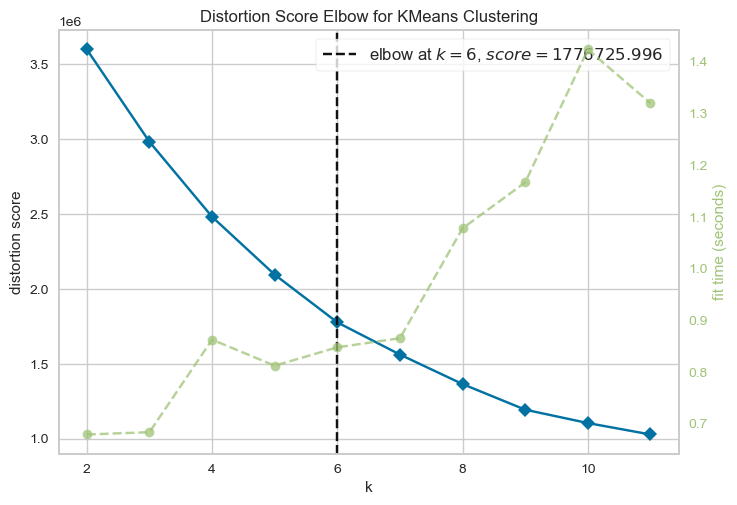

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [23]:
# Initialisation de KMeans
model = KMeans()

# Utilisation de la visualisation Elbow
visualizer = KElbowVisualizer(model, k=(2, 12))

visualizer.fit(X_quantiled)
visualizer.show()

#### ii. Variations du coefficient de silhouette selon les valeurs de k

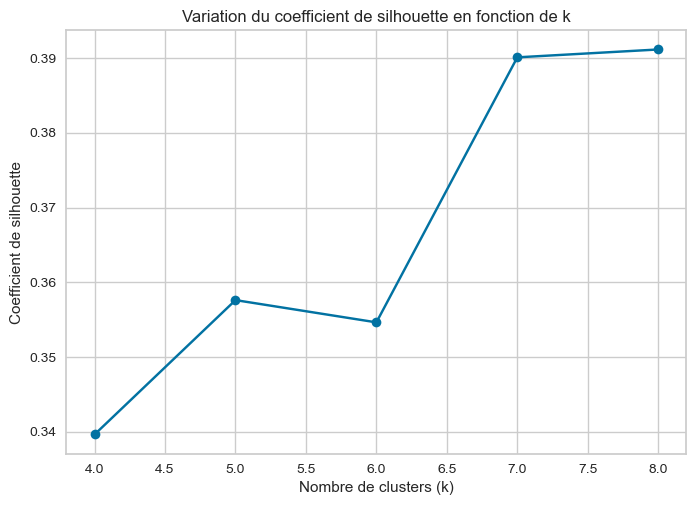

In [24]:
# Liste des valeurs de k à tester
k_values = range(4, 9) 

# Initialiser une liste pour stocker les coefficients de silhouette pour chaque k
silhouette_scores = []

# Parcourir chaque valeur de k
for k in k_values:
    # Créer un modèle K-means avec k clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    
    # Effectuer le clustering
    cluster_labels = kmeans.fit_predict(X_quantiled)
    
    # Calculer le coefficient de silhouette
    silhouette_avg = silhouette_score(X_quantiled, cluster_labels)
    
    # Ajouter le coefficient de silhouette à la liste
    silhouette_scores.append(silhouette_avg)

# Tracer le graphique
plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Nombre de clusters (k)')
plt.ylabel('Coefficient de silhouette')
plt.title('Variation du coefficient de silhouette en fonction de k')
plt.grid(True)
plt.show()

In [25]:
k = 8

### c. Lancement du k-means sur les données

In [26]:
# Initialisation du modèle K-means
kmeans = KMeans(n_clusters=k, random_state=42)

# Apprentissage du modèle
kmeans.fit(df_km5_quantiled)

# Ajout des labels de clusters au DataFrame en utilisant .loc
df_km5.loc[:, 'cluster'] = kmeans.labels_

C:\Users\justi\AppData\Local\Temp\ipykernel_6856\2288149796.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_km5.loc[:, 'cluster'] = kmeans.labels_


In [27]:
# Inverse transformation des centres de clusters
cluster_centers = quantile_transformer.inverse_transform(kmeans.cluster_centers_)
cluster_centers_df = pd.DataFrame(cluster_centers, columns=km5_col)

# Affichage du DataFrame des centres de clusters
cluster_centers_df

,total_orders,total_items,time_since_last_purch,avg_product_weight_g,avg_product_volume_cm3,avg_review_score_mean,total_characters_review_comment_message_sum,payment_value_sum,payment_installments_mean,time_shipping_mean,écart_Prév_mean,tot_ord_2016,tot_ord_2017,tot_ord_2018,single/mult_orders
0,1.0,1.0,388.234596,700.000000,6924.664364,5.0,0.000000,101.615024,2.0,6.0,-14.0,0.0,1.0,0.0,0.0
1,1.0,1.0,114.000000,600.000000,5990.087421,3.0,0.000000,102.429614,2.0,7.0,-11.0,0.0,0.0,1.0,0.0
2,1.0,1.0,399.000000,800.000000,7500.000000,5.0,49.000000,107.799327,2.0,6.0,-14.0,0.0,1.0,0.0,0.0
3,1.0,1.0,106.000000,661.952381,6048.000000,5.0,49.444916,106.423853,2.0,6.0,-13.0,0.0,0.0,1.0,0.0
4,2.0,2.0,198.000000,850.000000,8000.000000,5.0,0.000000,217.957138,2.0,7.0,-13.0,0.0,0.0,0.0,1.0
5,1.0,1.0,104.000000,600.000000,5785.204154,5.0,0.000000,101.965712,2.0,6.0,-13.0,0.0,0.0,1.0,0.0
6,1.0,1.0,121.585455,700.000000,6512.598713,1.0,78.628092,117.064822,2.0,8.0,-10.0,0.0,0.0,1.0,0.0
7,1.0,1.0,385.000000,782.247780,7450.316398,1.0,0.000000,106.865739,2.0,8.0,-11.0,0.0,1.0,0.0,0.0


In [30]:
# Assuming cluster_centers_df is already defined
cluster_centers_df_transposed = cluster_centers_df.T

# Function to colorize by row
def colorize_by_row(series):
    normalized_values = (series - series.min()) / (series.max() - series.min())
    colors = plt.cm.RdYlBu(normalized_values)
    hex_colors = ['#%02x%02x%02x' % (int(rgb[0]*255), int(rgb[1]*255), int(rgb[2]*255)) for rgb in colors]
    return ['background-color: %s; color: white; text-align: center; border: 1px solid black;' % color for color in hex_colors]

# Apply the color function row-wise
styled_df = cluster_centers_df_transposed.style.apply(colorize_by_row, axis=1)

# Display the styled DataFrame
styled_df.set_table_styles([{
    'selector': 'thead th',
    'props': [('font-size', '14px'), ('text-align', 'center')]
}, {
    'selector': 'tbody td',
    'props': [('font-size', '12px'), ('text-align', 'center')]
}])

,0,1,2,3,4,5,6,7
total_orders,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000
total_items,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000
time_since_last_purch,388.234596,114.000000,399.000000,106.000000,198.000000,104.000000,121.585455,385.000000
avg_product_weight_g,700.000000,600.000000,800.000000,661.952381,850.000000,600.000000,700.000000,782.247780
avg_product_volume_cm3,6924.664364,5990.087421,7500.000000,6048.000000,8000.000000,5785.204154,6512.598713,7450.316398
avg_review_score_mean,5.000000,3.000000,5.000000,5.000000,5.000000,5.000000,1.000000,1.000000
total_characters_review_comment_message_sum,0.000000,0.000000,49.000000,49.444916,0.000000,0.000000,78.628092,0.000000
payment_value_sum,101.615024,102.429614,107.799327,106.423853,217.957138,101.965712,117.064822,106.865739
payment_installments_mean,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
time_shipping_mean,6.000000,7.000000,6.000000,6.000000,7.000000,6.000000,8.000000,8.000000


Résultat non probants, il semble y avoir une perte d'information lors de l'inversion du quantile transfomers.
Essayons de faire un grouby avec les labels intégrées dans le df_km5 d'origine.

In [153]:
# Group by la colonne 'cluster' et applique la fonction mean
df_grouped = df_km5.groupby('cluster').mean()
df_grouped

,total_orders,total_items,time_since_last_purch,avg_product_weight_g,avg_product_volume_cm3,avg_review_score_mean,total_characters_review_comment_message_sum,payment_value_sum,payment_installments_mean,time_shipping_mean,écart_Prév_mean,tot_ord_2016,tot_ord_2017,tot_ord_2018,single/mult_orders
cluster,,,,,,,,,,,,,,,
0,1.000000,1.099796,116.309473,1883.805210,13487.512064,5.000000,0.000000,153.509813,2.640316,6.955536,-12.808088,0.000000,0.000000,1.000000,0.0
1,1.000000,1.107613,380.321056,2143.218362,16152.210706,5.000000,19.180005,157.767926,3.041458,7.786472,-13.778325,0.002419,0.997581,0.000000,0.0
2,1.000000,1.176724,374.995391,2314.176864,16962.556875,2.982594,38.990721,163.894703,3.096246,10.991934,-10.349202,0.001698,0.998302,0.000000,0.0
3,1.000000,1.118695,128.030338,2025.319523,14130.926161,3.378650,0.000000,152.654138,2.678517,10.110163,-9.976678,0.001517,0.000000,0.998483,0.0
4,1.000000,1.103769,122.961429,2023.432451,14107.668862,5.000000,52.379442,162.852374,2.920705,7.078023,-13.416446,0.007832,0.000000,0.992168,0.0
5,2.114583,2.572917,219.133261,1984.770693,14449.726721,4.206040,57.642241,308.369066,3.298115,8.506167,-12.623115,0.005747,1.087284,1.021552,1.0
6,1.000000,1.264281,134.878987,2252.683531,15437.136797,2.361912,85.883397,181.165587,2.967798,12.100195,-8.390114,0.006769,0.000000,0.993231,0.0


In [150]:
# Calcul des métriques
silhouette = silhouette_score(df_km5_quantiled, kmeans.labels_)
davies_bouldin = davies_bouldin_score(df_km5_quantiled, kmeans.labels_)
calinski_harabasz = calinski_harabasz_score(df_km5_quantiled, kmeans.labels_)

# Affichage des métriques
print("Silhouette Score:", silhouette)
print("Davies-Bouldin Index:", davies_bouldin)
print("Calinski-Harabasz Index:", calinski_harabasz)

Silhouette Score: 0.3901037306588646
Davies-Bouldin Index: 1.0527004303184335
Calinski-Harabasz Index: 36129.96699105247


C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


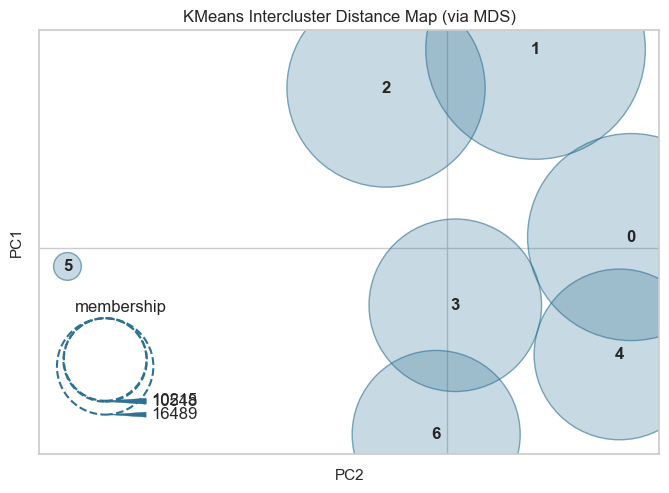

C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


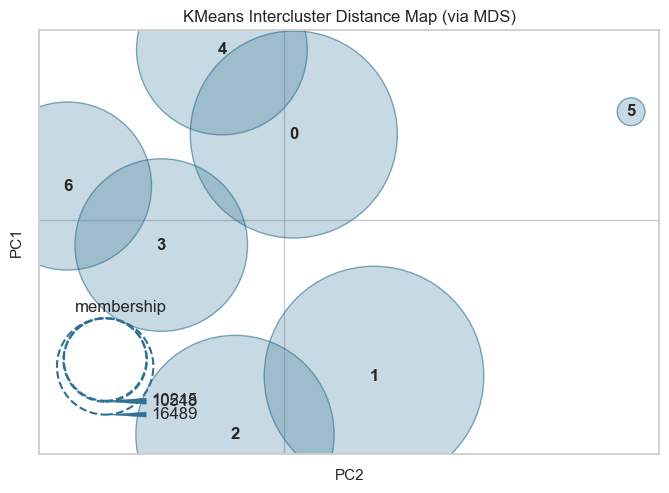

<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [57]:
# Visualisation des clusters dans l'espace PCA

# Instancier l'outil de visualisation de la distance entre clusters
visualizer = InterclusterDistance(kmeans)
visualizer.fit(X)
visualizer.show()

# Visualisation des clusters dans l'espace UMAP

# Instancier l'outil de visualisation de la distance entre clusters
visualizer = InterclusterDistance(kmeans, projection='umap')
visualizer.fit(X)
visualizer.show()


### d. Métriques de performance de la modélisation

## 4. Troisième modélisation

### 1. La sélection des variables + isolation forest (0.02) + application du standard scaler

In [3]:
km3_cols = [
    
    # Démographiques et Géographiques
    #'customer_unique_id', 
    #'customer_zip_code_prefix_most_frequent',
    #'customer_city_most_frequent', 
    #'customer_state_most_frequent',
    #'geolocation_lat_most_frequent', 
    #'geolocation_lng_most_frequent',
    
    # Comportement d'Achat
    'total_orders', 
    'total_items', 
    #'total_price', 
    #'total_freight_value',
    'time_since_last_purch', 
    #'time_since_first_purch',
    
    # Préférence Produit
    'avg_product_weight_g',
    'avg_product_volume_cm3',
    #'cat_Baby_Kids', 
    #'cat_Electronics_Computers', 
    #'cat_Entertainment', 
    #'cat_Miscellaneous',
    #'cat_Health_Beauty_clothing',
    #'cat_Home_Tools',
    
    # Satisfaction client
    'avg_review_score_mean',
    #'avg_délaiSatisfaction_mean',
    'total_characters_review_comment_message_sum',
    
    # Paiement et Transport
    'payment_value_sum', 
    #'payment_installments_mean', 
    #'max_payment_sequential',
    #'payment_is_credit_card',
    'time_shipping_mean',
    #'time_order_mean', 
    'écart_Prév_mean', 
    'ratio_freight',
    
    # Fréquence d'Achat
    'tot_ord_2016', 
    'tot_ord_2017', 
    'tot_ord_2018',
    #'mean_items_per_order', 
    #'mean_price_per_order',
    'single/mult_orders'
]

df_km3 = df[km3_cols]

**Isolation Forest**

In [4]:
# Extraction des valeurs à partir du dataframe
X = df_km3.values

# Détection des outliers avec Isolation Forest
isolation_forest = IsolationForest(n_estimators=150, contamination=0.02, random_state=42)
outliers = isolation_forest.fit_predict(X)

# Créer une copie
df_km3_copy = df_km3.copy()

# Marquer les outliers dans le DataFrame
df_km3_copy.loc[:, 'outlier'] = outliers

# Conserver uniquement les points non-outliers
df_km3_clean = df_km3_copy[df_km3_copy['outlier'] == 1].drop(columns=['outlier'])

In [5]:
# Afficher le nombre d'outliers extraits 
df_km3_outlier = df_km3_copy[df_km3_copy['outlier'] == -1]
print('Nombre de ligne:', df_km3_outlier.shape)

Nombre de ligne: (1850, 16)


**StandardScaler**

In [6]:
# Création du scaler de sklearn
scaler = StandardScaler()

# Application du StandardScaler aux colonnes numériques
X_scaled = scaler.fit_transform(df_km3_clean)

# Création d'un nouveau dataframe pour stocker les données mises à l'échelle
df_km3_scaled = pd.DataFrame(X_scaled, columns=km3_cols)

### b. Recherche du k optimal & stabilisation des clusters à l'initialisation

#### i. Méthode du coude

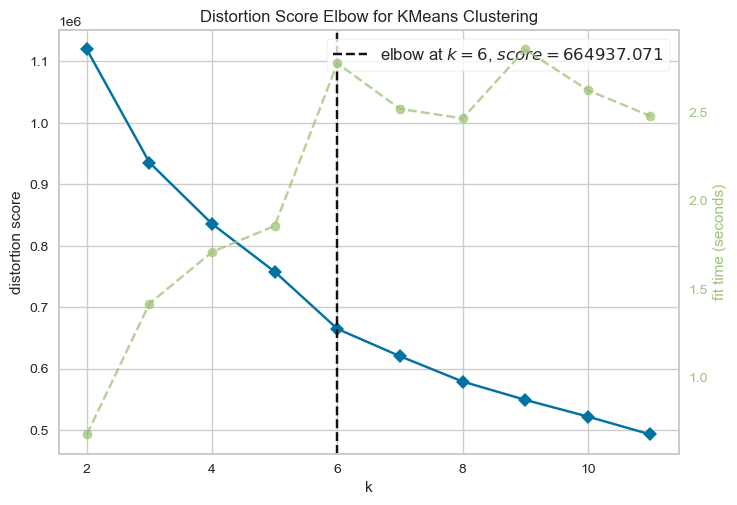

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [17]:
# Initialisation de KMeans
model = KMeans()

# Utilisation de la visualisation Elbow
visualizer = KElbowVisualizer(model, k=(2, 12))

visualizer.fit(X_scaled)
visualizer.show()

#### ii. Variations du coefficient de silhouette selon les valeurs de k

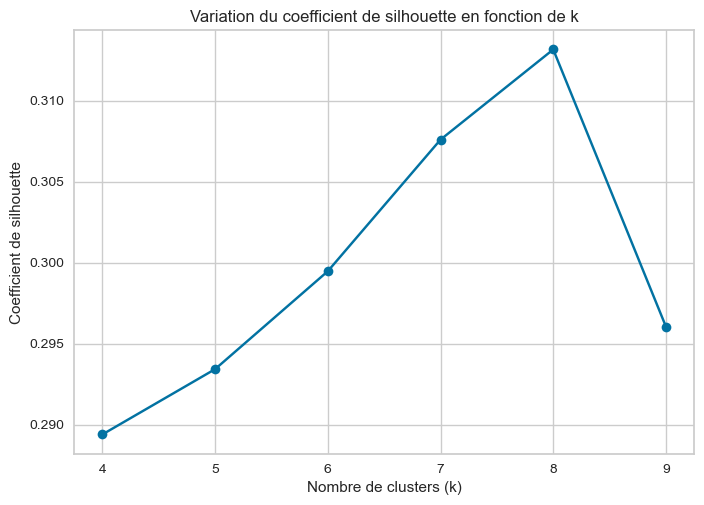

In [252]:
# Liste des valeurs de k à tester
k_values = range(4, 10) 

# Initialiser une liste pour stocker les coefficients de silhouette pour chaque k
silhouette_scores = []

# Parcourir chaque valeur de k
for k in k_values:
    # Créer un modèle K-means avec k clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    
    # Effectuer le clustering
    cluster_labels = kmeans.fit_predict(X_scaled)
    
    # Calculer le coefficient de silhouette
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    
    # Ajouter le coefficient de silhouette à la liste
    silhouette_scores.append(silhouette_avg)

# Tracer le graphique
plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Nombre de clusters (k)')
plt.ylabel('Coefficient de silhouette')
plt.title('Variation du coefficient de silhouette en fonction de k')
plt.grid(True)
plt.show()

#### iii. Stabilité des clusters à l'initialisation

k = 4: ARI moyen = 0.86
k = 5: ARI moyen = 0.91
k = 6: ARI moyen = 0.80
k = 7: ARI moyen = 0.76
k = 8: ARI moyen = 0.76
k = 9: ARI moyen = 0.79
k = 10: ARI moyen = 0.79


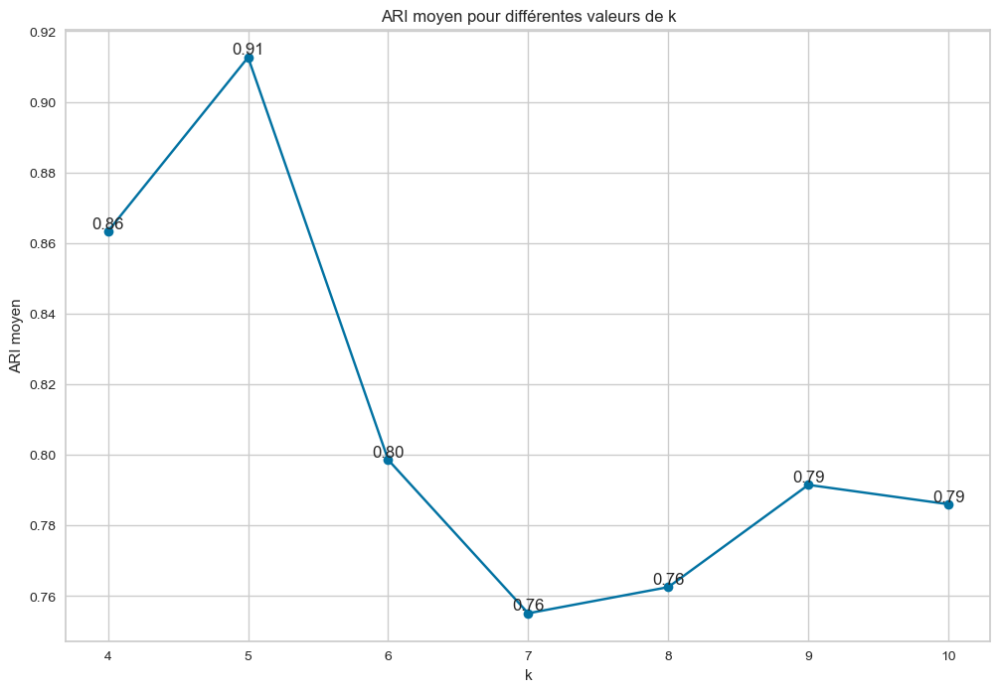

In [31]:
# Paramètres
k_values = range(4, 11)  
n_init = 100 

# Stockage des scores moyens
mean_ari_scores = {}

# Calcul des scores ARI moyens pour chaque k
for k in k_values:
    ari_scores = []
    labels_list = []

    # Exécution du k-means plusieurs fois avec différentes initialisations
    for i in range(n_init):
        kmeans = KMeans(n_clusters=k, n_init=1, init='random', random_state=i)
        kmeans.fit(df_km3_scaled)
        labels_list.append(kmeans.labels_)

    # Calcul de l'ARI Score entre toutes les paires d'initialisations
    for i in range(n_init):
        for j in range(i + 1, n_init):
            ari_score = adjusted_rand_score(labels_list[i], labels_list[j])
            ari_scores.append(ari_score)

    # Calcul de la moyenne des scores ARI
    mean_ari_scores[k] = np.mean(ari_scores)

# Affichage des scores moyens
for k, mean_ari in mean_ari_scores.items():
    print(f"k = {k}: ARI moyen = {mean_ari:.2f}")

# Visualisation des scores moyens
plt.figure(figsize=(12, 8))
plt.plot(list(mean_ari_scores.keys()), list(mean_ari_scores.values()), marker='o')
plt.title("ARI moyen pour différentes valeurs de k")
plt.xlabel("k")
plt.ylabel("ARI moyen")
plt.grid(True)

# Ajout des étiquettes de valeurs
for k, mean_ari in mean_ari_scores.items():
    plt.text(k, mean_ari, f"{mean_ari:.2f}", ha='center', va='bottom')

plt.show()

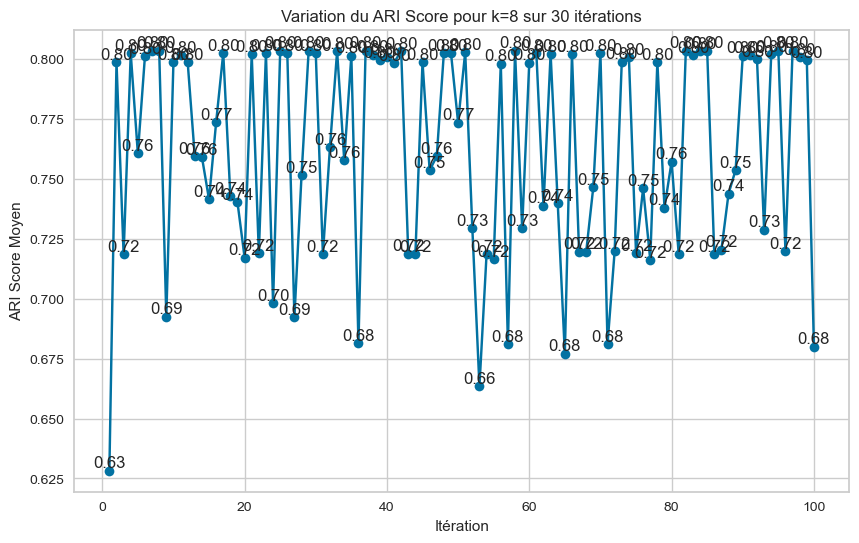

In [30]:
# Paramètres
k = 8 
n_iter = 100

# Stockage des scores ARI
ari_scores_per_iter = []

# Exécution du k-means plusieurs fois avec différentes initialisations
labels_list = []
for i in range(n_iter):
    kmeans = KMeans(n_clusters=k, n_init=1, init='random', random_state=i)
    kmeans.fit(df_km3_scaled)
    labels_list.append(kmeans.labels_)

# Calcul de l'ARI Score pour chaque itération
for i in range(n_iter):
    iter_ari_scores = []
    for j in range(n_iter):
        if i != j:
            ari_score = adjusted_rand_score(labels_list[i], labels_list[j])
            iter_ari_scores.append(ari_score)
    ari_scores_per_iter.append(np.mean(iter_ari_scores))

# Création d'un dataframe pour les scores ARI
ari_scores_df = pd.DataFrame({'Itération': range(1, n_iter + 1), 'ARI Score Moyen': ari_scores_per_iter})

# Visualisation de la courbe de variation du score ARI
plt.figure(figsize=(10, 6))
plt.plot(ari_scores_df['Itération'], ari_scores_df['ARI Score Moyen'], marker='o')
plt.title("Variation du ARI Score pour k=8 sur 30 itérations")
plt.xlabel("Itération")
plt.ylabel("ARI Score Moyen")
plt.grid(True)

# Ajout des étiquettes de valeurs
for i, score in enumerate(ari_scores_df['ARI Score Moyen']):
    plt.text(i + 1, score, f"{score:.2f}", ha='center', va='bottom')

plt.show()

### c. Lancement du k-means

In [7]:
k = 8

In [9]:

# Initialisation du modèle K-means
kmeans = KMeans(n_clusters=k, random_state=42)

# Apprentissage du modèle
kmeans.fit(df_km3_scaled)

# Sauvegarde du modèle avec joblib
joblib.dump(kmeans, 'kmeans_model_k=8.pkl')

# Ajout des labels de clusters au DataFrame
df_km3_scaled = df_km3_scaled.copy()
df_km3_scaled.loc[:, 'cluster'] = kmeans.labels_

# Affichage des centres de clusters
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
cluster_centers_df = pd.DataFrame(cluster_centers, columns=km3_cols)

cluster_centers_df.round(5)


,total_orders,total_items,time_since_last_purch,avg_product_weight_g,avg_product_volume_cm3,avg_review_score_mean,total_characters_review_comment_message_sum,payment_value_sum,time_shipping_mean,écart_Prév_mean,ratio_freight,tot_ord_2016,tot_ord_2017,tot_ord_2018,single/mult_orders
0,1.00000,1.06349,117.85018,1258.69551,9830.02131,4.54500,13.52620,129.12805,7.12471,-12.78601,0.21120,-0.0,0.00000,1.00000,0.00000
1,1.00000,3.81342,233.85738,1507.82398,12560.83413,3.55637,39.05073,334.42793,7.01071,-13.63529,0.25528,-0.0,0.45547,0.54453,-0.00000
2,2.00000,2.06191,232.58229,1288.81100,10737.83451,4.51430,23.82210,219.36366,7.71356,-12.76763,0.18670,-0.0,1.25784,0.74216,1.00000
3,1.00000,1.06662,224.94813,1663.91439,12745.55056,1.75839,48.48917,148.45718,33.03450,11.64359,0.23027,-0.0,0.35498,0.64502,0.00000
4,1.00000,1.21921,213.74276,1562.31888,11678.63532,2.20215,138.16578,160.97798,8.19991,-12.08368,0.19836,0.0,0.36857,0.63143,0.00000
5,1.01266,1.10127,683.80169,1939.53376,16085.51477,4.06751,51.87342,162.30338,5.55907,-36.60549,0.20071,1.0,-0.00000,0.01266,0.01266
6,1.00000,1.06799,380.58218,1423.20485,11839.03343,4.45850,16.18048,129.70519,7.96190,-13.56906,0.20887,-0.0,1.00000,0.00000,0.00000
7,1.00000,1.09192,238.80231,12796.37984,75858.38074,4.19404,26.66885,474.55613,8.23308,-12.45673,0.16625,-0.0,0.44212,0.55788,0.00000


In [17]:
# Transposer le DataFrame
cluster_centers_df_transposed = cluster_centers_df.T

# Arrondir les valeurs à deux chiffres après la virgule et convertir en chaînes de caractères formatées
cluster_centers_df_transposed = cluster_centers_df_transposed.applymap(lambda x: f"{x:.3f}")

# Fonction pour appliquer la couleur en fonction de l'échelle de chaque ligne
def colorize_by_row(series):
    # Convertir les valeurs en flottants pour la normalisation
    series_float = series.astype(float)
    # Normaliser les valeurs entre 0 et 1 pour créer une échelle de couleurs
    normalized_values = (series_float - series_float.min()) / (series_float.max() - series_float.min())
    # Utiliser une colormap
    colors = plt.cm.RdYlBu(normalized_values)
    # Convertir les valeurs RGBA en valeurs hexadécimales
    hex_colors = [rgb2hex(color) for color in colors]
    return ['background-color: %s; color: black; font-weight: bold; font-size: 14px' % color for color in hex_colors]

# Convertir les valeurs RGBA en hexadécimal
def rgb2hex(rgb):
    return '#{:02x}{:02x}{:02x}'.format(int(rgb[0] * 255), int(rgb[1] * 255), int(rgb[2] * 255))

# Appliquer la couleur ligne par ligne
styled_df = cluster_centers_df_transposed.style.apply(colorize_by_row, axis=1)

# Afficher le DataFrame stylisé
styled_df


C:\Users\justi\AppData\Local\Temp\ipykernel_2176\1944976683.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  cluster_centers_df_transposed = cluster_centers_df_transposed.applymap(lambda x: f"{x:.3f}")


,0,1,2,3,4,5,6,7
total_orders,1.000,1.000,2.000,1.000,1.000,1.013,1.000,1.000
total_items,1.063,3.813,2.062,1.067,1.219,1.101,1.068,1.092
time_since_last_purch,117.850,233.857,232.582,224.948,213.743,683.802,380.582,238.802
avg_product_weight_g,1258.696,1507.824,1288.811,1663.914,1562.319,1939.534,1423.205,12796.380
avg_product_volume_cm3,9830.021,12560.834,10737.835,12745.551,11678.635,16085.515,11839.033,75858.381
avg_review_score_mean,4.545,3.556,4.514,1.758,2.202,4.068,4.458,4.194
total_characters_review_comment_message_sum,13.526,39.051,23.822,48.489,138.166,51.873,16.180,26.669
payment_value_sum,129.128,334.428,219.364,148.457,160.978,162.303,129.705,474.556
time_shipping_mean,7.125,7.011,7.714,33.034,8.200,5.559,7.962,8.233
écart_Prév_mean,-12.786,-13.635,-12.768,11.644,-12.084,-36.605,-13.569,-12.457


In [18]:
# Nombre de clients par cluster
df_km3_clean.loc[:, 'cluster'] = kmeans.labels_
cluster_counts = df_km3_clean['cluster'].value_counts()

print("Nombre de clients par cluster:")
print(cluster_counts)

Nombre de clients par cluster:
cluster
0    38394
6    32618
4     6943
7     5199
3     4201
1     1774
2     1276
5      237
Name: count, dtype: int64


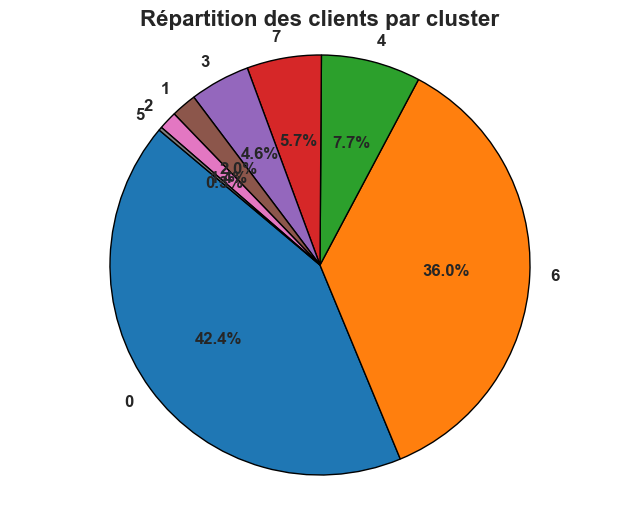

In [12]:
# Nombre de clients par cluster
cluster_counts = df_km3_clean['cluster'].value_counts()

# Couleurs pour chaque cluster
colors = plt.cm.tab10.colors[:len(cluster_counts)]

# Création du diagramme circulaire
plt.figure(figsize=(8, 6))
plt.pie(cluster_counts, 
        labels=cluster_counts.index, 
        autopct='%1.1f%%', 
        startangle=140, 
        colors=colors, 
        wedgeprops={'edgecolor': 'black', 'linewidth': 1},
        textprops={'fontsize': 12, 'fontweight': 'bold'})
plt.axis('equal')
plt.title('Répartition des clients par cluster', fontsize=16, fontweight='bold')
plt.show()


### d. Métriques de performance de la modélisation

In [13]:
# Calcul des métriques
silhouette = silhouette_score(X_scaled, kmeans.labels_)
davies_bouldin = davies_bouldin_score(X_scaled, kmeans.labels_)
calinski_harabasz = calinski_harabasz_score(X_scaled, kmeans.labels_)

# Affichage des métriques
print("Silhouette Score:", silhouette)
print("Davies-Bouldin Index:", davies_bouldin)
print("Calinski-Harabasz Index:", calinski_harabasz)

Silhouette Score: 0.3131606187675315
Davies-Bouldin Index: 1.1204408415988034
Calinski-Harabasz Index: 17445.961150933847


### e. Analyse de la segmentation obtenue

#### i. Boxplot

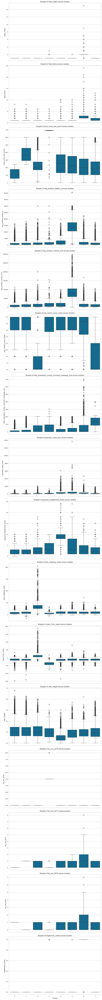

In [46]:
# création du fonction pour créer un boxplot pour chacune des variables sur les clusters créés
def boxplot_clusters(data, cluster_column, attributes):
    # Fonction pour tracer des boxplots pour chaque variable avec les clusters
    num_attributes = len(attributes)
    fig, axes = plt.subplots(num_attributes, 1, figsize=(10, 6*num_attributes), sharex=True)
    for i, attribute in enumerate(attributes):
        sns.boxplot(x=cluster_column, y=attribute, data=data, ax=axes[i])
        axes[i].set_title(f'Boxplot of {attribute} across clusters')
        axes[i].set_xlabel('Cluster')
        axes[i].set_ylabel(attribute)
    plt.tight_layout()
    plt.show()

# Utilisation de la fonction pour tracer les boxplots
boxplot_clusters(df_km3, 'cluster', km3_cols)


#### ii. Radarplot

Cluster 1


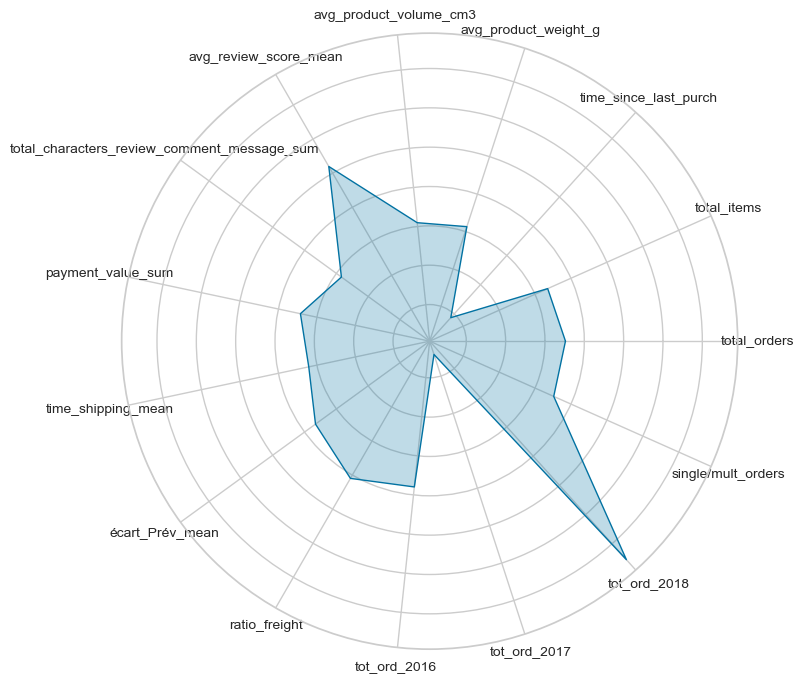

Cluster 2


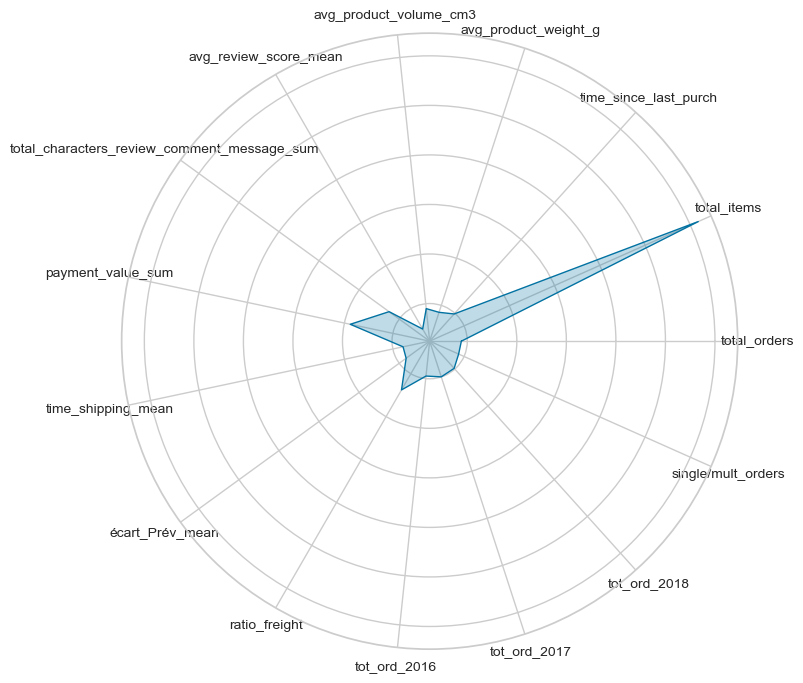

Cluster 3


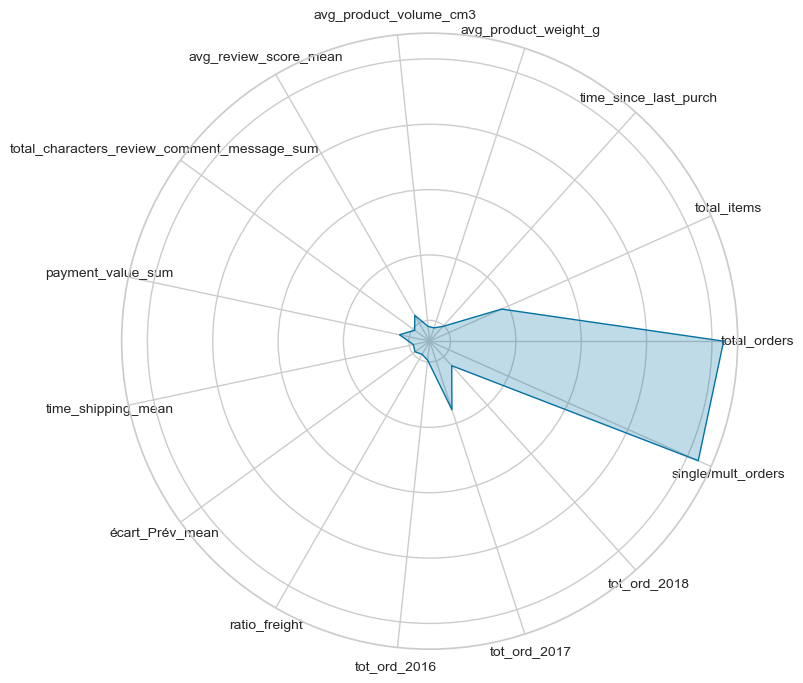

Cluster 4


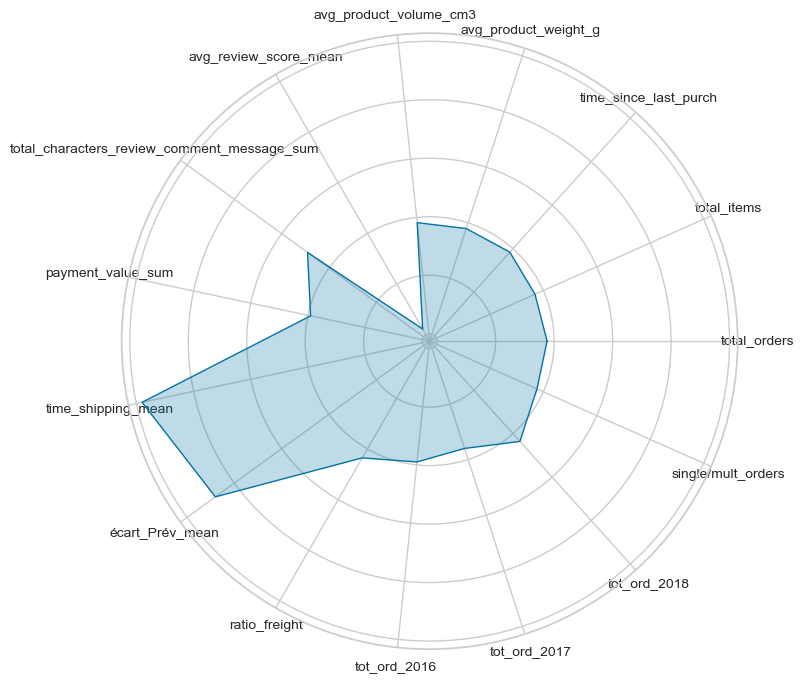

Cluster 5


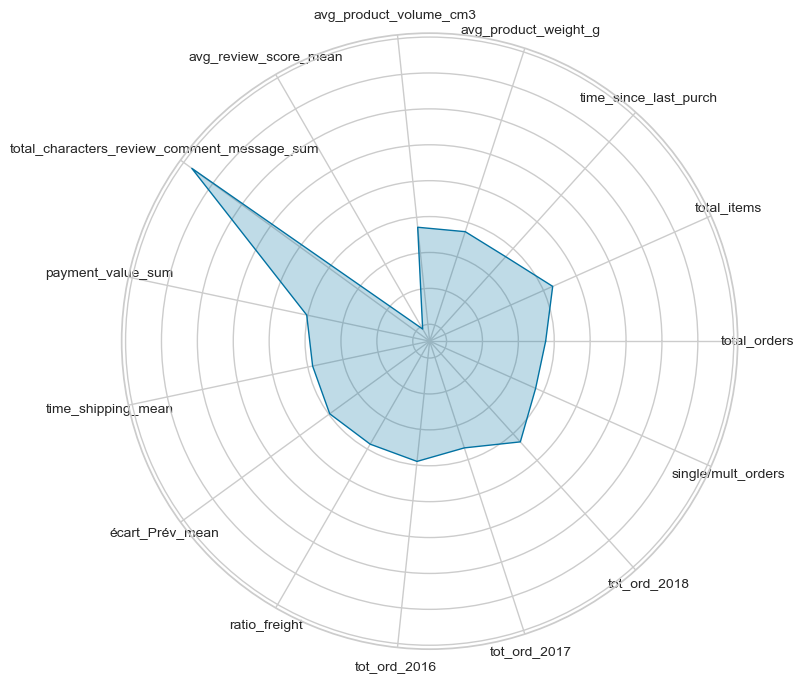

Cluster 6


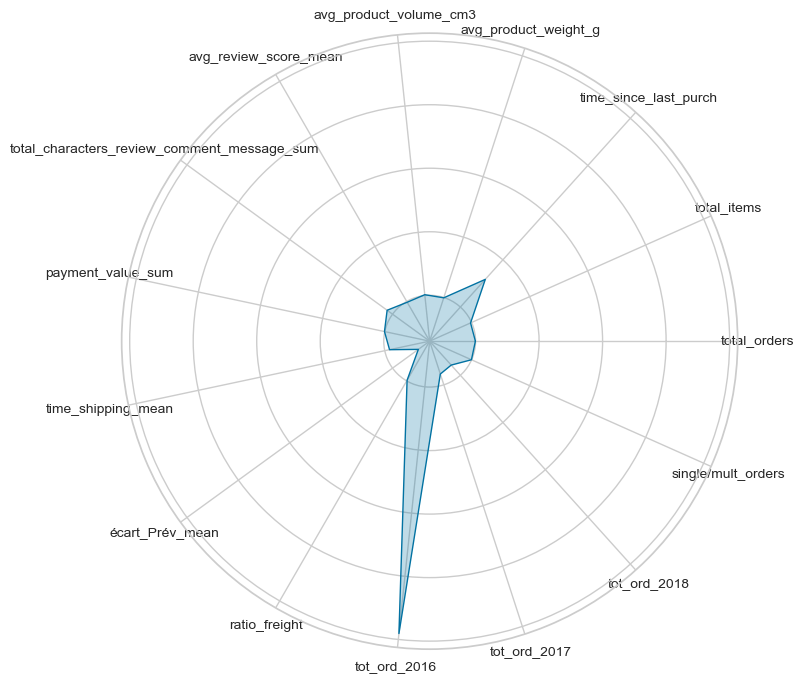

Cluster 7


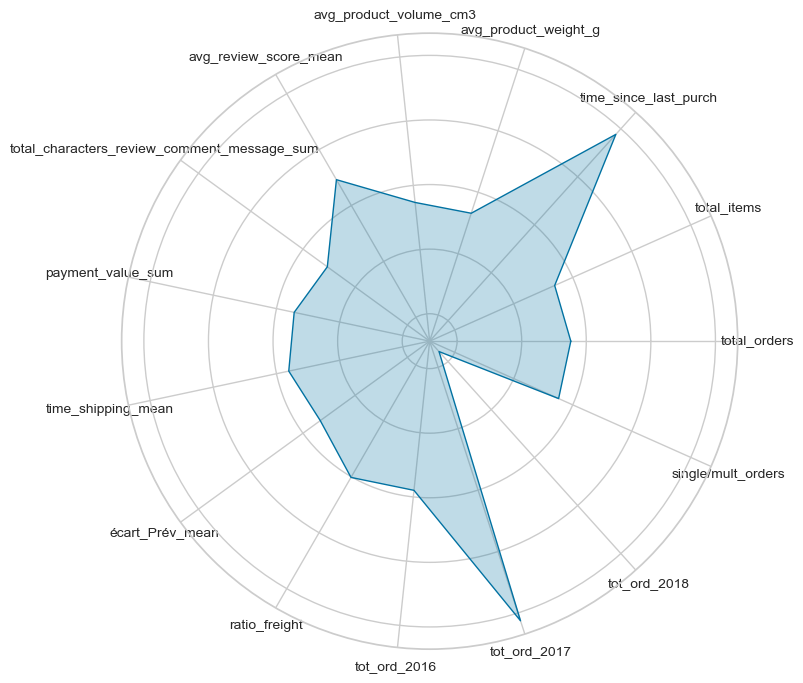

Cluster 8


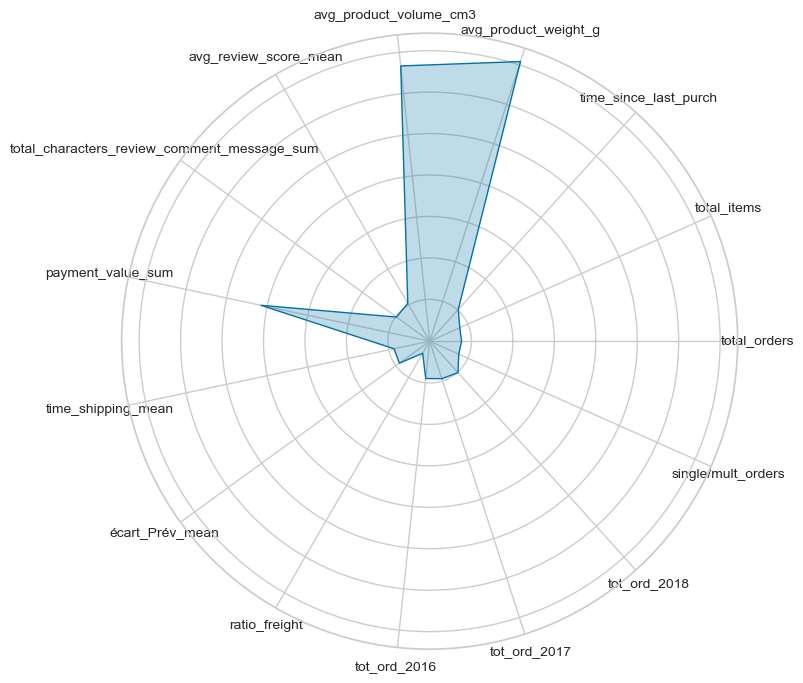

In [259]:
# Interpréter les clusters via des radarplot
def radar_plot(cluster_center, attributes):
    # Fonction pour tracer un radar plot pour un cluster
    num_attributes = len(attributes)
    angles = np.linspace(0, 2 * np.pi, num_attributes, endpoint=False).tolist()
    angles += angles[:1]
    
    fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
    
    values = cluster_center.tolist()
    values += values[:1]
    ax.plot(angles, values, linewidth=1, linestyle='solid')
    ax.fill(angles, values, alpha=0.25)
    
    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(attributes)
    plt.show()

# Assurez-vous que k correspond au nombre de clusters que vous voulez
k = 8

# Affichage des centres de clusters
cluster_centers = kmeans.cluster_centers_[:k]

# Tracer les radar plots pour chaque cluster
for i in range(len(cluster_centers)):
    print(f"Cluster {i+1}")
    radar_plot(cluster_centers[i], km3_cols)


#### iii. Interprétation métier des profils obtenus

**Cluster n°1 : 38 394 clients soit 42.2%**

- *Très récents, très satisfaits*

**Cluster n°2 : 1 774 clients soit 1.91%**

- *Articles nombreux, satisfaction moyenne, récence moyenne à forte*

**Cluster n°3 : 1 276 clients soit 1.34%**
 
- *Au moins deux commandes par clients, satisfaits,  récence moyenne à forte*

**Cluster n°4 : 4 201 clients soit 4.6%**

- *Mauvaise satisfaction client, temps de transport très longs, en lien avec la note*

**Cluster n°5 : 6 943 clients soit 7.7%**

- *Client non satisfaits également, note médiocre, à regarder au niveau des produits acheté si une catégorie se démarque*

**Cluster n°6 : 237 clients soit 0.3%**

- *Client perdu car récence très très faible malgré une note moyenne plutôt bonne avec 4*

**Cluster n°7 : 32 618 clients soit 36%**

- *Client satisfait, récence médiocre, client récupérable car satisfait*

**Cluster n°8 : 5 199 clients soit 5.7%**

- *Client gros acheteur avec de gros produits, plutôt onéreux avec une bonne note en terme de satisfaction*


#### iv. Visualisation des segments

Etant donné que nous n'avons pas inclus les variables pour la géolocalisation, les catégories produits ou encore les types de paiment. A travers une analyse bivariée, nous allons pouvoir utiliser nos clusters pour regarder si nous avons des variations signitives qui peuvent être prises en comptes du point de vue métier par les services marketing.

Notamment sur plusieurs points :
- temps de transport / review_score mauvais et localisation
- review_score moyen et les produits achetés

In [26]:
# Création du dataframe pour l'analyse
df_exp = df.copy()

In [27]:
# Reposititionner les outliers mis en avant par le isolation forest
df_exp['outlier'] = df_km3_copy['outlier']
df_exp = df_exp[df_exp['outlier'] == 1]

In [28]:
# Importer les labels des clusters
df_exp['cluster'] = df_km3_clean['cluster']

##### Région / temps de transport / Mauvaise review note

In [30]:
# Dictionnaire des équivalences
regions_bresil = {
    "AC": "Acre",
    "AL": "Alagoas",
    "AP": "Amapá",
    "AM": "Amazonas",
    "BA": "Bahia",
    "CE": "Ceará",
    "DF": "District fédéral",
    "ES": "Espirito Santo",
    "GO": "Goiás",
    "MA": "Maranhão",
    "MT": "Mato Grosso",
    "MS": "Mato Grosso do Sul",
    "MG": "Minas Gerais",
    "PA": "Pará",
    "PB": "Paraíba",
    "PR": "Paraná",
    "PE": "Pernambouc",
    "PI": "Piauí",
    "RJ": "Rio de Janeiro",
    "RN": "Rio Grande do Norte",
    "RS": "Rio Grande do Sul",
    "RO": "Rondônia",
    "RR": "Roraima",
    "SC": "Santa Catarina",
    "SP": "São Paulo",
    "SE": "Sergipe",
    "TO": "Tocantins"
}

# Remplacer les abréviations par le nom complet de la région
df_exp['customer_region'] = df_exp['customer_state_most_frequent'].map(regions_bresil)

# Afficher le dataframe mis à jour
df_exp.head(2)

,customer_unique_id,customer_zip_code_prefix_most_frequent,customer_city_most_frequent,customer_state_most_frequent,geolocation_lat_most_frequent,geolocation_lng_most_frequent,total_orders,total_items,total_price,total_freight_value,...,mean_items_per_order,mean_price_per_order,payment_is_credit_card,cat_Health_Beauty_clothing,cat_Home_Tools,single/mult_orders,ratio_freight,outlier,cluster,customer_region
0,0000366f3b9a7992bf8c76cfdf3221e2,7787,cajamar,SP,-23.340235,-46.830140,1,1,129.9,12.00,...,1.0,141.90,1,0.0,1.0,0,0.084567,1,0,São Paulo
1,0000b849f77a49e4a4ce2b2a4ca5be3f,6053,osasco,SP,-23.559115,-46.787626,1,1,18.9,8.29,...,1.0,27.19,1,1.0,0.0,0,0.304892,1,0,São Paulo


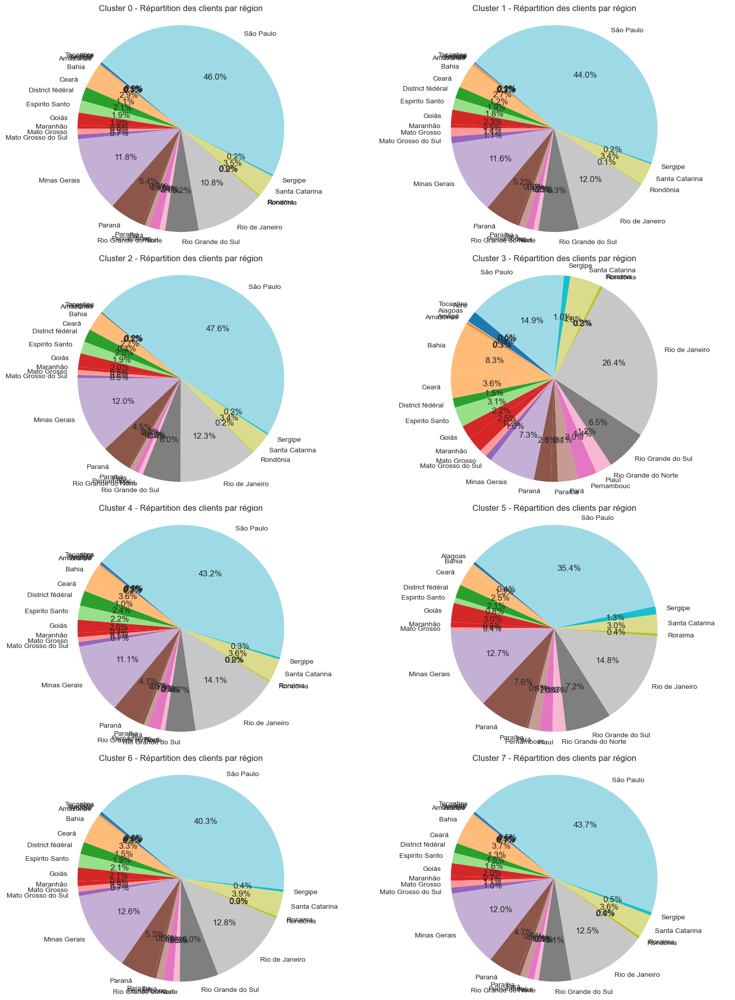

In [56]:
# Compter le nombre de clients par région pour chaque cluster
cluster_region_counts = df_exp.groupby(['cluster', 'customer_region']).size().reset_index(name='counts')

# Obtenir la liste des clusters
clusters = cluster_region_counts['cluster'].unique()
regions = cluster_region_counts['customer_region'].unique()

# Définir un jeu de couleurs commun
colors = plt.cm.tab20(np.linspace(0, 1, len(regions)))

# Créer un dictionnaire pour mapper chaque région à une couleur
color_dict = {region: colors[i] for i, region in enumerate(regions)}

# Définir le nombre de colonnes
num_cols = 2
num_rows = int(np.ceil(len(clusters) / num_cols))

# Créer une figure avec subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

# Aplatir les axes pour un accès facile
axes = axes.flatten()

for i, cluster in enumerate(clusters):
    # Filtrer les données pour le cluster en cours
    data = cluster_region_counts[cluster_region_counts['cluster'] == cluster]
    
    # Obtenir les couleurs dans l'ordre des régions
    cluster_colors = [color_dict[region] for region in data['customer_region']]
    
    # Créer le pie chart
    wedges, texts, autotexts = axes[i].pie(data['counts'], labels=data['customer_region'], autopct='%1.1f%%', startangle=140, colors=cluster_colors)
    axes[i].set_title(f'Cluster {cluster} - Répartition des clients par région')
    axes[i].axis('equal')  # Assure que le pie chart est circulaire

# Supprimer les sous-graphiques inutilisés
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Afficher la figure
plt.tight_layout()
plt.show()

Nous constatons de manière significative une répartition différente concernant la région des clients pour le cluster n°3. Il semble donc qu'il y ait une influence notable entre les problèmes de transport et les mauvaises notes des clients en liens avec la région de Rio de Janeiro et de Bahia.

##### Les catégories produits selon les clusters

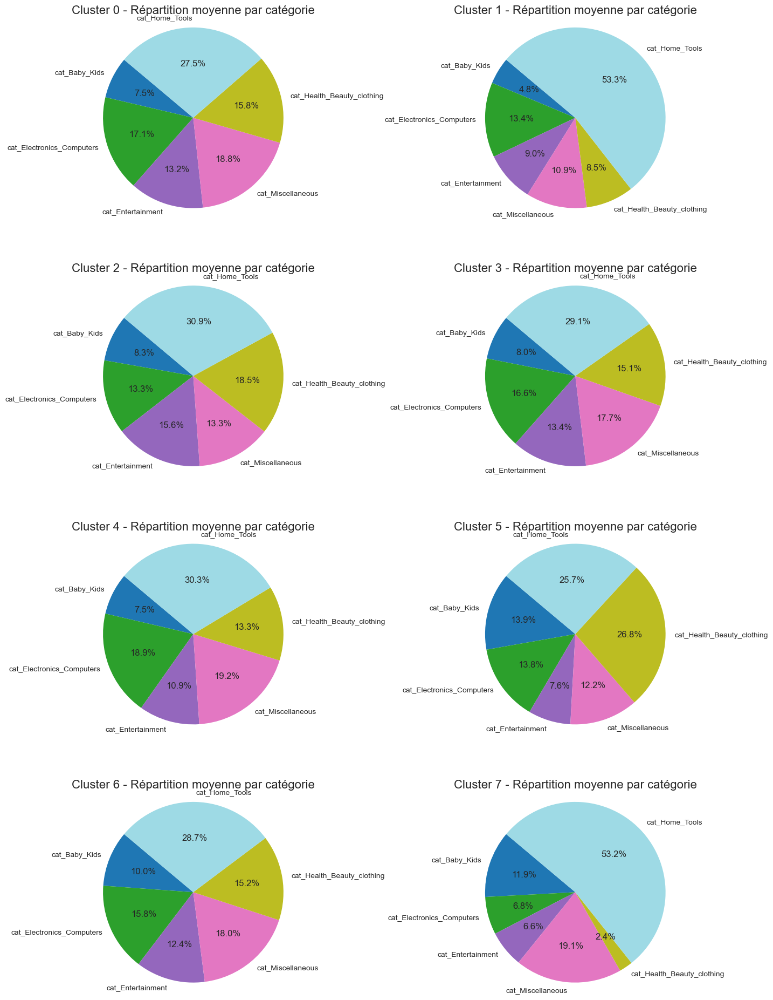

In [54]:
# Identifier les colonnes commençant par 'cat'
cat_columns = [col for col in df_exp.columns if col.startswith('cat')]

# Calculer la moyenne de chaque colonne 'cat' pour chaque cluster
cat_means = df_exp.groupby('cluster')[cat_columns].mean().reset_index()

# Obtenir la liste des clusters
clusters = cat_means['cluster'].unique()

# Définir un jeu de couleurs commun
colors = plt.cm.tab20(np.linspace(0, 1, len(cat_columns)))

# Créer un dictionnaire pour mapper chaque colonne 'cat' à une couleur
color_dict = {cat: colors[i] for i, cat in enumerate(cat_columns)}

# Définir le nombre de colonnes
num_cols = 2  
num_rows = int(np.ceil(len(clusters) / num_cols))

# Créer une figure avec subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))  

# Aplatir les axes pour un accès facile
axes = axes.flatten()

for i, cluster in enumerate(clusters):
    # Filtrer les données pour le cluster en cours
    data = cat_means[cat_means['cluster'] == cluster]
    
    # Obtenir les valeurs moyennes des colonnes 'cat'
    values = data[cat_columns].values.flatten()
    
    # Obtenir les couleurs dans l'ordre des colonnes 'cat'
    cluster_colors = [color_dict[cat] for cat in cat_columns]
    
    # Créer le pie chart
    wedges, texts, autotexts = axes[i].pie(values, labels=cat_columns, autopct='%1.1f%%', startangle=140, colors=cluster_colors)
    axes[i].set_title(f'Cluster {cluster} - Répartition moyenne par catégorie', fontsize=16)
    axes[i].axis('equal')  # Assure que le pie chart est circulaire

# Supprimer les sous-graphiques inutilisés
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajuster l'espace entre les subplots pour éviter le chevauchement
plt.tight_layout(pad=5.0)
plt.show()


#### v. Visualisation des clusters obtenus sur des projections

##### PCA

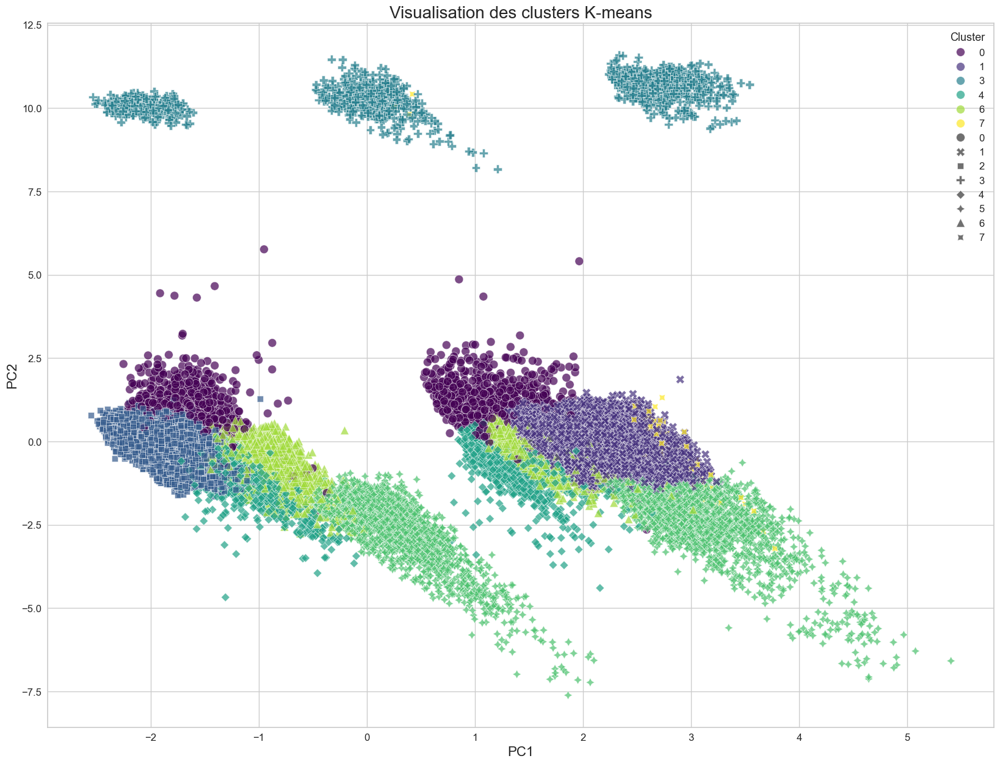

In [22]:
# Normalisation des données
scaler = StandardScaler()
df_km3_clean_scaled = scaler.fit_transform(df_km3_clean)

# Réduction avec une PCA pour visualisation en deux composantes
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(df_km3_clean_scaled)

# Ajouter les labels des clusters aux données réduites
kmeans = KMeans(n_clusters=8)
kmeans.fit(df_km3_clean_scaled)
reduced_data_with_clusters = pd.DataFrame(reduced_data, columns=['PC1', 'PC2'])
reduced_data_with_clusters['cluster'] = kmeans.labels_

# Visualisation avec ajustements
plt.figure(figsize=(20, 15))
sns.scatterplot(
    data=reduced_data_with_clusters, 
    x='PC1', 
    y='PC2', 
    hue='cluster', 
    palette='viridis', 
    style='cluster', 
    s=100,             
    alpha=0.7,         
    edgecolor='w',     
    linewidth=0.5
)
plt.title('Visualisation des clusters K-means', fontsize=20)
plt.xlabel('PC1', fontsize=16)
plt.ylabel('PC2', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(loc='upper right', title='Cluster', title_fontsize='13', fontsize='12')
plt.show()

##### T-SNE

C:\Users\justi\AppData\Local\Temp\ipykernel_14380\3133936866.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(cluster_centers))


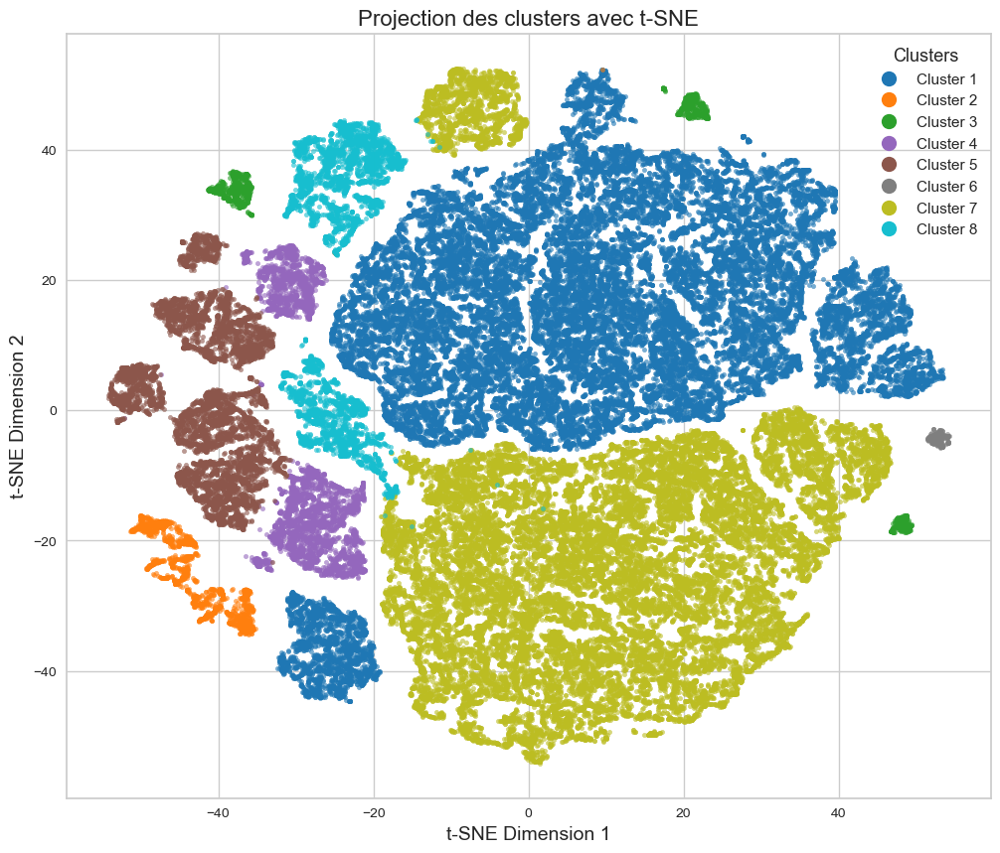

In [12]:
# Réduction de dimension avec t-SNE en spécifiant les paramètres init et learning_rate
tsne = TSNE(n_components=2, random_state=42, init='random', learning_rate=200.0)
cluster_tsne = tsne.fit_transform(df_km3_scaled)

# Définir une palette de couleurs distinctes
colors = plt.cm.get_cmap('tab10', len(cluster_centers))

# Tracer la projection des clusters
plt.figure(figsize=(12, 10))
for i in range(len(cluster_centers)):
    plt.scatter(cluster_tsne[df_km3_scaled['cluster'] == i][:, 0], 
                cluster_tsne[df_km3_scaled['cluster'] == i][:, 1], 
                s=10, alpha=0.6, label=f'Cluster {i+1}', c=np.array(colors(i)).reshape(1, -1))

# Créer des handles personnalisés pour la légende avec une taille de point plus grande
from matplotlib.lines import Line2D
handles = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {i+1}',
                  markerfacecolor=np.array(colors(i)).reshape(1, -1), markersize=11) for i in range(len(cluster_centers))]

# Ajouter des éléments de style pour améliorer la lisibilité
plt.title('Projection des clusters avec t-SNE', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)
plt.legend(title='Clusters', title_fontsize='13', fontsize='11', handles=handles)
plt.grid(True)
plt.show()

##### MDS

C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


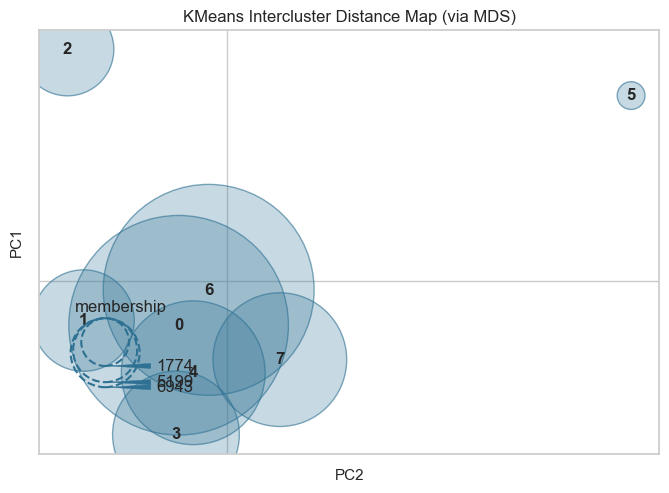

C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


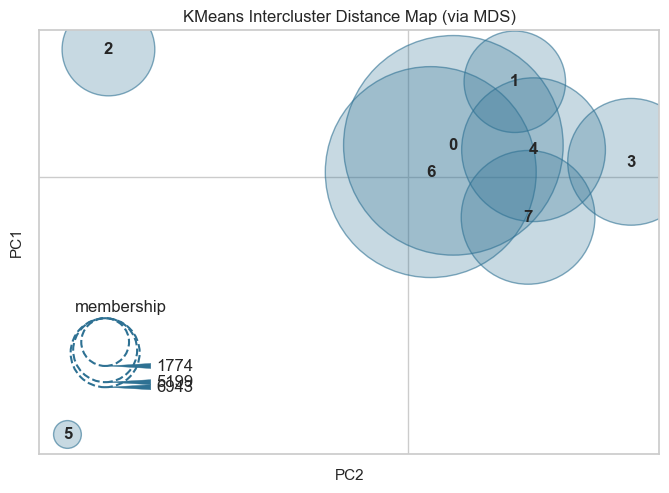

<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [13]:
# Visualisation des clusters dans l'espace PCA

# Instancier l'outil de visualisation de la distance entre clusters
visualizer = InterclusterDistance(kmeans)
visualizer.fit(df_km3_scaled)
visualizer.show()

# Visualisation des clusters dans l'espace UMAP

# Instancier l'outil de visualisation de la distance entre clusters
visualizer = InterclusterDistance(kmeans, projection='umap')
visualizer.fit(df_km3_scaled)
visualizer.show()


##### Yellowbrick

C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KMeans was fitted without feature names
  warnings.warn(


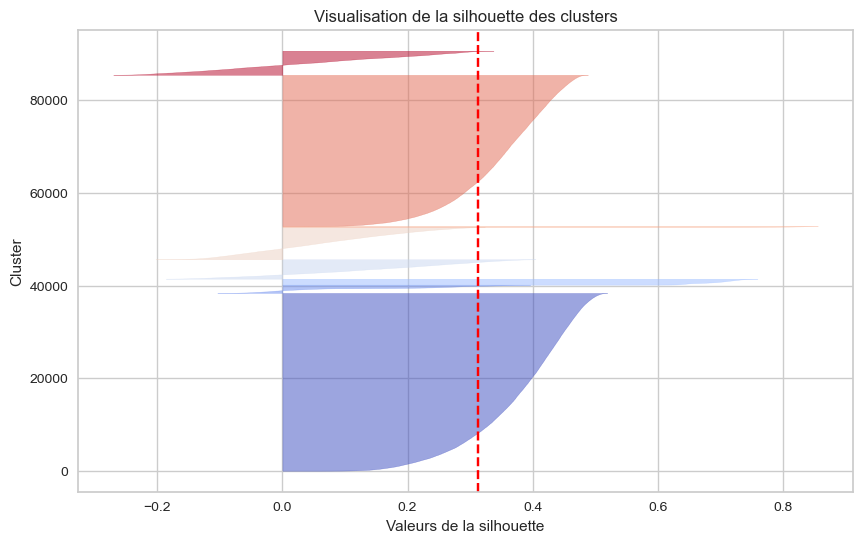

In [25]:
# Suppression de la colonne 'Cluster' du DataFrame
df_km3_scaled_yb = df_km3_scaled.drop(columns=['cluster'])

# Création de la visualisation silhouette
fig, ax = plt.subplots(figsize=(10, 6))  # Taille de la figure

visualizer = SilhouetteVisualizer(kmeans, colors='coolwarm', ax=ax)
visualizer.fit(df_km3_scaled_yb)

# Personnalisation du graphique
visualizer.set_title("Visualisation de la silhouette des clusters")
visualizer.ax.set_xlabel("Valeurs de la silhouette")
visualizer.ax.set_ylabel("Cluster")

# Ajout d'une grille pour améliorer la lisibilité
visualizer.ax.grid(True)

# Affichage du graphique
plt.show()

### f. Importance des features

In [16]:
# Extraction des valeurs à partir du dataframe
X = df_km3.values

# Détection des outliers avec Isolation Forest
isolation_forest = IsolationForest(n_estimators=150, contamination=0.02, random_state=42)
outliers = isolation_forest.fit_predict(X)

# Créer une copie
df_km3_copy = df_km3.copy()

# Marquer les outliers dans le DataFrame
df_km3_copy['outlier'] = outliers

# Conserver uniquement les points non-outliers
df_km3_clean = df_km3_copy[df_km3_copy['outlier'] == 1].drop(columns=['outlier'])

# Création du scaler de sklearn
scaler = StandardScaler()

# Application du StandardScaler aux colonnes numériques
X_scaled = scaler.fit_transform(df_km3_clean)

# Initialisation et ajustement du modèle K-means sur les données normalisées
kmeans = KMeans(n_clusters=8, random_state=42)
kmeans.fit(X_scaled)

# Création d'un arbre de décision pour évaluer l'importance des features
decision_tree = DecisionTreeClassifier(random_state=42)
decision_tree.fit(X_scaled, kmeans.labels_)

# Affichage de l'importance des features
feature_importance = pd.DataFrame(decision_tree.feature_importances_, index=df_km3_clean.columns, columns=['Importance'])
feature_importance.sort_values(by='Importance', ascending=False, inplace=True)
print(feature_importance)

                                             Importance
tot_ord_2018                                   0.449661
total_characters_review_comment_message_sum    0.113388
avg_product_weight_g                           0.104855
avg_review_score_mean                          0.092074
total_items                                    0.052190
time_shipping_mean                             0.051886
écart_Prév_mean                                0.036527
avg_product_volume_cm3                         0.028515
total_orders                                   0.019621
single/mult_orders                             0.017520
payment_value_sum                              0.014700
time_since_last_purch                          0.008382
tot_ord_2016                                   0.006809
ratio_freight                                  0.002466
tot_ord_2017                                   0.001408


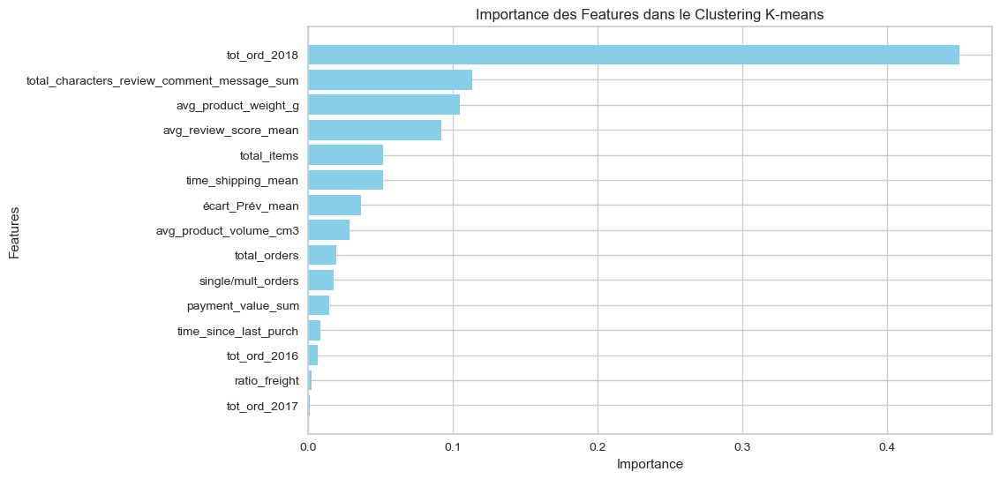

In [17]:
# Affichage de l'importance des features sous forme d'histogramme
plt.figure(figsize=(10, 6))
plt.barh(feature_importance.index, feature_importance['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Importance des Features dans le Clustering K-means')
plt.gca().invert_yaxis()
plt.show()


### g. Analyse des outliers

In [5]:
# Conserver uniquement les points non-outliers
df_outliers = df_km3_copy.copy()
df_outliers = df_outliers[df_outliers['outlier'] == - 1].drop(columns=['outlier'])

In [6]:
# Describe sur les données
df_outliers.describe()

,total_orders,total_items,time_since_last_purch,avg_product_weight_g,avg_product_volume_cm3,avg_review_score_mean,total_characters_review_comment_message_sum,payment_value_sum,time_shipping_mean,écart_Prév_mean,ratio_freight,tot_ord_2016,tot_ord_2017,tot_ord_2018,single/mult_orders
count,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000,1850.000000
mean,1.985946,2.796216,226.509730,5587.634731,37793.484311,3.633712,90.318919,512.520135,12.466037,-9.384730,0.202766,0.014054,0.870270,1.101622,0.813514
std,0.768370,1.839735,161.260698,8284.472665,58095.731115,1.477356,103.098203,658.527966,17.676875,18.266032,0.117990,0.130801,1.024541,0.998889,0.389604
min,1.000000,1.000000,0.000000,50.000000,352.000000,1.000000,0.000000,25.250000,-1.500000,-71.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,2.000000,95.000000,525.000000,4876.250000,2.500000,0.000000,185.147500,4.500000,-16.916667,0.116688,0.000000,0.000000,0.000000,1.000000
50%,2.000000,2.000000,192.000000,1500.000000,13696.750000,4.000000,61.500000,321.330000,7.500000,-12.000000,0.180936,0.000000,0.000000,1.000000,1.000000
75%,2.000000,3.000000,334.000000,6600.000000,38805.500000,5.000000,152.000000,588.125000,13.500000,-6.500000,0.267428,0.000000,2.000000,2.000000,1.000000
max,15.000000,24.000000,693.000000,30000.000000,296208.000000,5.000000,700.000000,13664.080000,194.000000,175.000000,0.838152,2.000000,8.000000,7.000000,1.000000


In [7]:
# Création du scaler de sklearn
scaler = StandardScaler()

# Application du StandardScaler aux colonnes numériques
X_scaled = scaler.fit_transform(df_outliers)

# Création d'un nouveau dataframe pour stocker les données mises à l'échelle
df_outliers_scaled = pd.DataFrame(X_scaled, columns=df_outliers.columns )

C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.
  warnings.warn(
C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.
  warnings.warn(
C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.
  warnings.warn(
C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklea

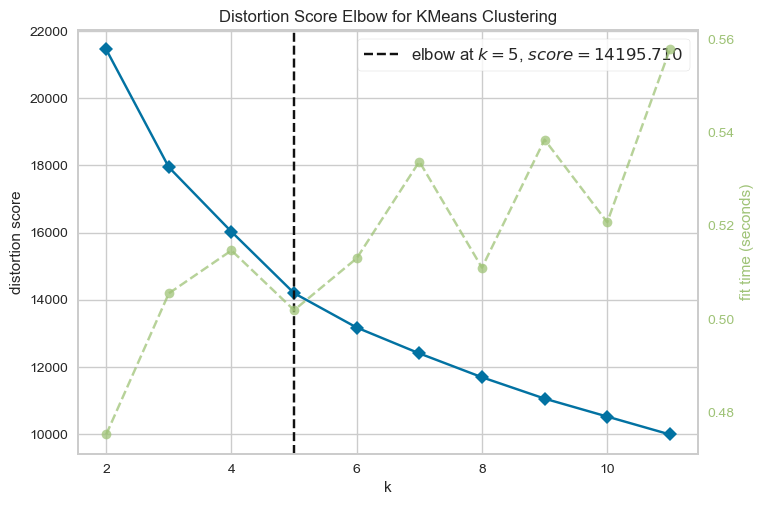

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [45]:
import os
os.environ["OMP_NUM_THREADS"] = "8"

# Initialisation de KMeans
model = KMeans()

# Utilisation de la visualisation Elbow
visualizer = KElbowVisualizer(model, k=(2, 12))

visualizer.fit(X_scaled)
visualizer.show()

C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.
  warnings.warn(
C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.
  warnings.warn(
C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.
  warnings.warn(
C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklea

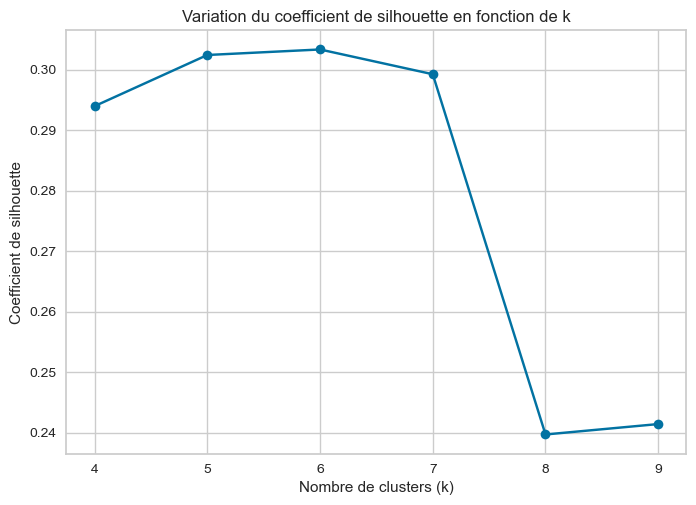

In [30]:
# Liste des valeurs de k à tester
k_values = range(4, 10) 

# Initialiser une liste pour stocker les coefficients de silhouette pour chaque k
silhouette_scores = []

# Parcourir chaque valeur de k
for k in k_values:
    # Créer un modèle K-means avec k clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    
    # Effectuer le clustering
    cluster_labels = kmeans.fit_predict(X_scaled)
    
    # Calculer le coefficient de silhouette
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    
    # Ajouter le coefficient de silhouette à la liste
    silhouette_scores.append(silhouette_avg)

# Tracer le graphique
plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Nombre de clusters (k)')
plt.ylabel('Coefficient de silhouette')
plt.title('Variation du coefficient de silhouette en fonction de k')
plt.grid(True)
plt.show()

In [8]:
optimal_k = 5

In [9]:
# Initialisation du modèle K-means
kmeans = KMeans(n_clusters=optimal_k, random_state=42)

# Apprentissage du modèle
kmeans.fit(df_outliers_scaled)

# Ajout des labels de clusters au DataFrame
df_outliers_scaled = df_outliers_scaled.copy()
df_outliers_scaled.loc[:, 'cluster'] = kmeans.labels_

# Affichage des centres de clusters
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
cluster_centers_df = pd.DataFrame(cluster_centers, columns=df_outliers.columns)

cluster_centers_df.round(5)


C:\Users\justi\.conda\envs\env_projetno5_olist\Lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.
  warnings.warn(


,total_orders,total_items,time_since_last_purch,avg_product_weight_g,avg_product_volume_cm3,avg_review_score_mean,total_characters_review_comment_message_sum,payment_value_sum,time_shipping_mean,écart_Prév_mean,ratio_freight,tot_ord_2016,tot_ord_2017,tot_ord_2018,single/mult_orders
0,2.13778,2.91496,111.71798,2370.17593,16007.30476,3.95116,83.06351,367.75521,9.22295,-11.69049,0.20871,0.00000,0.17761,1.96017,0.99785
1,1.01190,1.85317,287.50397,22773.23063,156855.94102,2.57937,100.55952,1355.64258,13.48611,-7.44048,0.15787,0.00000,0.58730,0.42460,0.01190
2,2.32743,3.23363,361.88319,2862.22571,19660.45477,3.90367,91.21239,396.48517,8.92929,-13.80523,0.20993,0.00000,2.20885,0.11858,0.99469
3,1.47826,2.69565,576.04348,6085.72464,41883.51159,3.44203,129.78261,394.38174,3.93478,-35.66667,0.20778,1.13043,0.21739,0.13043,0.43478
4,1.03704,1.34568,309.79012,7891.94444,42567.71605,1.44444,124.23457,392.72630,73.58025,49.30864,0.22293,0.00000,0.54321,0.49383,0.03704


In [10]:
# Transposer le DataFrame
cluster_centers_df_transposed = cluster_centers_df.T

# Arrondir les valeurs à deux chiffres après la virgule et convertir en chaînes de caractères formatées
cluster_centers_df_transposed = cluster_centers_df_transposed.applymap(lambda x: f"{x:.3f}")

# Fonction pour appliquer la couleur en fonction de l'échelle de chaque ligne
def colorize_by_row(series):
    # Convertir les valeurs en flottants pour la normalisation
    series_float = series.astype(float)
    # Normaliser les valeurs entre 0 et 1 pour créer une échelle de couleurs
    normalized_values = (series_float - series_float.min()) / (series_float.max() - series_float.min())
    # Utiliser une colormap
    colors = plt.cm.RdYlBu(normalized_values)
    # Convertir les valeurs RGBA en valeurs hexadécimales
    hex_colors = [rgb2hex(color) for color in colors]
    return ['background-color: %s; color: black; font-weight: bold; font-size: 14px' % color for color in hex_colors]

# Convertir les valeurs RGBA en hexadécimal
def rgb2hex(rgb):
    return '#{:02x}{:02x}{:02x}'.format(int(rgb[0] * 255), int(rgb[1] * 255), int(rgb[2] * 255))

# Appliquer la couleur ligne par ligne
styled_df = cluster_centers_df_transposed.style.apply(colorize_by_row, axis=1)

# Afficher le DataFrame stylisé
styled_df


C:\Users\justi\AppData\Local\Temp\ipykernel_7364\1944976683.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  cluster_centers_df_transposed = cluster_centers_df_transposed.applymap(lambda x: f"{x:.3f}")


,0,1,2,3,4
total_orders,2.138,1.012,2.327,1.478,1.037
total_items,2.915,1.853,3.234,2.696,1.346
time_since_last_purch,111.718,287.504,361.883,576.043,309.790
avg_product_weight_g,2370.176,22773.231,2862.226,6085.725,7891.944
avg_product_volume_cm3,16007.305,156855.941,19660.455,41883.512,42567.716
avg_review_score_mean,3.951,2.579,3.904,3.442,1.444
total_characters_review_comment_message_sum,83.064,100.560,91.212,129.783,124.235
payment_value_sum,367.755,1355.643,396.485,394.382,392.726
time_shipping_mean,9.223,13.486,8.929,3.935,73.580
écart_Prév_mean,-11.690,-7.440,-13.805,-35.667,49.309


In [11]:
df_outliers['cluster'] = kmeans.labels_

In [13]:
# Nombre de clients par cluster
cluster_counts = df_outliers['cluster'].value_counts()

print("Nombre de clients par cluster:")
print(cluster_counts)

Nombre de clients par cluster:
cluster
0    929
2    565
1    252
4     81
3     23
Name: count, dtype: int64


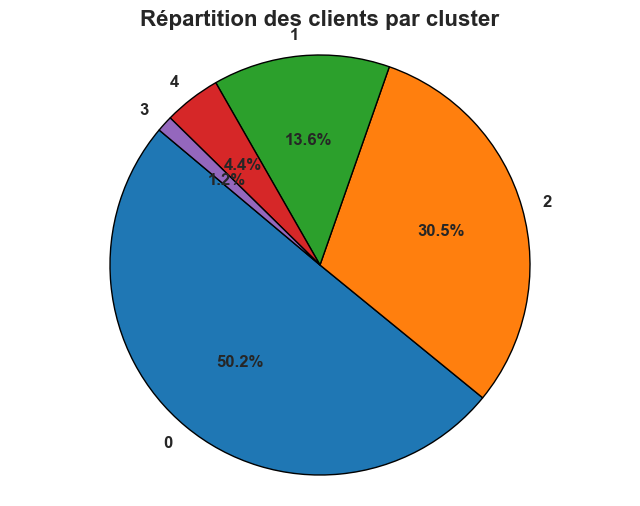

In [49]:
# Nombre de clients par cluster
cluster_counts = df_outliers['cluster'].value_counts()

# Couleurs pour chaque cluster
colors = plt.cm.tab10.colors[:len(cluster_counts)]

# Création du diagramme circulaire
plt.figure(figsize=(8, 6))
plt.pie(cluster_counts, 
        labels=cluster_counts.index, 
        autopct='%1.1f%%', 
        startangle=140, 
        colors=colors, 
        wedgeprops={'edgecolor': 'black', 'linewidth': 1},
        textprops={'fontsize': 12, 'fontweight': 'bold'})
plt.axis('equal')
plt.title('Répartition des clients par cluster', fontsize=16, fontweight='bold')
plt.show()


C:\Users\justi\AppData\Local\Temp\ipykernel_5328\4048010402.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(cluster_centers))


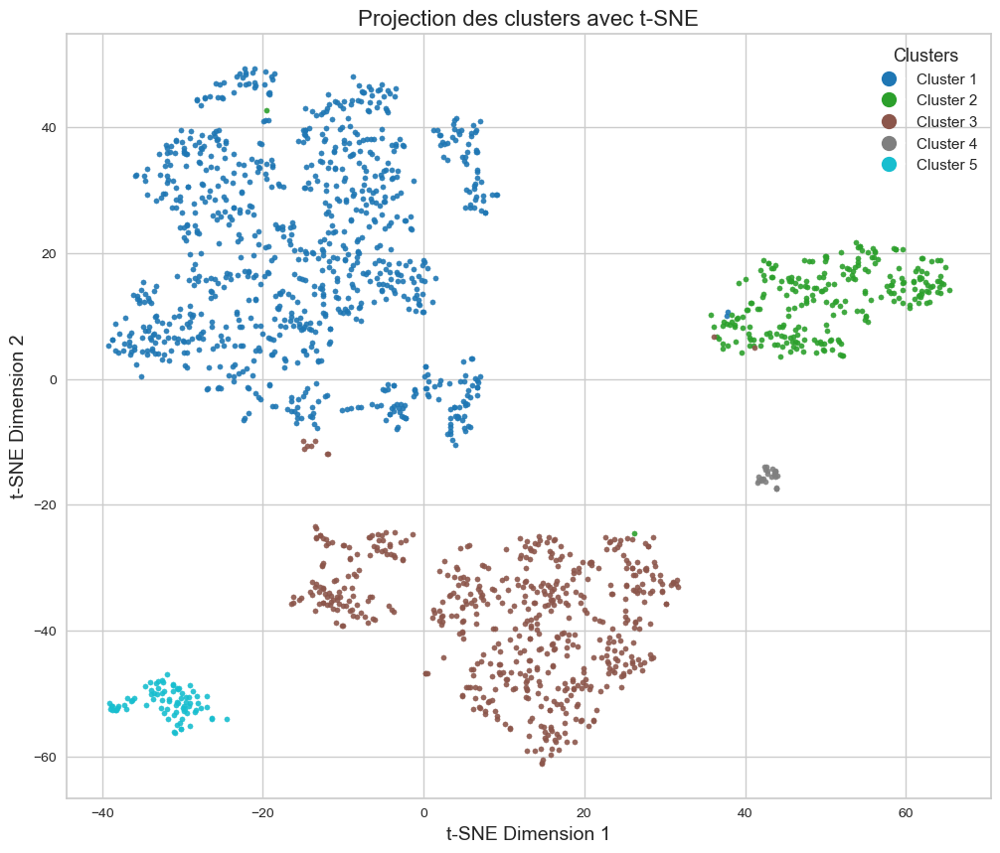

In [50]:
# Réduction de dimension avec t-SNE en spécifiant les paramètres init et learning_rate
tsne = TSNE(n_components=2, random_state=42, init='random', learning_rate=200.0)
cluster_tsne = tsne.fit_transform(df_outliers_scaled)

# Définir une palette de couleurs distinctes
colors = plt.cm.get_cmap('tab10', len(cluster_centers))

# Tracer la projection des clusters
plt.figure(figsize=(12, 10))
for i in range(len(cluster_centers)):
    plt.scatter(cluster_tsne[df_outliers_scaled['cluster'] == i][:, 0], 
                cluster_tsne[df_outliers_scaled['cluster'] == i][:, 1], 
                s=14, alpha=0.9, label=f'Cluster {i+1}', c=np.array(colors(i)).reshape(1, -1))

# Créer des handles personnalisés pour la légende avec une taille de point plus grande
from matplotlib.lines import Line2D
handles = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {i+1}',
                  markerfacecolor=np.array(colors(i)).reshape(1, -1), markersize=11) for i in range(len(cluster_centers))]

# Ajouter des éléments de style pour améliorer la lisibilité
plt.title('Projection des clusters avec t-SNE', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)
plt.legend(title='Clusters', title_fontsize='13', fontsize='11', handles=handles)
plt.grid(True)
plt.show()

### h. Consolidation du dataframe (pour mesurer la stabilité des clusters dans un autre notebook dédié)

In [16]:
# Transformation du dataframe en fichier CSV
df_km3_clean.to_csv('df_stab.csv', index=False)

# V. Clustering avec le DBSCAN

Nous allons faire ici une modélisation avec le DBSCAN. Cet algorithme ne fonctionne pas de la même manière que le k-means. Tandis uqe le k-means partitionne les données en un nombre fixe de clusters sphériques en minimisant la variance intra-cluster, le DBSCAN identifie quant à lui des clusters de forme arbitraire en fonction de la densité des points et peut détecter les anomalies comme des bruits.
L'objectif est de voir si nous pouvons avoir une meilleure segmentation que celle obtenue sur notre troisème modélisation avec le k-means, et à minima de retrouver une segmentation similaire du point de vue métier. Cela confirmerait les résultats obtenus plus en amont.

Le DBSCAN étant plutôt lourd, je vais faire une sampling de mon dataset pour que cela soit plus rapide concernant les temps d'exécution, tout en vérifier la représentativité des données en faisant un test de Kolmogorov-Smirnov en tant que test paramétrique.

## 1. Echantillonnage du dataset

### a. Faire le test de Kolmogorov-Smirnov

Cette méthode nous permet d'effectuer un contrôle de qualité sur notre échantillonnage en nous assurant que les distributions des différentes features sont similaires entre l'échantillon et le dataset complet.

Feature: customer_zip_code_prefix_most_frequent
Statistique du test KS: 0.005090829022417087
P-value du test KS: 0.980576058141334
Status: OK



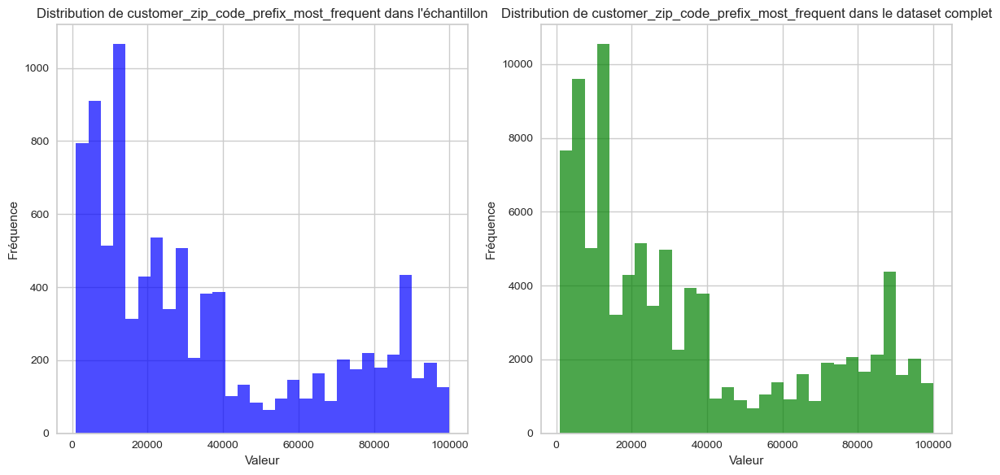

Feature: geolocation_lat_most_frequent
Statistique du test KS: 0.007383923289006611
P-value du test KS: 0.7460498440523398
Status: OK



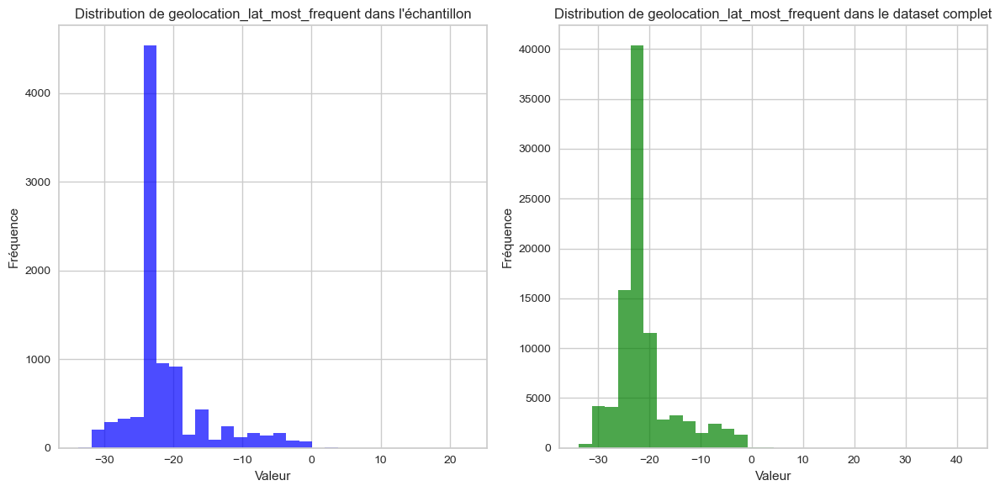

Feature: geolocation_lng_most_frequent
Statistique du test KS: 0.0036912485766054104
P-value du test KS: 0.9998263816387561
Status: OK



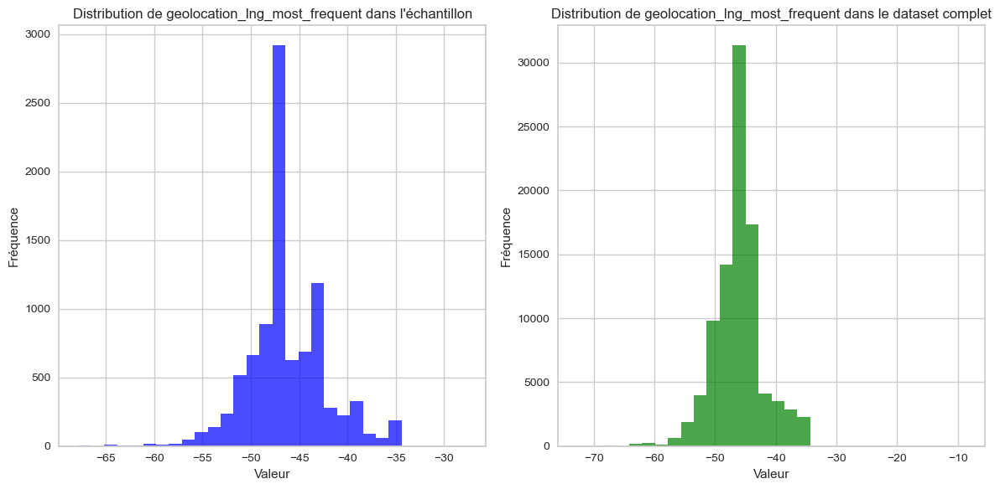

Feature: total_orders
Statistique du test KS: 0.002119798895027225
P-value du test KS: 0.9999999999998482
Status: OK



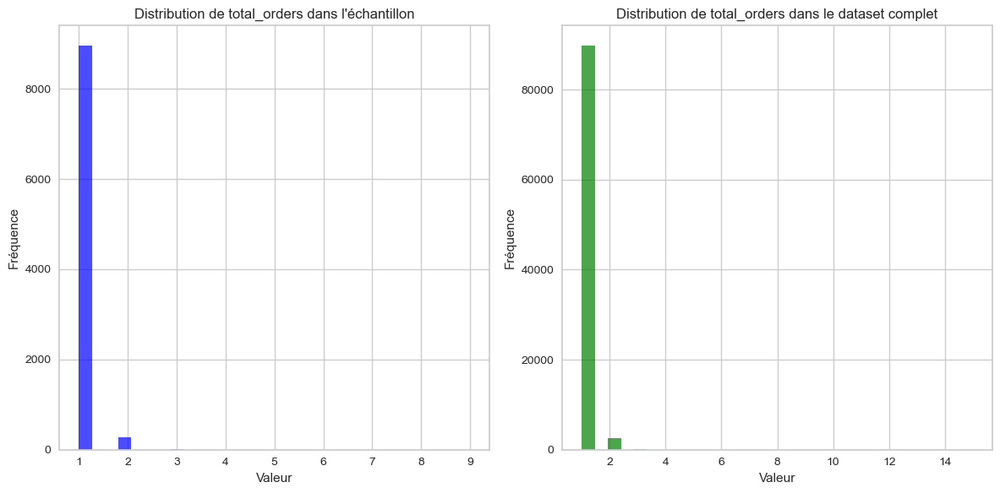

Feature: total_items
Statistique du test KS: 0.0021434563837431364
P-value du test KS: 0.9999999999996985
Status: OK



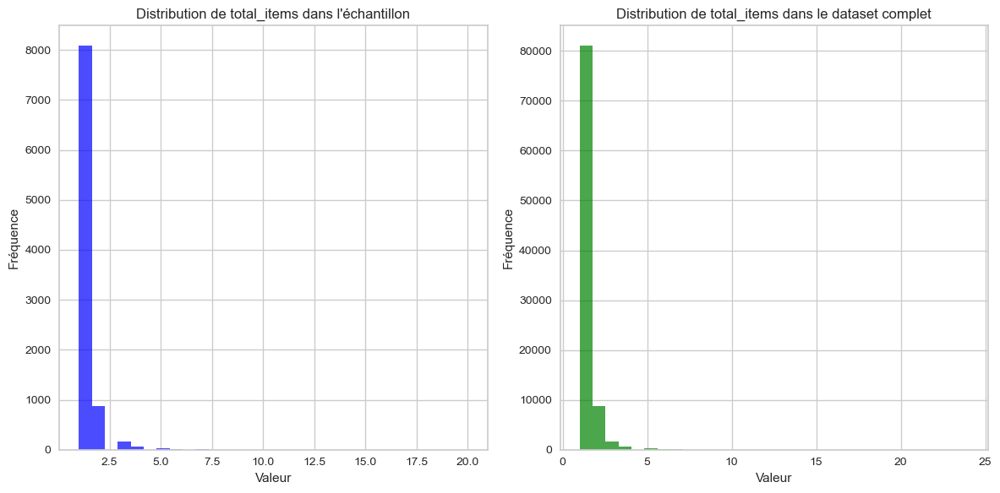

Feature: total_price
Statistique du test KS: 0.007880578586752451
P-value du test KS: 0.6702938683622539
Status: OK



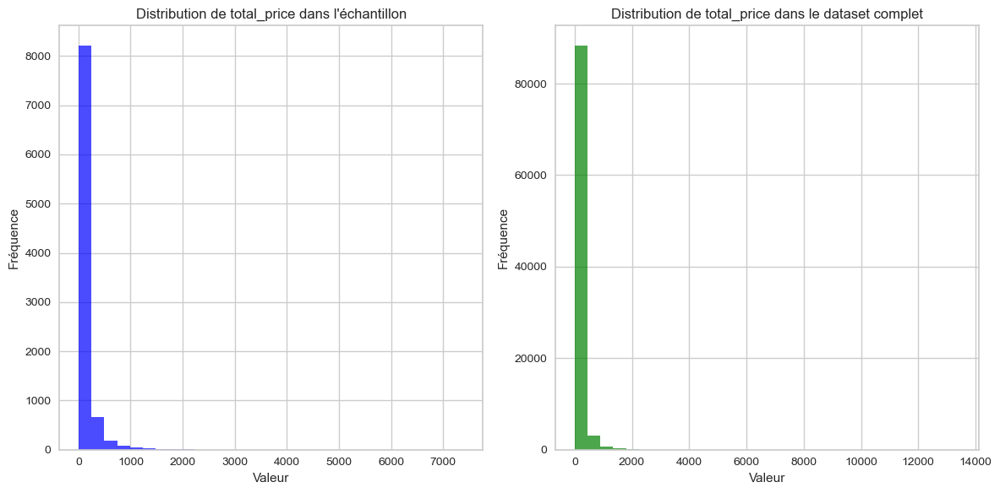

Feature: total_freight_value
Statistique du test KS: 0.004757122597931984
P-value du test KS: 0.9907778953127906
Status: OK



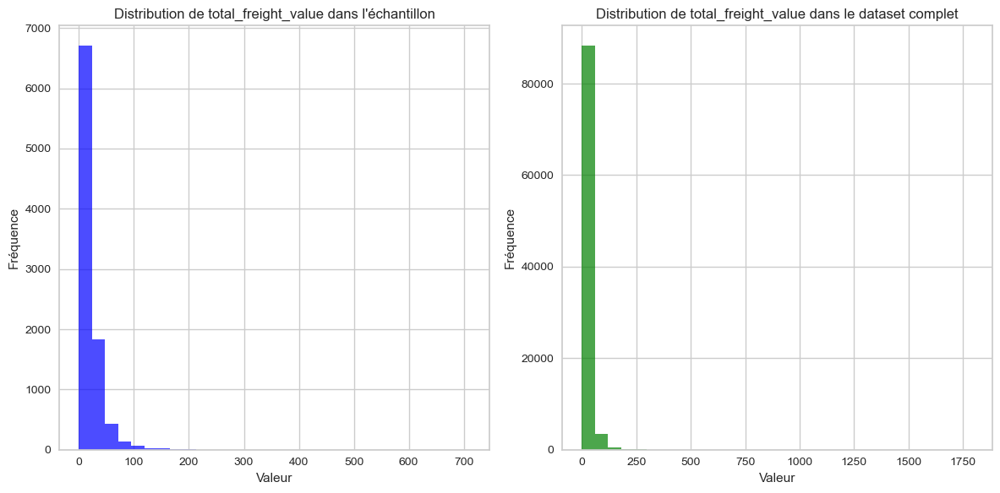

Feature: avg_product_description_length
Statistique du test KS: 0.010281611460692841
P-value du test KS: 0.33417600736330466
Status: OK



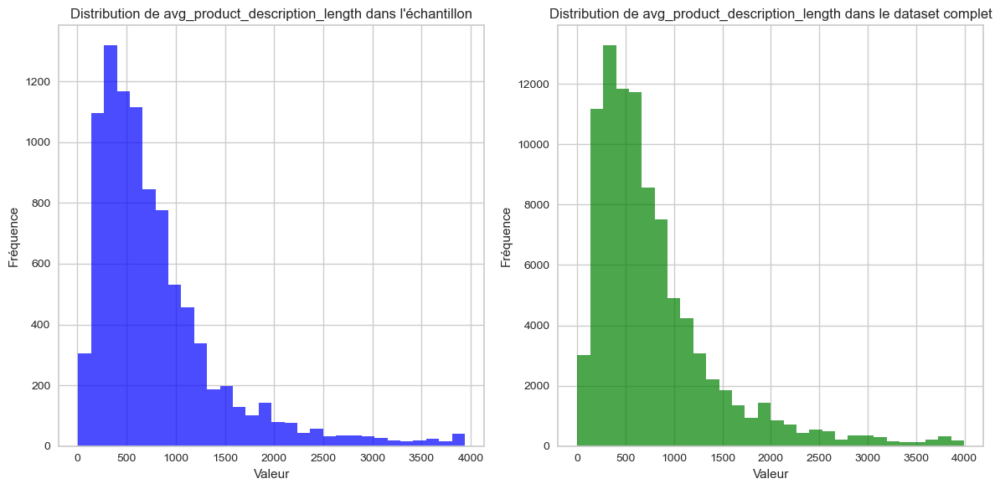

Feature: avg_product_weight_g
Statistique du test KS: 0.009135709010915594
P-value du test KS: 0.4813900495717123
Status: OK



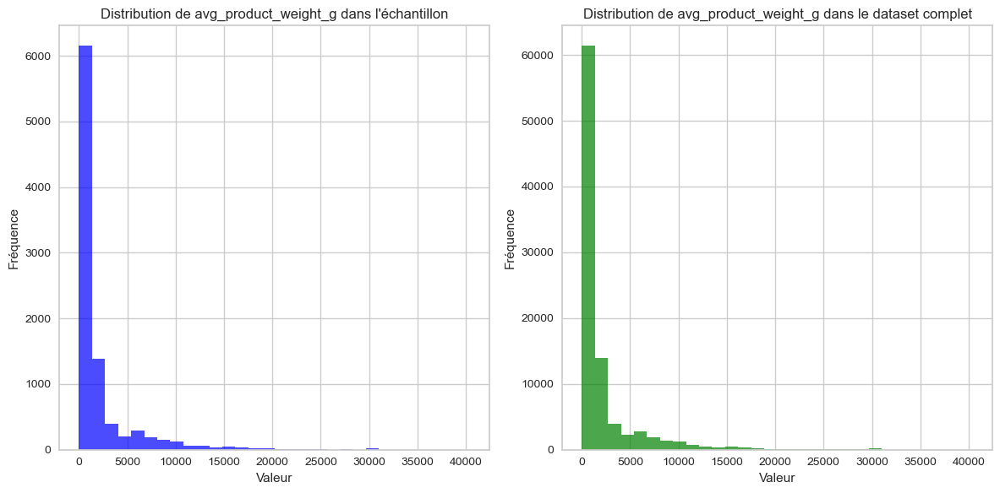

Feature: avg_product_volume_cm3
Statistique du test KS: 0.007361575039709578
P-value du test KS: 0.7493827753324888
Status: OK



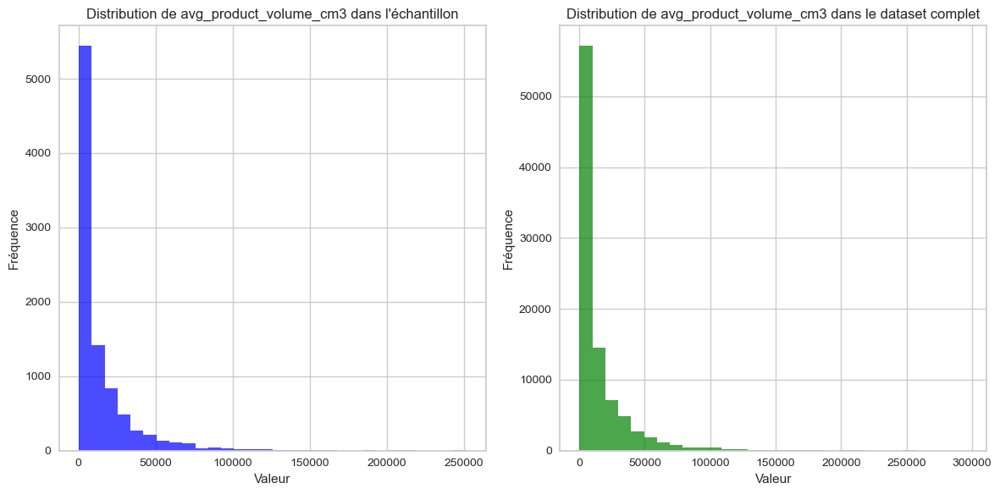

Feature: total_characters_review_comment_message_sum
Statistique du test KS: 0.004912473206707513
P-value du test KS: 0.9866923974778166
Status: OK



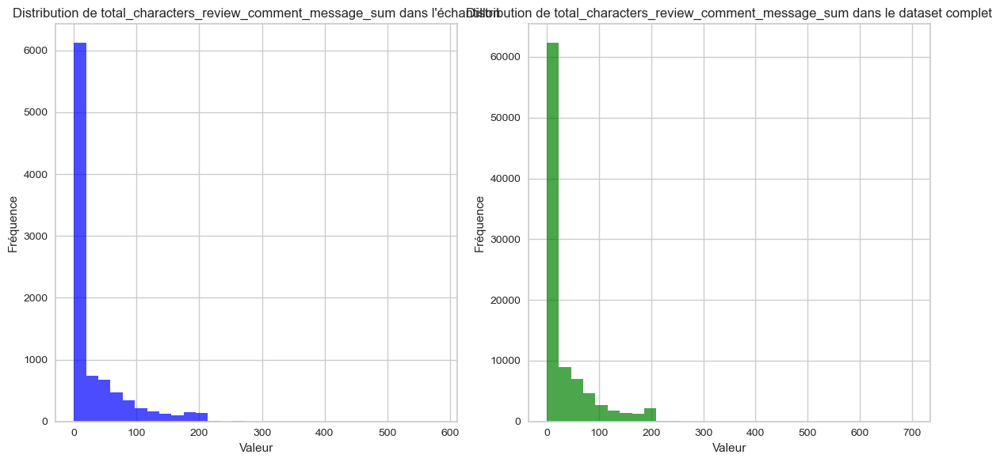

Feature: avg_review_score_mean
Statistique du test KS: 0.00500405801095849
P-value du test KS: 0.9837536313815695
Status: OK



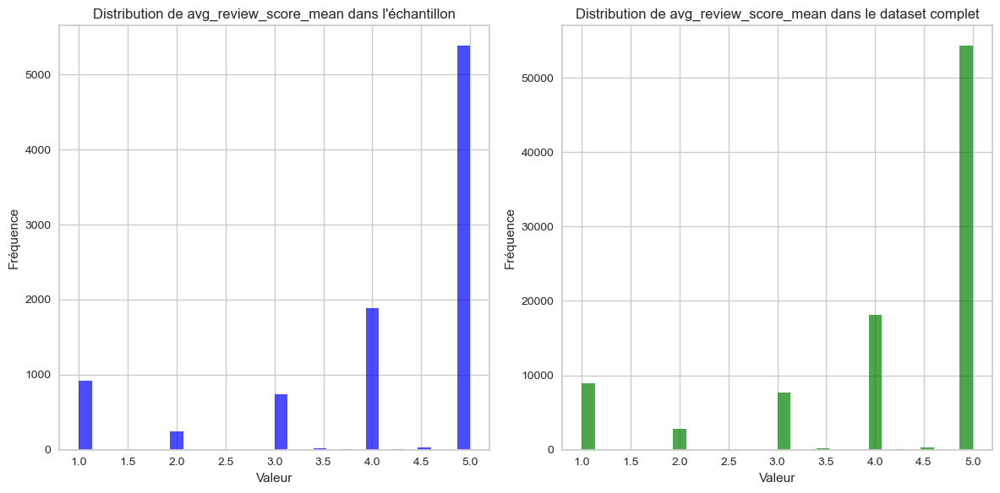

Feature: avg_délaiSatisfaction_mean
Statistique du test KS: 0.008211352081146178
P-value du test KS: 0.6191759830890347
Status: OK



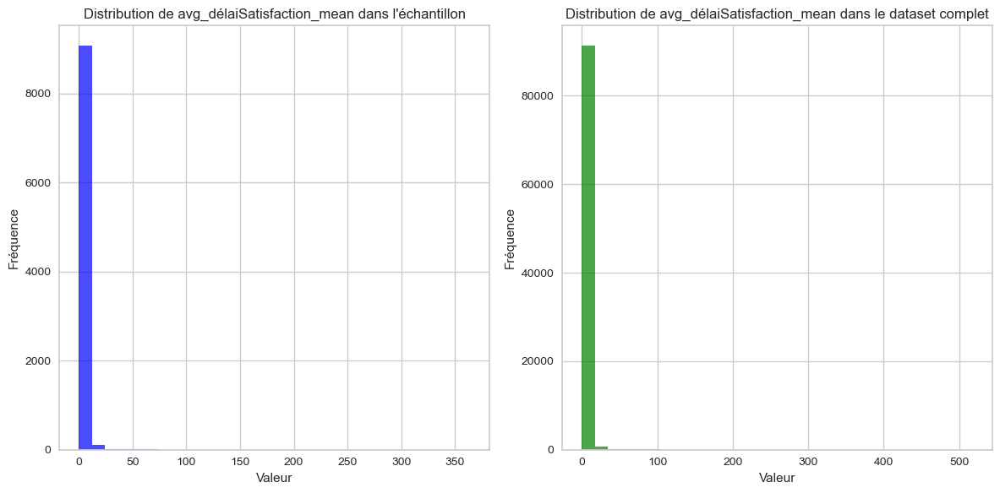

Feature: max_payment_sequential
Statistique du test KS: 0.003351059079068741
P-value du test KS: 0.9999800470085624
Status: OK



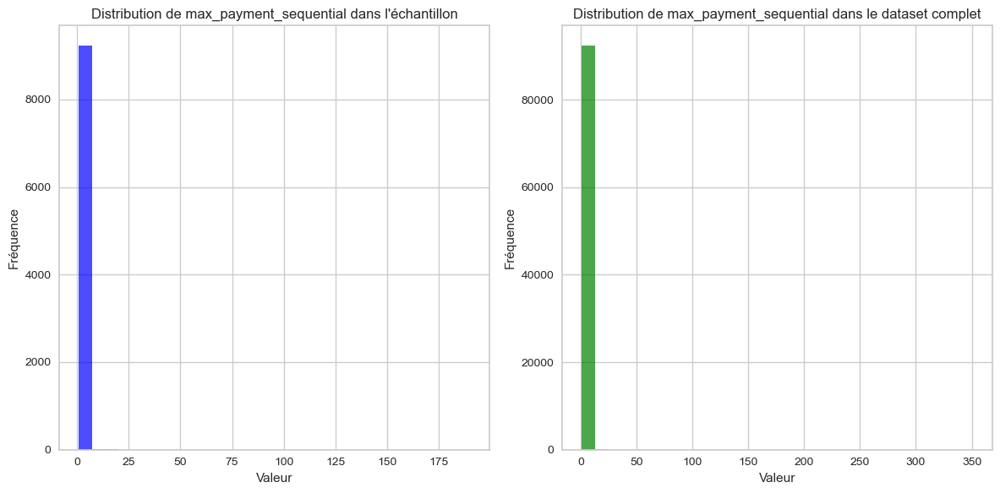

Feature: payment_value_sum
Statistique du test KS: 0.00792459241050647
P-value du test KS: 0.6634914731700821
Status: OK



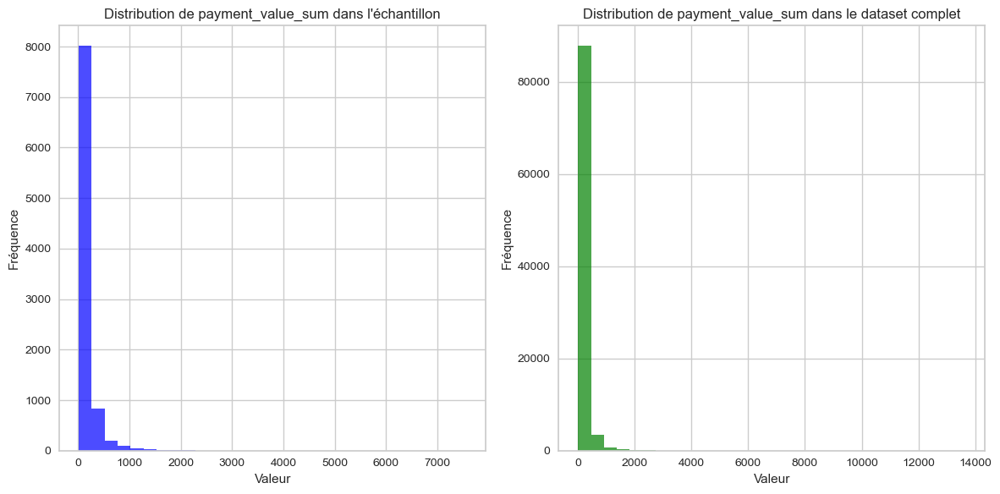

Feature: payment_installments_mean
Statistique du test KS: 0.004919139807070538
P-value du test KS: 0.9864923170512414
Status: OK



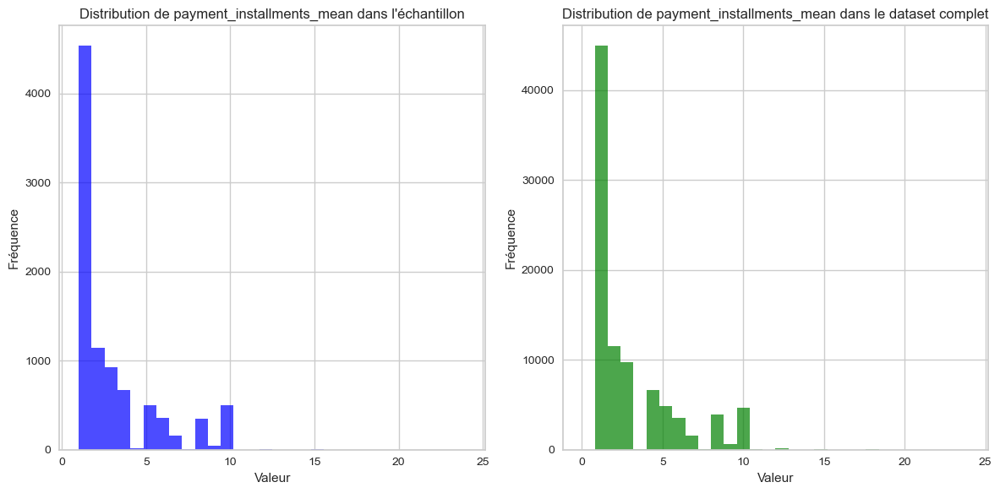

Feature: time_shipping_mean
Statistique du test KS: 0.0061698959688176735
P-value du test KS: 0.9041160106514294
Status: OK



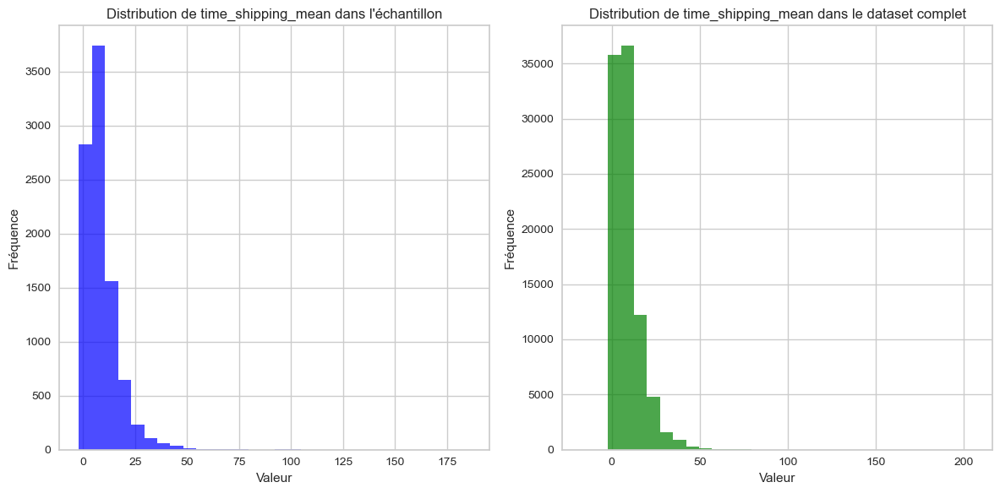

Feature: time_order_mean
Statistique du test KS: 0.006881584489425663
P-value du test KS: 0.8180897525052216
Status: OK



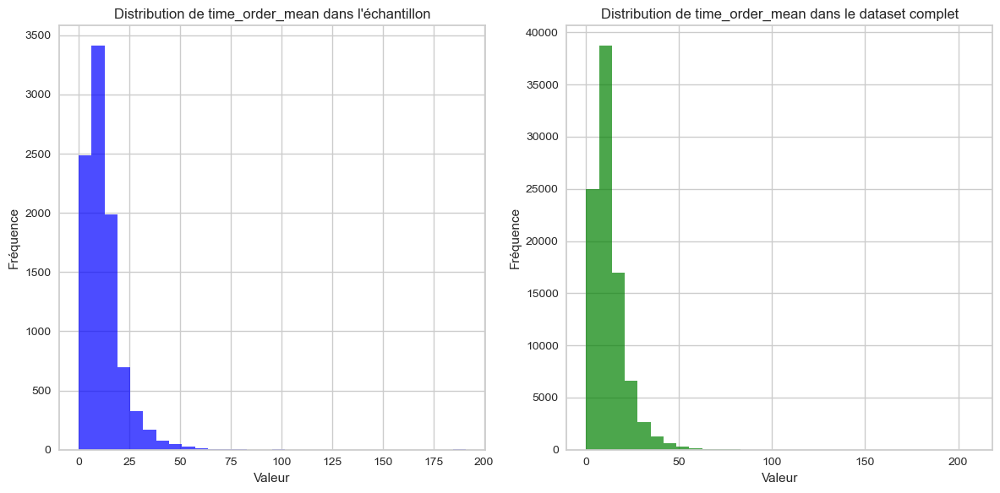

Feature: écart_Prév_mean
Statistique du test KS: 0.005302949187571848
P-value du test KS: 0.971074314828105
Status: OK



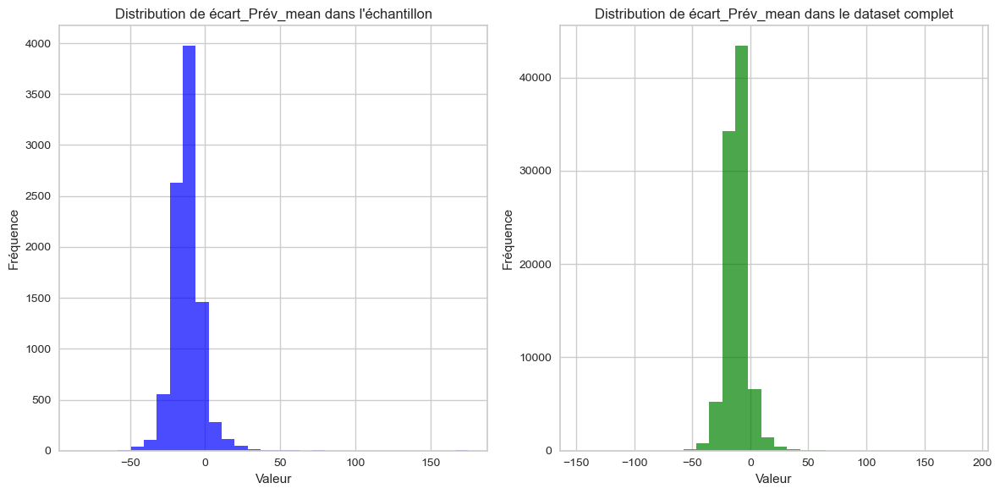

Feature: tot_ord_2016
Statistique du test KS: 0.0003242986040885576
P-value du test KS: 1.0
Status: OK



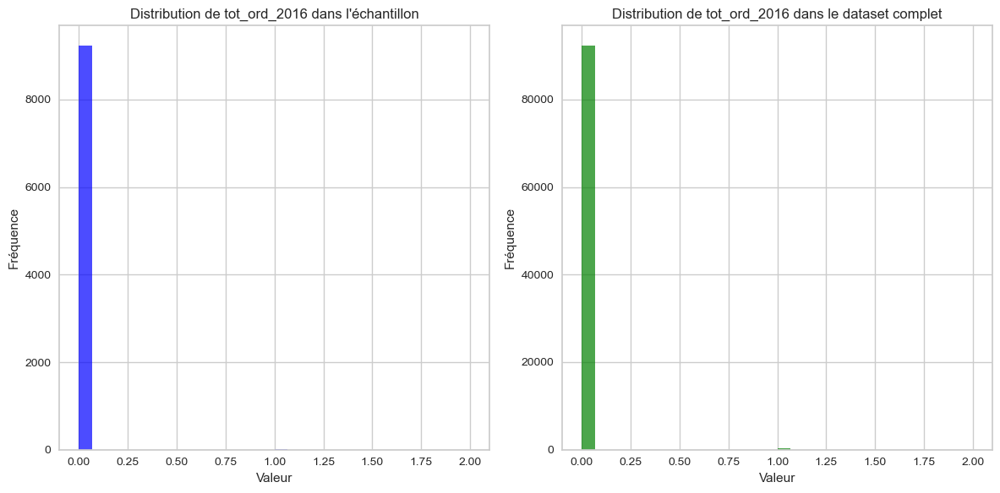

Feature: tot_ord_2017
Statistique du test KS: 0.0022067031683551397
P-value du test KS: 0.9999999999983018
Status: OK



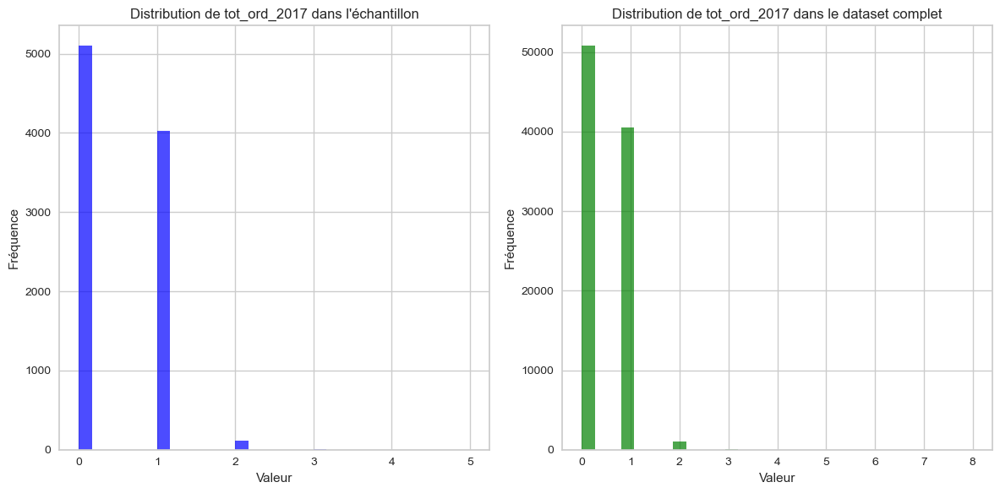

Feature: tot_ord_2018
Statistique du test KS: 0.0025095302459718916
P-value du test KS: 0.9999999988243607
Status: OK



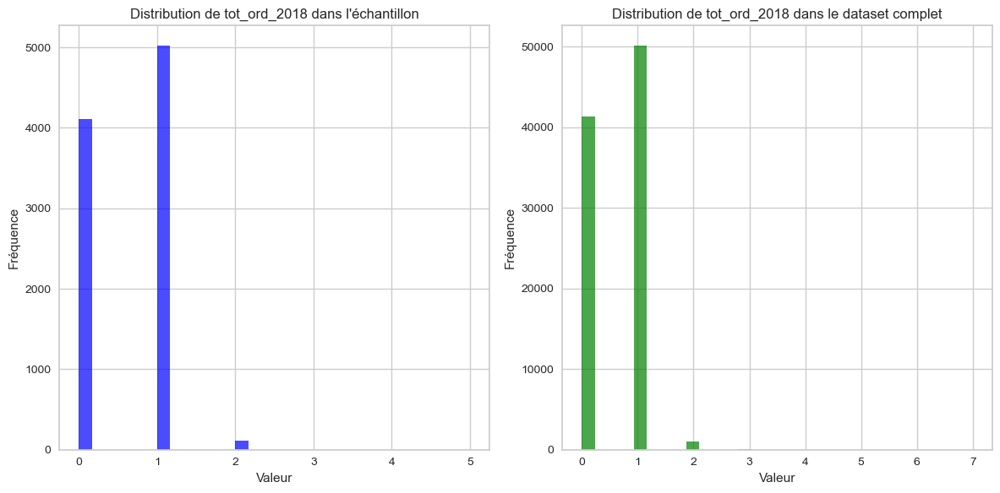

Feature: cat_Baby_Kids
Statistique du test KS: 0.005079813876840977
P-value du test KS: 0.9810013906878198
Status: OK



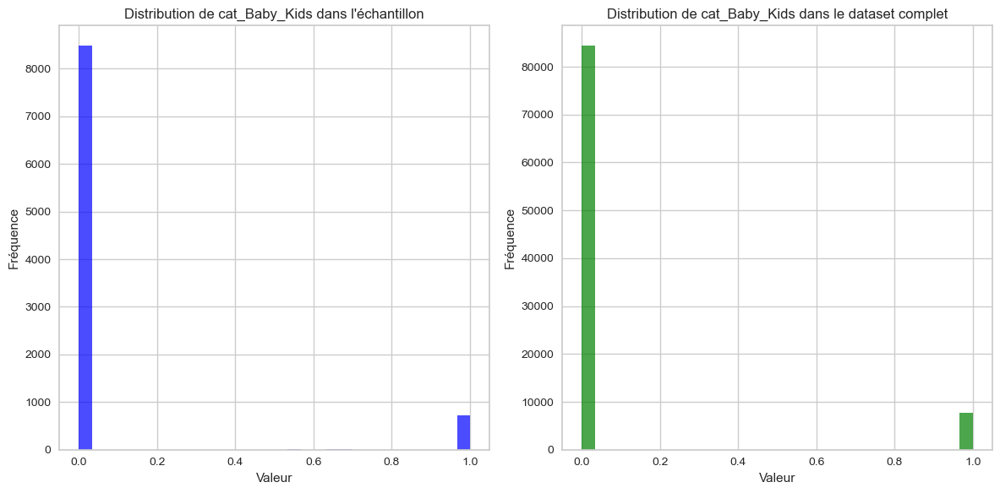

Feature: cat_Electronics_Computers
Statistique du test KS: 0.0028253912695903605
P-value du test KS: 0.9999998714547045
Status: OK



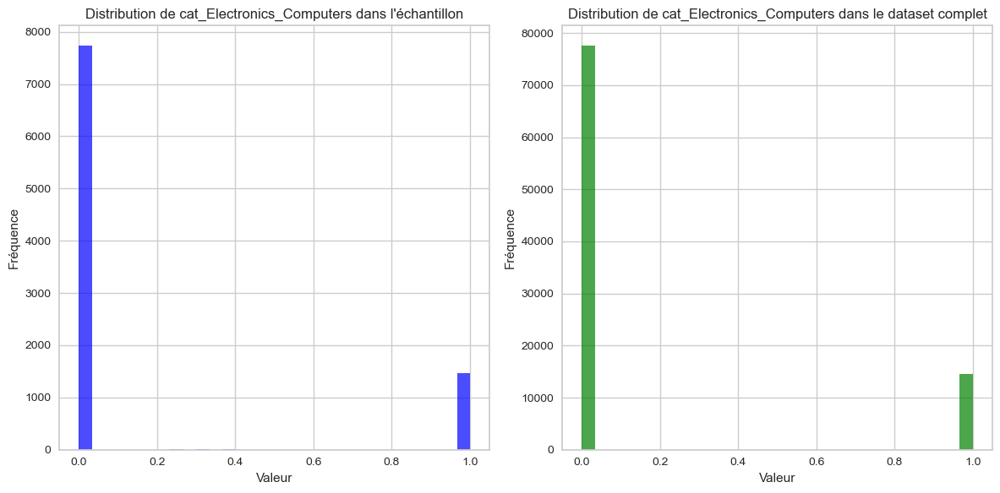

Feature: cat_Entertainment
Statistique du test KS: 0.00742520290650972
P-value du test KS: 0.7398701379601147
Status: OK



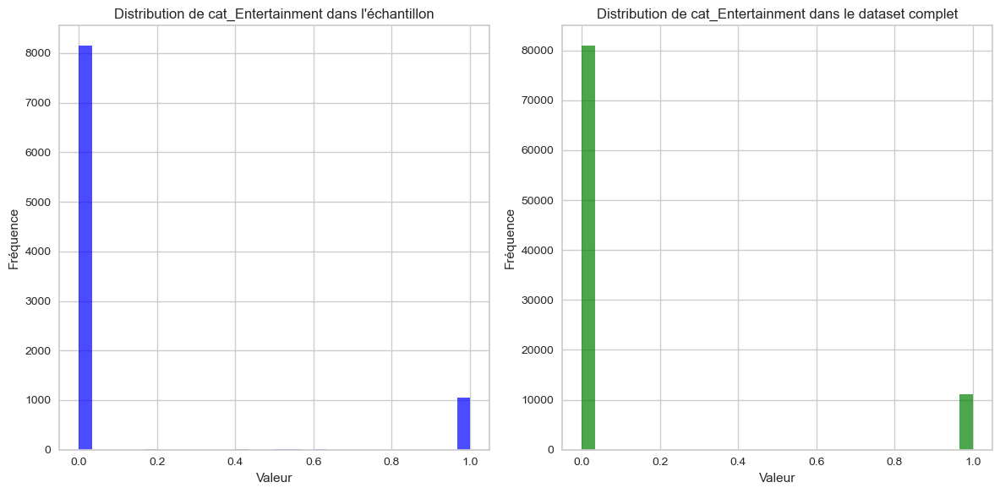

Feature: cat_Miscellaneous
Statistique du test KS: 0.0024828883927588974
P-value du test KS: 0.99999999927297
Status: OK



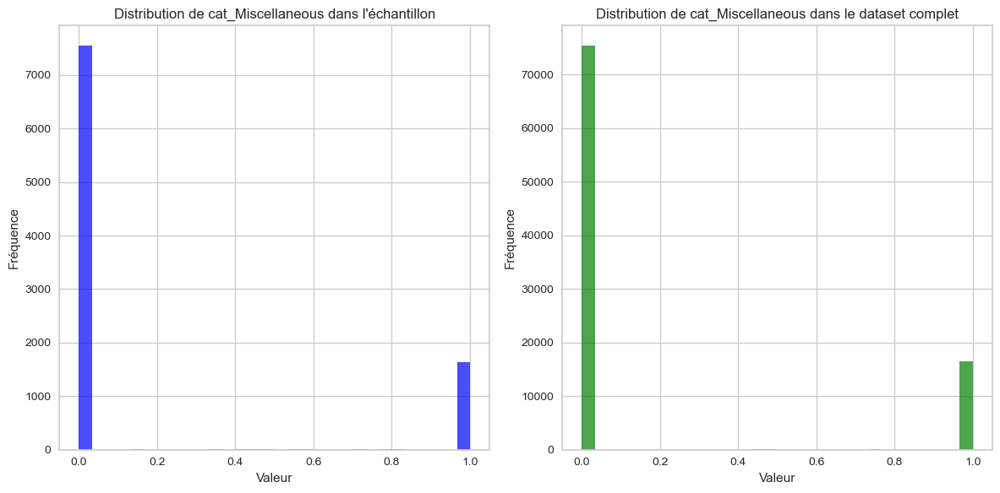

Feature: time_since_last_purch
Statistique du test KS: 0.004781719933516615
P-value du test KS: 0.990201892642558
Status: OK



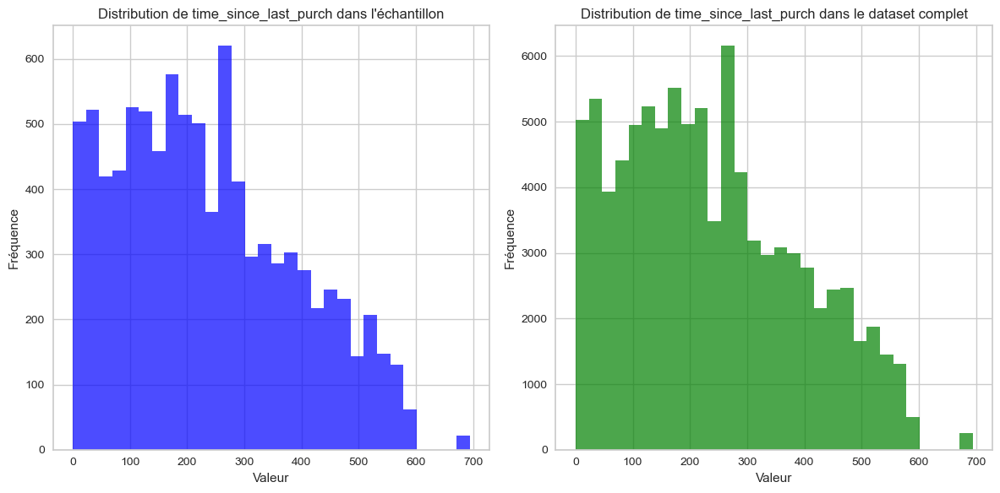

Feature: time_since_first_purch
Statistique du test KS: 0.005441096156588832
P-value du test KS: 0.9634802547329024
Status: OK



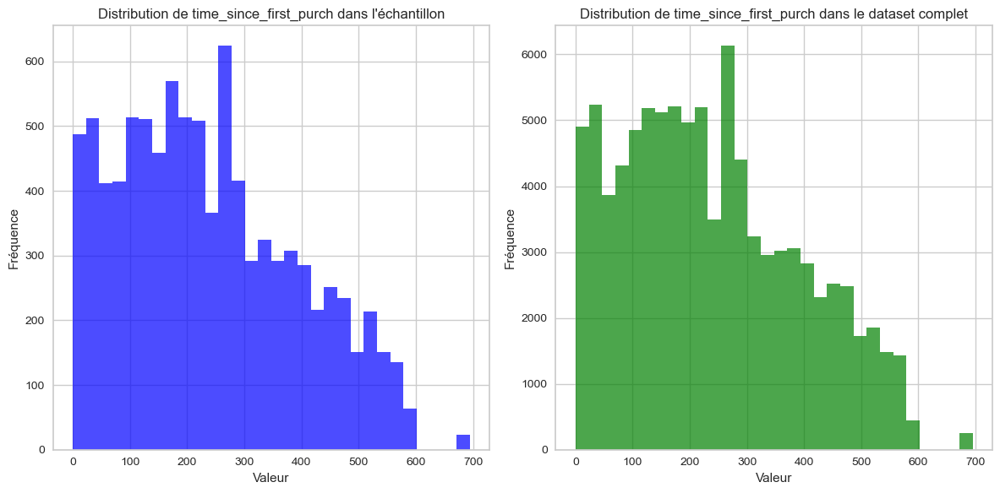

Feature: mean_items_per_order
Statistique du test KS: 0.0015374912841477073
P-value du test KS: 1.0
Status: OK



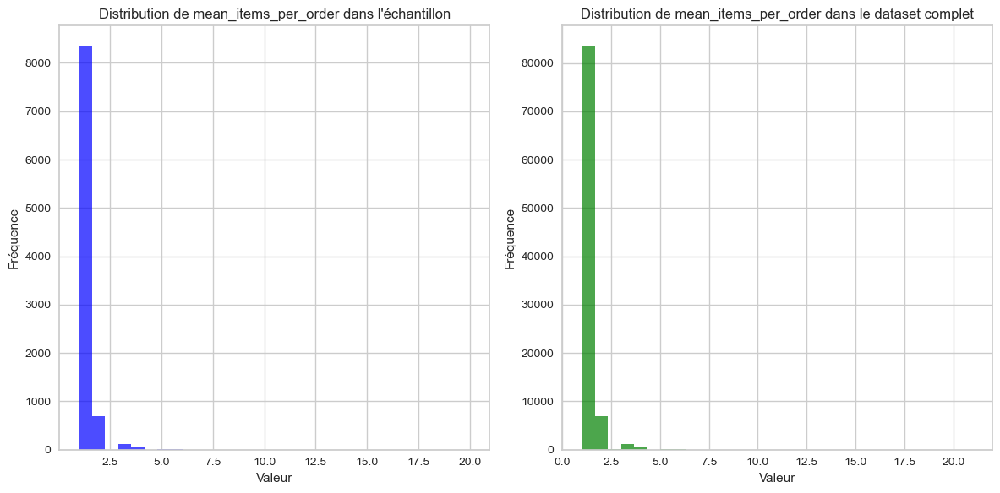

Feature: mean_price_per_order
Statistique du test KS: 0.008713450074191054
P-value du test KS: 0.5428555296306272
Status: OK



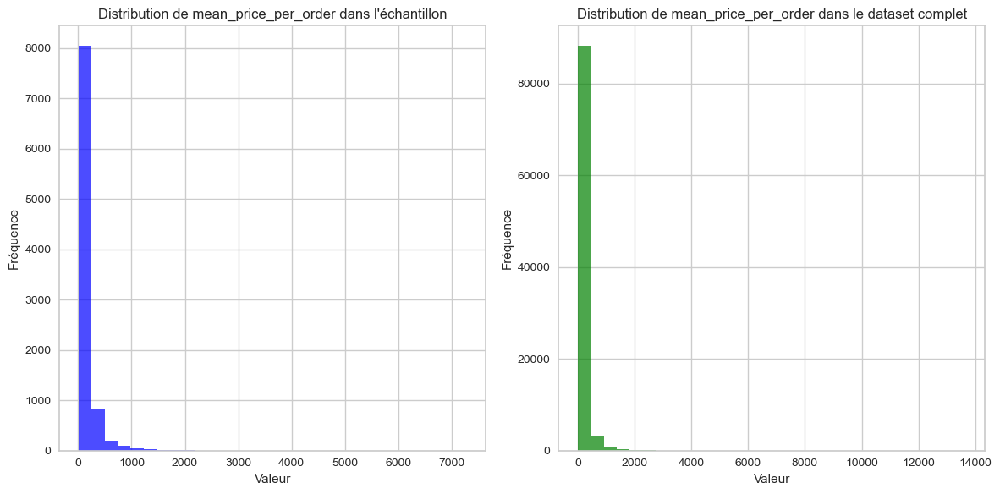

Feature: payment_is_credit_card
Statistique du test KS: 0.0013356229312292967
P-value du test KS: 1.0
Status: OK



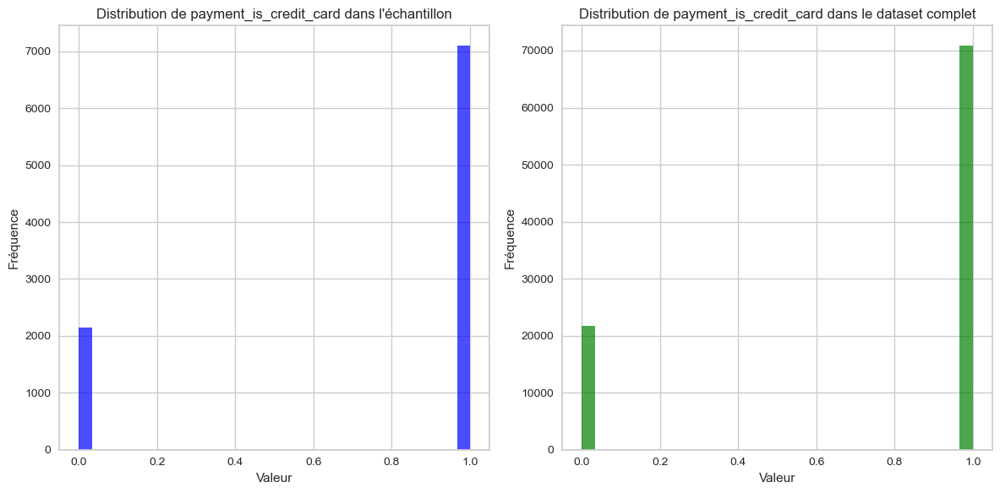

Feature: cat_Health_Beauty_clothing
Statistique du test KS: 0.003690048050816852
P-value du test KS: 0.9998275194133075
Status: OK



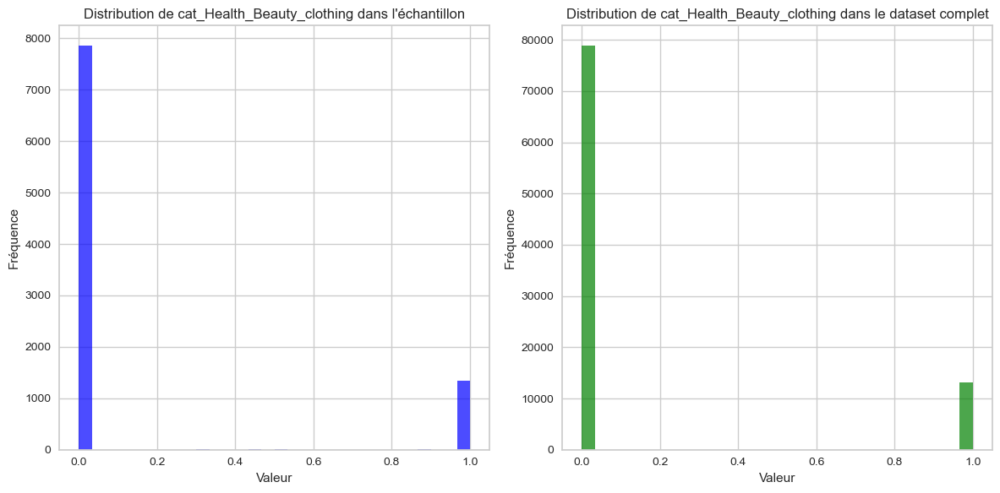

Feature: cat_Home_Tools
Statistique du test KS: 0.008310282653708811
P-value du test KS: 0.6039551721895986
Status: OK



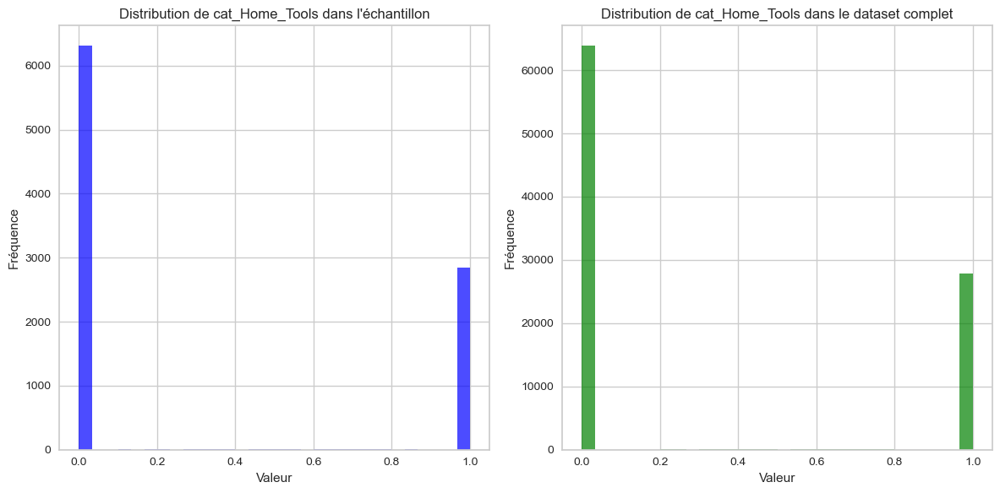

Feature: single/mult_orders
Statistique du test KS: 0.002119798895027225
P-value du test KS: 0.9999999999998482
Status: OK



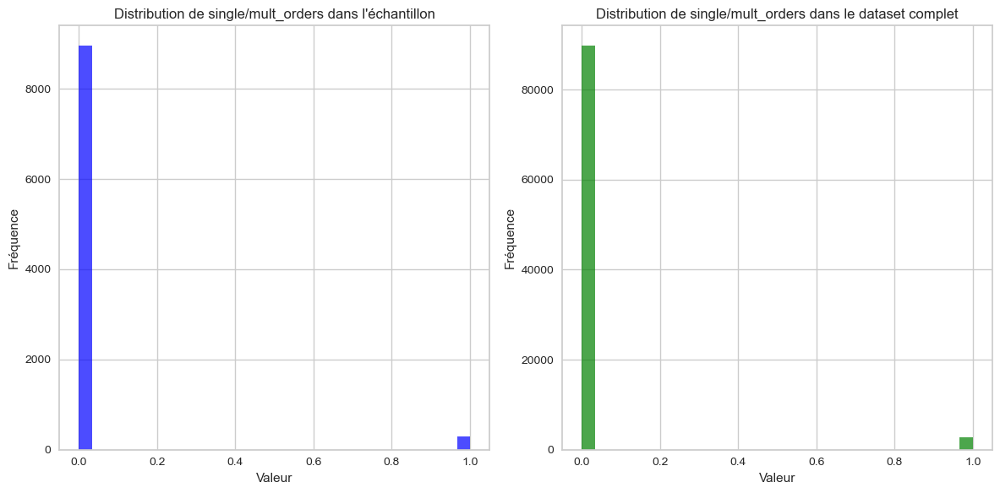

Feature: ratio_freight
Statistique du test KS: 0.006991968568977047
P-value du test KS: 0.8028659191934704
Status: OK



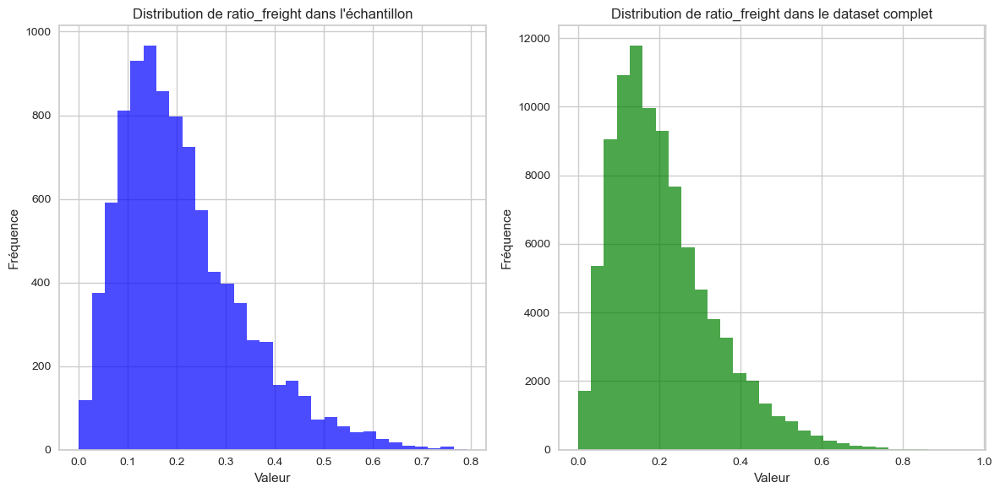

In [14]:
# Chargement des donnée
data = df.copy()

# Échantillonnage aléatoire simple (10% du dataset)
sample_data = data.sample(frac=0.1, random_state=1)

# Fonction pour effectuer le test KS sur toutes les colonnes numériques
def ks_test_all_features(full_data, sample, alpha=0.05):
    results = {}
    status = {}
    for column in full_data.select_dtypes(include=[np.number]).columns:
        statistic, p_value = ks_2samp(full_data[column], sample[column])
        results[column] = (statistic, p_value)
        status[column] = 'NOK' if p_value < alpha else 'OK'

        print(f"Feature: {column}")
        print(f"Statistique du test KS: {statistic}")
        print(f"P-value du test KS: {p_value}")
        print(f"Status: {status[column]}\n")

        # Visualisation des distributions
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        sample[column].hist(bins=30, alpha=0.7, color='blue', label='Échantillon')
        plt.title(f'Distribution de {column} dans l\'échantillon')
        plt.xlabel('Valeur')
        plt.ylabel('Fréquence')

        plt.subplot(1, 2, 2)
        full_data[column].hist(bins=30, alpha=0.7, color='green', label='Dataset complet')
        plt.title(f'Distribution de {column} dans le dataset complet')
        plt.xlabel('Valeur')
        plt.ylabel('Fréquence')

        plt.tight_layout()
        plt.show()

    return results, status

# Appliquer le test KS sur toutes les features
ks_results, ks_status = ks_test_all_features(data, sample_data)

# Création d'un DataFrame pour afficher les résultats
ks_results_df = pd.DataFrame(ks_results, index=['Statistique KS', 'P-value']).T
ks_results_df['Status'] = ks_status.values()

In [65]:
# Afficher les résultats features par features si OK nous pouvons échantillonner notre dataset en conservant la représentatitivé des données
ks_results_df

,Statistique KS,P-value,Status
customer_zip_code_prefix_most_frequent,0.005091,0.980576,OK
geolocation_lat_most_frequent,0.007384,0.746050,OK
geolocation_lng_most_frequent,0.003691,0.999826,OK
total_orders,0.002120,1.000000,OK
total_items,0.002143,1.000000,OK
total_price,0.007881,0.670294,OK
total_freight_value,0.004757,0.990778,OK
avg_product_description_length,0.010282,0.334176,OK
avg_product_weight_g,0.009136,0.481390,OK
avg_product_volume_cm3,0.007362,0.749383,OK


**Echantillonnage OK sur 10% sur dataset.**

## 2. Sélection des features + application du standard scaler

In [15]:
# Sélection des variables
db_col = [
    
    # Démographiques et Géographiques
    #'customer_unique_id', 
    #'customer_zip_code_prefix_most_frequent',
    #'customer_city_most_frequent', 
    #'customer_state_most_frequent',
    #'geolocation_lat_most_frequent', 
    #'geolocation_lng_most_frequent',
    
    # Comportement d'Achat
    'total_orders', 
    'total_items', 
    #'total_price', 
    #'total_freight_value',
    'time_since_last_purch', 
    #'time_since_first_purch',
    
    # Préférence Produit
    'avg_product_weight_g',
    'avg_product_volume_cm3',
    #'cat_Baby_Kids', 
    #'cat_Electronics_Computers', 
    #'cat_Entertainment', 
    #'cat_Miscellaneous',
    #'cat_Health_Beauty_clothing',
    #'cat_Home_Tools',
    
    # Satisfaction client
    'avg_review_score_mean',
    #'avg_délaiSatisfaction_mean',
    'total_characters_review_comment_message_sum',
    
    # Paiement et Transport
    'payment_value_sum', 
    'payment_installments_mean', 
    #'max_payment_sequential',
    #'payment_is_credit_card',
    'time_shipping_mean',
    #'time_order_mean', 
    'écart_Prév_mean', 
    #'ratio_freight',
    
    # Fréquence d'Achat
    'tot_ord_2016', 
    'tot_ord_2017', 
    'tot_ord_2018',
    #'mean_items_per_order', 
    #'mean_price_per_order',
    'single/mult_orders'
]

df_db = sample_data[db_col]
print('Afficher la structure du dataframe', df_db.shape)

Afficher la structure du dataframe (9249, 15)


In [16]:
# Création du scaler de sklearn
scaler = StandardScaler()

# Application du StandardScaler
X_scaled = scaler.fit_transform(df_db)

# Création d'un nouveau dataframe pour stocker les données mises à l'échelle
df_db_scaled = pd.DataFrame(X_scaled, columns=db_col)

## 3. Recherche des hyperparamètres optimaux

In [17]:
# Trouver l'epsilon optimal à l'aide du graphe des distances k-plus-proches-voisins
neighbors = NearestNeighbors(n_neighbors=5)
neighbors_fit = neighbors.fit(X_scaled)
distances, indices = neighbors_fit.kneighbors(X_scaled)

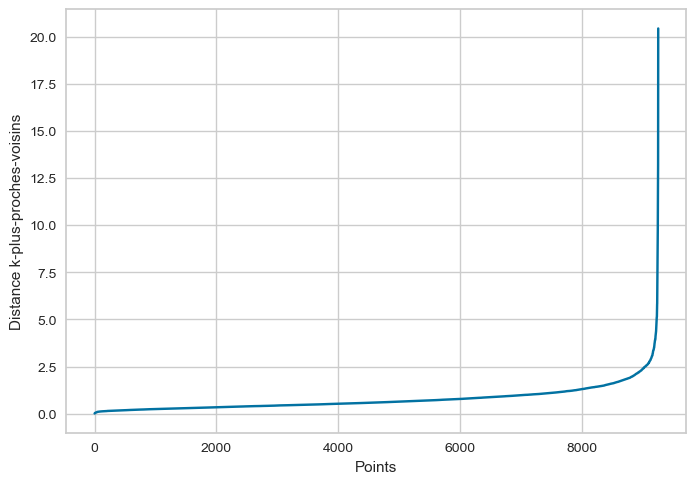

In [18]:
# Tracer les distances k-plus-proches-voisins
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
plt.xlabel('Points')
plt.ylabel('Distance k-plus-proches-voisins')
plt.show()

Nous pouvons voir que le coude de notre courbe se situe entre 2 & 3. Nous allons donc par la suite utiliser une gridsearchvalue avec des valeurs proches de celles-ci pour optimiser notre valeur epsilon.

In [14]:
# Définir la grille de paramètres
param_grid = {
    'eps': [2, 2.2, 2.4, 2.6, 3],
    'min_samples': [3, 5, 7, 10, 15]
}
grid = ParameterGrid(param_grid)

best_score = -1
best_params = None

for params in grid:
    db = DBSCAN(eps=params['eps'], min_samples=params['min_samples']).fit(X_scaled)
    labels = db.labels_
    
    # Ignorer les cas où tous les points sont considérés comme bruit
    if len(set(labels)) > 1:
        score = silhouette_score(X_scaled, labels)
        if score > best_score:
            best_score = score
            best_params = params

print(f"Meilleurs paramètres : {best_params}")
print(f"Meilleur score de silhouette : {best_score}")

Meilleurs paramètres : {'eps': 3, 'min_samples': 10}
Meilleur score de silhouette : 0.5180416235565252


Le silhouette score semble être plutôt intéressant, avec 0.518 même si cela reste encore loin de 1, avec une valeur eps = 3, et min = 10.
Néanmonis, si on se base sur la courbe des k voisins les plus proches, nous aurons peu d'intérêt à diminuer notre epsilon car nous aurons peu de de clusters formés. Essayons une modélisation avec eps = 3, et de voir combien de groupes nous aurons.
Dans le cas, où le nombre de clusters est trop faible, nous devrons diminuer notre eps pour essayer d'avoir 6 à 8 clusters de formés, pour qu'une interprétation métier soit possible.

## 4. Entrainement du DBSCAN

### a. Premier entrainement du modèle

In [15]:
# Appliquer DBSCAN sur les data normalisées
db = DBSCAN(eps=3, min_samples=10).fit(X_scaled)

In [16]:
# Extraire les labels des clusters
labels = db.labels_

# Compter le nombre de clusters
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = list(labels).count(-1)

print(f'Nombre de clusters formés: {n_clusters}')
print(f'Nombre de points considérés comme bruit: {n_noise}')

Nombre de clusters formés: 3
Nombre de points considérés comme bruit: 200


Le nombre de clusters est de 3. Trop faible pour avoir des profils clients plutôt précis et exploitables.
Nous allons ajuster nos hyperparamètres en prenant également en compte le nombre de clusters.

### b. Ajustement des hyperparamètres pour optimiser les nombre de clusters expoitables

In [69]:
# Essais avec différentes valeurs de eps et min_samples
eps_values = [1, 2, 3, 4]
min_samples_values = [5, 10, 15]

for eps in eps_values:
    for min_samples in min_samples_values:
        db = DBSCAN(eps=eps, min_samples=min_samples).fit(X_scaled)
        labels = db.labels_

        # Vérifiez le nombre de clusters et les métriques
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)
        
        if n_clusters > 1:
            silhouette = metrics.silhouette_score(X_scaled, labels)
            db_index = metrics.davies_bouldin_score(X_scaled, labels)
            ch_index = metrics.calinski_harabasz_score(X_scaled, labels)

            print(f'eps={eps}, min_samples={min_samples}')
            print(f'Nombre de clusters: {n_clusters}')
            print(f'Nombre de points considérés comme bruit: {n_noise}')
            print(f'Silhouette Score: {silhouette:.3f}')
            print(f'Davies-Bouldin Index: {db_index:.3f}')
            print(f'Calinski-Harabasz Index: {ch_index:.3f}')
            print('-'*40)


eps=1, min_samples=5
Nombre de clusters: 14
Nombre de points considérés comme bruit: 2804
Silhouette Score: -0.094
Davies-Bouldin Index: 1.608
Calinski-Harabasz Index: 171.468
----------------------------------------
eps=1, min_samples=10
Nombre de clusters: 4
Nombre de points considérés comme bruit: 3271
Silhouette Score: -0.029
Davies-Bouldin Index: 2.105
Calinski-Harabasz Index: 527.408
----------------------------------------
eps=1, min_samples=15
Nombre de clusters: 5
Nombre de points considérés comme bruit: 3641
Silhouette Score: -0.042
Davies-Bouldin Index: 1.978
Calinski-Harabasz Index: 406.935
----------------------------------------
eps=2, min_samples=5
Nombre de clusters: 7
Nombre de points considérés comme bruit: 562
Silhouette Score: 0.270
Davies-Bouldin Index: 1.558
Calinski-Harabasz Index: 614.248
----------------------------------------
eps=2, min_samples=10
Nombre de clusters: 6
Nombre de points considérés comme bruit: 672
Silhouette Score: 0.264
Davies-Bouldin Index: 

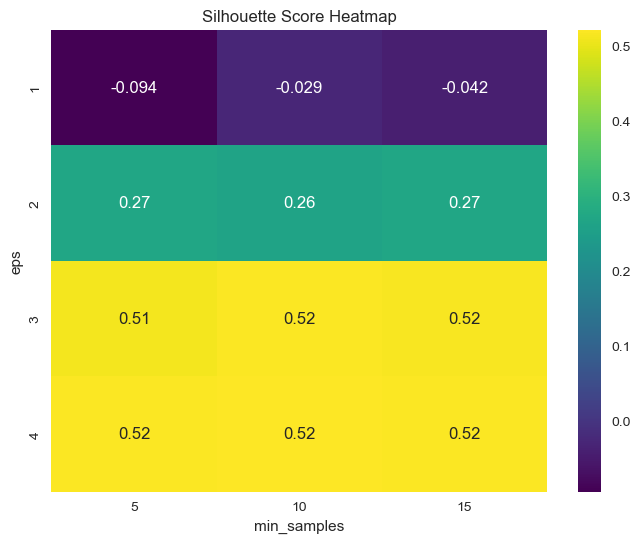

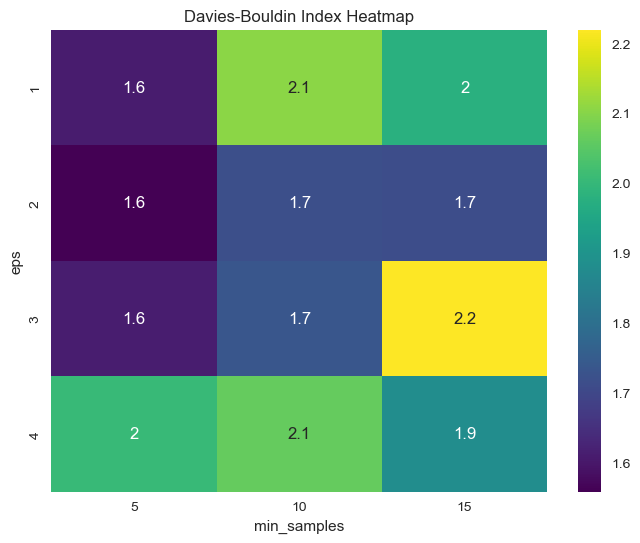

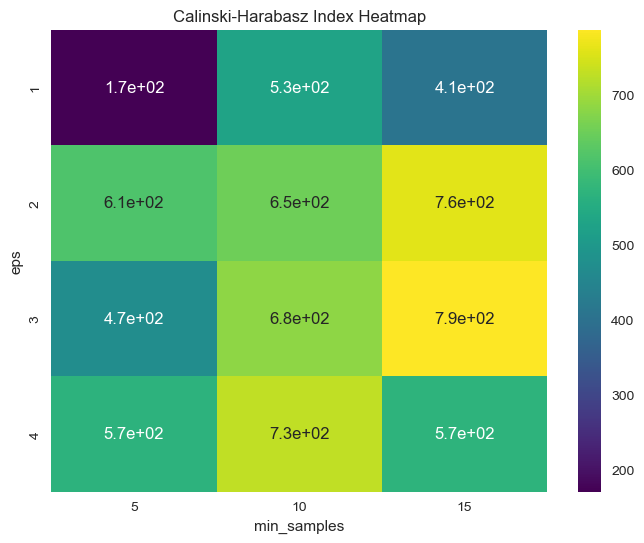

In [73]:
# Essais avec différentes valeurs de eps et min_samples
eps_values = [1, 2, 3, 4]
min_samples_values = [5, 10, 15]

# Stocker les résultats dans une liste
results = []

for eps in eps_values:
    for min_samples in min_samples_values:
        db = DBSCAN(eps=eps, min_samples=min_samples).fit(X_scaled)
        labels = db.labels_

        # Vérifiez le nombre de clusters et les métriques
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)
        
        if n_clusters > 1:
            silhouette = metrics.silhouette_score(X_scaled, labels)
            db_index = metrics.davies_bouldin_score(X_scaled, labels)
            ch_index = metrics.calinski_harabasz_score(X_scaled, labels)

            results.append((eps, min_samples, silhouette, db_index, ch_index))

# Convertir les résultats en DataFrame
df = pd.DataFrame(results, columns=['eps', 'min_samples', 'silhouette', 'db_index', 'ch_index'])

# Créer des heatmaps pour chaque métrique
def plot_heatmap(metric, title):
    heatmap_data = df.pivot(index="eps", columns="min_samples", values=metric)
    plt.figure(figsize=(8, 6))
    sns.heatmap(heatmap_data, annot=True, cmap="viridis")
    plt.title(title)
    plt.show()

# Heatmap pour Silhouette Score
plot_heatmap('silhouette', 'Silhouette Score Heatmap')

# Heatmap pour Davies-Bouldin Index
plot_heatmap('db_index', 'Davies-Bouldin Index Heatmap')

# Heatmap pour Calinski-Harabasz Index
plot_heatmap('ch_index', 'Calinski-Harabasz Index Heatmap')

Cette configuration semble le meilleurs compromis de toutes :

- eps=3, min_samples=5
  
- Nombre de clusters: 5
  
- Nombre de points considérés comme bruit: 149
  
- Silhouette Score: 0.512
  
- Davies-Bouldin Index: 1.612
  
- Calinski-Harabasz Index: 471.162

Néanmoins le nombre de 5 clusters me semble trop faible.. Je vais donc choisir celle-ci malgré des métriques de performances moins bons, je préfère priviligié l'aspect exploitation métier.


- eps=2, min_samples=5
  
- Nombre de clusters: 7
  
- Nombre de points considérés comme bruit: 562
  
- Silhouette Score: 0.270
  
- Davies-Bouldin Index: 1.558
  
- Calinski-Harabasz Index: 614.248


### c. Second entrainement du modèle

In [20]:
# Appliquer DBSCAN sur les data normalisées
db = DBSCAN(eps=2, min_samples=5).fit(X_scaled)

In [21]:
# Extraire les labels des clusters
labels = db.labels_

# Compter le nombre de clusters, en excluant le bruit (étiqueté -1)
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

# Compter le nombre de points considérés comme du bruit
n_noise = list(labels).count(-1)

print(f'Nombre de clusters formés: {n_clusters}')
print(f'Nombre de points considérés comme bruit: {n_noise}')

Nombre de clusters formés: 7
Nombre de points considérés comme bruit: 562


In [22]:
# Ajout des labels au dataframe
df_db_scaled['cluster'] = labels

In [23]:
# Inverser la transformation pour revenir aux valeurs d'origine
df_db_inverse = pd.DataFrame(scaler.inverse_transform(X_scaled), columns=db_col)
df_db_inverse['cluster'] = labels

# Calculer les moyennes des individus par cluster
cluster_means = df_db_inverse.groupby('cluster').mean()

# Afficher les moyennes par cluster
cluster_means

,total_orders,total_items,time_since_last_purch,avg_product_weight_g,avg_product_volume_cm3,avg_review_score_mean,total_characters_review_comment_message_sum,payment_value_sum,payment_installments_mean,time_shipping_mean,écart_Prév_mean,tot_ord_2016,tot_ord_2017,tot_ord_2018,single/mult_orders
cluster,,,,,,,,,,,,,,,
-1,1.281139,2.110320,268.085409,8662.101004,51864.672988,3.172143,69.345196,598.577171,5.374528,14.410408,-8.696303,0.032028,0.663701,0.585409,0.192171
0,1.000000,1.101043,377.359797,1752.693798,13422.279337,4.221064,24.672815,135.776562,2.898690,8.636728,-12.689655,0.000000,1.000000,0.000000,0.000000
1,1.000000,1.100527,121.400843,1643.248788,12155.713558,4.196417,25.630137,134.607437,2.619600,8.523498,-11.440042,0.000000,0.000000,1.000000,0.000000
2,2.000000,2.222222,369.152778,1069.312500,9348.399306,4.486111,38.152778,209.895278,2.645833,7.388889,-14.013889,0.000000,2.000000,0.000000,1.000000
3,2.000000,2.207317,120.390244,1096.474593,7567.153455,4.551829,44.621951,204.812317,2.804878,8.201220,-12.878049,0.000000,0.000000,2.000000,1.000000
4,2.000000,2.250000,127.444444,1922.069444,12115.569444,4.555556,24.611111,228.106944,2.847222,6.875000,-12.791667,0.000000,1.000000,1.000000,1.000000
5,1.000000,1.000000,691.833333,683.833333,8134.000000,4.666667,12.166667,136.298333,1.833333,2.333333,-38.833333,1.000000,0.000000,0.000000,0.000000
6,1.000000,3.800000,397.200000,671.250000,7161.600000,1.000000,135.200000,224.566000,8.800000,7.800000,-16.600000,0.000000,1.000000,0.000000,0.000000


In [24]:
# Transposer le DataFrame
cluster_centers_df_transposed = cluster_means.T

# Arrondir les valeurs à deux chiffres après la virgule et convertir en chaînes de caractères formatées
cluster_centers_df_transposed = cluster_centers_df_transposed.applymap(lambda x: f"{x:.3f}")

# Fonction pour appliquer la couleur en fonction de l'échelle de chaque ligne
def colorize_by_row(series):
    # Convertir les valeurs en flottants pour la normalisation
    series_float = series.astype(float)
    # Normaliser les valeurs entre 0 et 1 pour créer une échelle de couleurs
    normalized_values = (series_float - series_float.min()) / (series_float.max() - series_float.min())
    # Utiliser une colormap
    colors = plt.cm.RdYlBu(normalized_values)
    # Convertir les valeurs RGBA en valeurs hexadécimales
    hex_colors = [rgb2hex(color) for color in colors]
    return ['background-color: %s; color: black; font-weight: bold; font-size: 14px' % color for color in hex_colors]

# Convertir les valeurs RGBA en hexadécimal
def rgb2hex(rgb):
    return '#{:02x}{:02x}{:02x}'.format(int(rgb[0] * 255), int(rgb[1] * 255), int(rgb[2] * 255))

# Appliquer la couleur ligne par ligne
styled_df = cluster_centers_df_transposed.style.apply(colorize_by_row, axis=1)

# Afficher le DataFrame stylisé
styled_df


C:\Users\justi\AppData\Local\Temp\ipykernel_7364\2881231034.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  cluster_centers_df_transposed = cluster_centers_df_transposed.applymap(lambda x: f"{x:.3f}")


cluster,-1,0,1,2,3,4,5,6
total_orders,1.281,1.000,1.000,2.000,2.000,2.000,1.000,1.000
total_items,2.110,1.101,1.101,2.222,2.207,2.250,1.000,3.800
time_since_last_purch,268.085,377.360,121.401,369.153,120.390,127.444,691.833,397.200
avg_product_weight_g,8662.101,1752.694,1643.249,1069.312,1096.475,1922.069,683.833,671.250
avg_product_volume_cm3,51864.673,13422.279,12155.714,9348.399,7567.153,12115.569,8134.000,7161.600
avg_review_score_mean,3.172,4.221,4.196,4.486,4.552,4.556,4.667,1.000
total_characters_review_comment_message_sum,69.345,24.673,25.630,38.153,44.622,24.611,12.167,135.200
payment_value_sum,598.577,135.777,134.607,209.895,204.812,228.107,136.298,224.566
payment_installments_mean,5.375,2.899,2.620,2.646,2.805,2.847,1.833,8.800
time_shipping_mean,14.410,8.637,8.523,7.389,8.201,6.875,2.333,7.800


**Analyse métier des segments obtenus :**

**Profil n° -1 : le bruit (outliers) 562 clients soit 6.1%**
- Clients ayant effectué des grosses commandes, produits volumineux et onéreux, note moyenne pour les retours clients

**Profil n°0 : 3 741 clients soit 40.45%**
- Client avec une récence moyenne (2017), plutôt satisfait, commande unique. Cluster important en volume donc profil client sans distinction particulière à part la récence.

**Profil n°1 : 4 745 clients soit 51.3%**
- Client avec une récence bonne (2018), avec les mêmes caractéristiques que le cluster 0, même remarque, cluster important en taille. 

**Profil n°2 : 72 clients soit 0.77%**
- Client 

**Profil n°3 : 82 clients soit 0.88%**

**Profil n°4 : 36 clients soit 0.38%**

**Profil n°5 : 5 clients soit 0.

In [22]:
# Nombre de client par clusters
df_db = df_db.copy()
df_db['cluster'] = db.labels_
cluster_counts = df_db['cluster'].value_counts()

print("Nombre de clients par cluster:")
print(cluster_counts)

Nombre de clients par cluster:
cluster
 1    4745
 0    3741
-1     562
 3      82
 2      72
 4      36
 5       6
 6       5
Name: count, dtype: int64


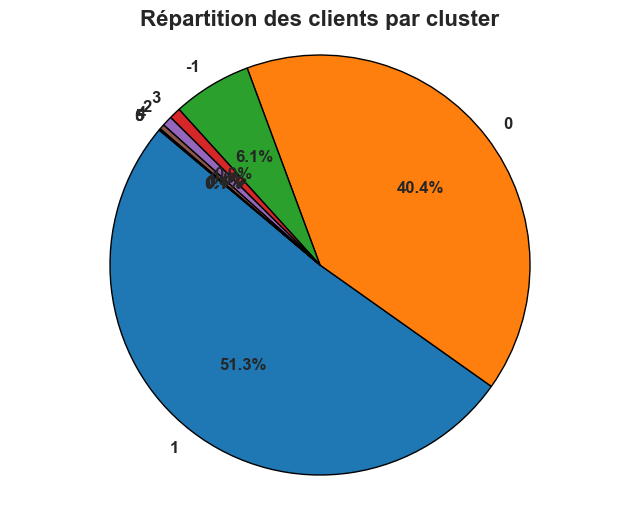

In [23]:
# Couleurs pour chaque cluster
colors = plt.cm.tab10.colors[:len(cluster_counts)]

# Création du diagramme circulaire
plt.figure(figsize=(8, 6))
plt.pie(cluster_counts, 
        labels=cluster_counts.index, 
        autopct='%1.1f%%', 
        startangle=140, 
        colors=colors, 
        wedgeprops={'edgecolor': 'black', 'linewidth': 1},
        textprops={'fontsize': 12, 'fontweight': 'bold'})
plt.axis('equal')
plt.title('Répartition des clients par cluster', fontsize=16, fontweight='bold')
plt.show()


### d. Métriques de la performance de notre clustering avec DBSCAN

In [24]:
# Silhouette Score
if len(set(labels)) > 1:
    silhouette = metrics.silhouette_score(X_scaled, labels)
    print(f'Silhouette Score: {silhouette:.3f}')
else:
    print('Silhouette Score: Not applicable (less than 2 clusters)')

# Davies-Bouldin Index
if len(set(labels)) > 1:
    db_index = metrics.davies_bouldin_score(X_scaled, labels)
    print(f'Davies-Bouldin Index: {db_index:.3f}')
else:
    print('Davies-Bouldin Index: Not applicable (less than 2 clusters)')

# Calinski-Harabasz Index

if len(set(labels)) > 1:
    ch_index = metrics.calinski_harabasz_score(X_scaled, labels)
    print(f'Calinski-Harabasz Index: {ch_index:.3f}')
else:
    print('Calinski-Harabasz Index: Not applicable (less than 2 clusters)')

Silhouette Score: 0.270
Davies-Bouldin Index: 1.558
Calinski-Harabasz Index: 614.248


### e. Faire une projection des clusters

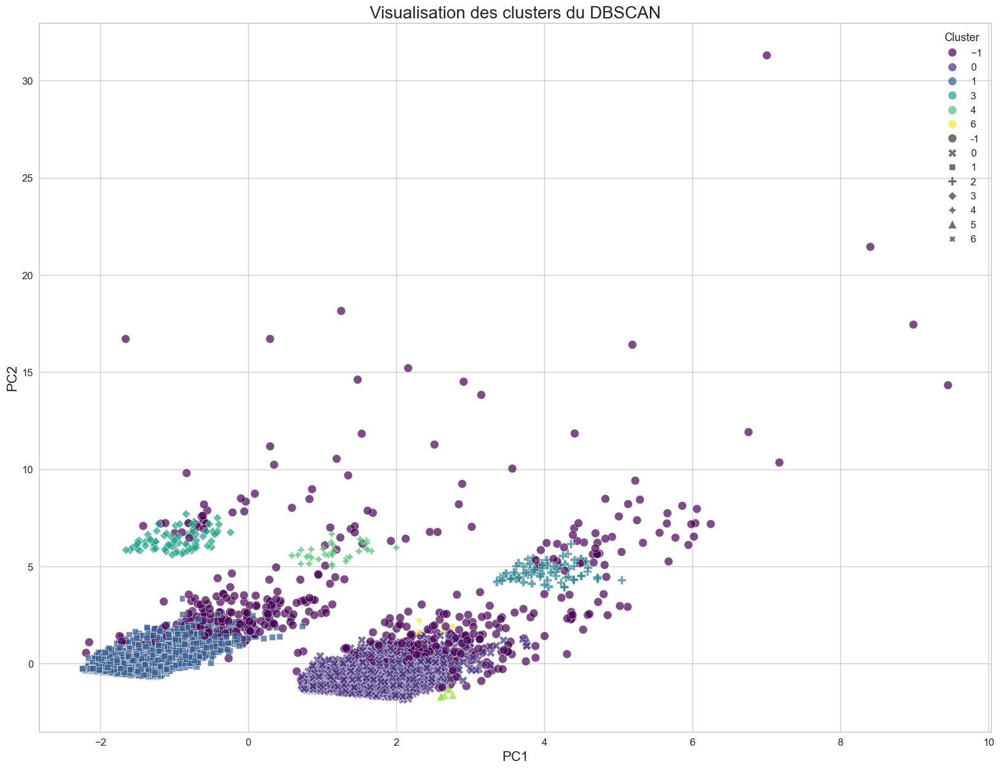

In [26]:
# Réduire les dimensions pour la visualisation
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Ajouter les labels des clusters aux données réduites
reduced_data_with_clusters = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
reduced_data_with_clusters['cluster'] = labels

# Visualisation avec ajustements
plt.figure(figsize=(20, 15))
sns.scatterplot(
    data=reduced_data_with_clusters, 
    x='PC1', 
    y='PC2', 
    hue='cluster', 
    palette='viridis', 
    style='cluster', 
    s=100,             
    alpha=0.7,         
    edgecolor='w',     
    linewidth=0.5
)
plt.title('Visualisation des clusters du DBSCAN', fontsize=20)
plt.xlabel('PC1', fontsize=16)
plt.ylabel('PC2', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(loc='upper right', title='Cluster', title_fontsize='13', fontsize='12')
plt.show()

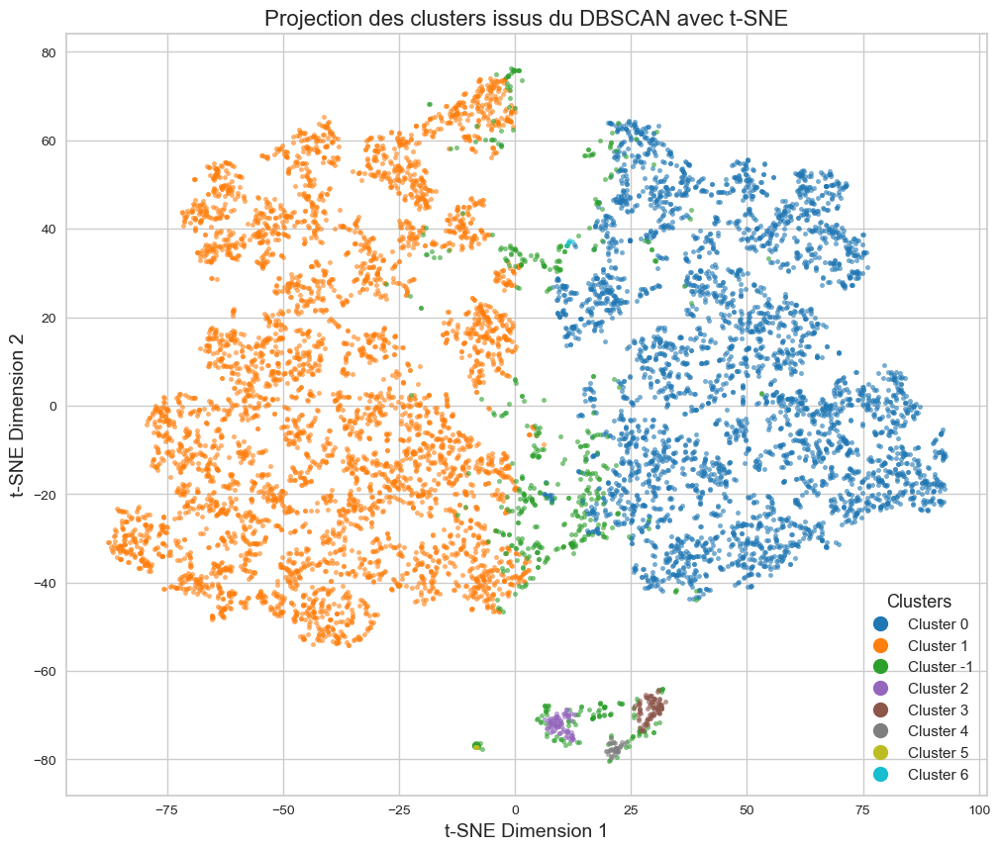

In [31]:
# Réduction de dimension avec t-SNE en spécifiant les paramètres init et learning_rate
tsne = TSNE(n_components=2, random_state=42, init='random', learning_rate=200.0)
cluster_tsne = tsne.fit_transform(df_db_scaled.drop(columns=['cluster']))

# Définir une palette de couleurs distinctes
cluster_labels = df_db_scaled['cluster'].unique()
n_clusters = len(cluster_labels)
colors = plt.colormaps['tab10'](np.linspace(0, 1, n_clusters))

# Tracer la projection des clusters
plt.figure(figsize=(12, 10))
for i, cluster_label in enumerate(cluster_labels):
    plt.scatter(cluster_tsne[df_db_scaled['cluster'] == cluster_label][:, 0], 
                cluster_tsne[df_db_scaled['cluster'] == cluster_label][:, 1], 
                s=10, alpha=0.6, label=f'Cluster {cluster_label}', color=colors[i])

# Créer des handles personnalisés pour la légende avec une taille de point plus grande
handles = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster_label}',
                  markerfacecolor=colors[i], markersize=11) for i, cluster_label in enumerate(cluster_labels)]

# Ajouter des éléments de style pour améliorer la lisibilité
plt.title('Projection des clusters issus du DBSCAN avec t-SNE', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)
plt.legend(title='Clusters', title_fontsize='13', fontsize='11', handles=handles)
plt.grid(True)
plt.show()

In [29]:
print("Nombre de clusters uniques:", n_clusters)
print("Clusters uniques:", df_db_scaled['cluster'].unique())

Nombre de clusters uniques: 7
Clusters uniques: [ 0  1 -1  2  3  4  5  6]


## Conclusion DBSCAN

Partitionnement peu harmonieux, en créant 2 clusters principaux le 0 et le 1. 
Le groupe du "bruit/ outliers" est assez important avec 6.1%, il est également supérieur au reste des clusters, qui sont en dessous des 1%.
Cette segmentation est à la fois peu exploitable dans une approche métier, et faible en performance concernant la modélisation.
nous perdons en performance plus le nombre de clusters augmentent.
Features selection à revoir, il semble que les 3 variables lié à la récence perturbent l'algorithme à atteindre des résultats convaincants, d'autres méthodes de pre-processing peuvent également être bénéfique pour améliorer les résultats que ce soit sur l'approche model_centric que sur l'approche métier (marketing)